In [ ]:
# universal import statements for all 



In [1]:
# Figure 1: biological weighting function



import glob as glob
import os
from collections import OrderedDict
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc4
import matplotlib.pyplot as plt
import matplotlib as mpl
from pylab import *; 
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

import csv
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300 # set dpi to 300, which is minimum required for GMD submission




In [197]:
file={}
file['diatom_damage']='/glade/work/jcoupe/misc_files/phaeo_dataextended.bio' # this file can be found on GLADE file systems or in Zenodo as "phaeo_dataextended.bio"

dataset=[]
dataset_dino=[]

num_ind = -6 #index for number
band1_ind=-5 #index for start of wavelength band
band2_ind=-4 #index for end of wavelength band
Einh_ind=-1 #index for epsilon

# These are lists that will store all of the information in the plain text file

indices=[] # indices used by the model for # of wavelength band 
band1=[] # the beginning of the wavelength band
band2=[] # the end of the wavelength band
midpoint_band12=[] # we are going to calculate the midpoint of the wavelength band for easy plotting
Einh=[] # the actual damage function for the wavelengths between band1 and band2

# Using an equation for small phytoplankton and coccolithophores

Einh_neale_thomas = [] # creating a new list for Neale and Thomas (2017)
midpoint_band12_neale_thomas=np.linspace(280,400,120) # going to construct our own spectral band here, valid from 290 nm to 400 nm with 100 intervals
for wavelength in midpoint_band12_neale_thomas: # this for loop goes through all the wavelengths in midpoint_band12_neale_thomas
    Einh_neale_thomas.append(-3.10572006e-15 *wavelength**6 + 6.2728452e-12 *wavelength**5 - 5.22236845e-09*wavelength**4 + 2.28848111e-06*wavelength**3 - 0.000554843743*wavelength**2 + 0.0702209062*wavelength - 3.59639531)

Einh_neale_thomas_UVC = []
midpoint_band12_neale_thomas_UVC=np.linspace(121,280,159)
BWF_280NM=Einh_neale_thomas[0]
AVG_SLOPE = abs(Einh_neale_thomas[0] - Einh_neale_thomas[10])
AVG_SLOPE = AVG_SLOPE * (midpoint_band12_neale_thomas[0] - midpoint_band12_neale_thomas[10])**-1
AVG_SLOPE = abs(AVG_SLOPE)
for wavelength in midpoint_band12_neale_thomas_UVC:
    Einh_neale_thomas_UVC.append(BWF_280NM + AVG_SLOPE*( abs(wavelength - 280)))
    #Einh_neale_thomas_UVC.append(BWF_280NM)
    #Einh_neale_thomas_UVC.append(-3.10572006e-15 *wavelength**6 + 6.2728452e-12 *wavelength**5 - 5.22236845e-09*wavelength**4 + 2.28848111e-06*wavelength**3 - 0.000554843743*wavelength**2 + 0.0702209062*wavelength - 3.59639531)


print('NEALE AND THOMAS STATISTICS')
print(AVG_SLOPE)
print(BWF_280NM)

Einh_lorenzo_UVB = [] 
midpoint_band12_lorenzo_UVB=np.linspace(280,320,40)
for wavelength in midpoint_band12_lorenzo_UVB:
        Einh_lorenzo_UVB.append(-1.40530706e-12*wavelength**6 + 2.39353416e-09*wavelength**5 - 1.68928198e-06*wavelength**4 + 6.31865068e-04*wavelength**3 - 1.31975456e-01*wavelength**2 + 1.45753274e+01*wavelength - 6.63797953e+02)

Einh_lorenzo_UVA = [] 
midpoint_band12_lorenzo_UVA=np.linspace(320,400,80)
for wavelength in midpoint_band12_lorenzo_UVA:
        Einh_lorenzo_UVA.append(8.89581784e-15*wavelength**6 - 1.93953328e-11*wavelength**5 + 1.76199028e-08*wavelength**4 - 8.53798419e-06*wavelength**3 + 2.32766669e-03*wavelength**2 - 3.38550975e-01*wavelength + 2.05261692e+01)

Einh_lorenzo_UVC = [] 
midpoint_band12_lorenzo_UVC=np.linspace(121,280,159)
BWF_280NM=Einh_lorenzo_UVB[0]
AVG_SLOPE = abs(Einh_lorenzo_UVB[0] - Einh_lorenzo_UVB[10])
AVG_SLOPE = AVG_SLOPE * (midpoint_band12_lorenzo_UVB[0] - midpoint_band12_lorenzo_UVB[10])**-1
AVG_SLOPE = abs(AVG_SLOPE)
for wavelength in midpoint_band12_lorenzo_UVC:
        Einh_lorenzo_UVC.append(BWF_280NM + AVG_SLOPE*( abs(wavelength - 280)))
        #Einh_lorenzo_UVC.append(BWF_280NM)
        #Einh_lorenzo_UVC.append(-1.40530706e-12*wavelength**6 + 2.39353416e-09*wavelength**5 - 1.68928198e-06*wavelength**4 + 6.31865068e-04*wavelength**3 - 1.31975456e-01*wavelength**2 + 1.45753274e+01*wavelength - 6.63797953e+02)



print('LORENZO STATISTICS')
print(AVG_SLOPE)
print(BWF_280NM)

# The below block of code reads in the file as if it is a csv file

with open(file['diatom_damage'], newline='') as csvfile:
    datareader = csv.reader(csvfile, delimiter=' ', quotechar='|')
    for row in datareader:
        dataset.append(row)
        indices.append(int(row[num_ind]))
        band1.append(float(row[band1_ind]))
        band2.append(float(row[band2_ind]))
        midpoint_band12.append(np.mean([float(row[band1_ind]),float(row[band2_ind])])) # calculates the mean wavelength
        Einh.append(float(row[Einh_ind]))

Einh_cullen_UVC=[]
midpoint_band12_cullen_UVC = np.linspace(121,280,159)
BWF_280NM=Einh[0]
AVG_SLOPE = abs(Einh[0] - Einh[10])
DIFF_X = abs(midpoint_band12[0] - midpoint_band12[10])
AVG_SLOPE = AVG_SLOPE * (DIFF_X**-1)
for wavelength in midpoint_band12_cullen_UVC:
        Einh_cullen_UVC.append(BWF_280NM + AVG_SLOPE*( abs(wavelength - midpoint_band12[0])))
        #Einh_lorenzo_UVC.append(BWF_280NM)
        #Einh_lorenzo_UVC.append(-1.40530706e-12*wavelength**6 + 2.39353416e-09*wavelength**5 - 1.68928198e-06*wavelength**4 + 6.31865068e-04*wavelength**3 - 1.31975456e-01*wavelength**2 + 1.45753274e+01*wavelength - 6.63797953e+02)


NEALE AND THOMAS STATISTICS
7.989174351252184e-05
0.0020263275390579594
LORENZO STATISTICS
0.00014326785715070372
0.0034194075421964953


In [198]:
# convert Cullen to spline using Einh and midpoint_band12
wavelength_UVB = midpoint_band12[0:39]
data_UVB = Einh[0:39]
wavelength_UVA = midpoint_band12[39:]
data_UVA = Einh[39:]


from scipy.interpolate import CubicSpline
cs = CubicSpline(wavelength_UVB,data_UVB)
midpoint_band12_cullen_UVB=np.linspace(280,315,35)
Einh_cullen_UVB_spline=cs(midpoint_band12_cullen_UVB)

cs = CubicSpline(wavelength_UVA,data_UVA)
midpoint_band12_cullen_UVA=np.linspace(316,400,84)
Einh_cullen_UVA_spline=cs(midpoint_band12_cullen_UVA)

midpoint_band_12_cullen_UVC = np.linspace(121,279,158)
BWF_280NM=Einh_cullen_UVB_spline[0]
AVG_SLOPE = abs(Einh_cullen_UVB_spline[0] - Einh_cullen_UVB_spline[10])
DIFF_X = abs(midpoint_band12_cullen_UVB[0] - midpoint_band12_cullen_UVB[10])
AVG_SLOPE = AVG_SLOPE * (DIFF_X**-1)
Einh_cullen_UVC_custom=[]
for wavelength in midpoint_band12_cullen_UVC:
        delta_lambda = abs(wavelength - midpoint_band12_cullen_UVC[-1])**2
        Einh_cullen_UVC_custom.append(BWF_280NM + AVG_SLOPE*delta_lambda)
        #print(str(wavelength)[0:6]+'-'+str(midpoint_band12_cullen_UVC[-1]))


spline_wavelengths_cullen=[]
spline_data_cullen = []

for i in range(len(midpoint_band12_cullen_UVC)):
    wl = midpoint_band12_cullen_UVC[i]
    dt = Einh_cullen_UVC_custom[i]
    spline_wavelengths_cullen.append(wl)
    spline_data_cullen.append(dt)
    
for i in range(len(midpoint_band12_cullen_UVB)):
    wl = midpoint_band12_cullen_UVB[i]
    dt = Einh_cullen_UVB_spline[i]
    spline_wavelengths_cullen.append(wl)
    spline_data_cullen.append(dt)


for i in range(len(midpoint_band12_cullen_UVA)):
    wl = midpoint_band12_cullen_UVA[i]
    dt = Einh_cullen_UVA_spline[i] #data_UVA[i]
    spline_wavelengths_cullen.append(wl)
    spline_data_cullen.append(dt)


In [199]:
# convert Neale and Thomas 2017 prochlorococcus to cubic spline 
#Einh_neale_thomas
midpoint_band12_neale_thomas[:] # 280 to 400 nm total 
midpoint_band12_neale_thomas_UVC = np.linspace(121,279,158) # create a new one 

BWF_280NM=Einh_neale_thomas[0] # this will be equiv to 280 nm 
AVG_SLOPE = abs(Einh_neale_thomas[0] - Einh_neale_thomas[10])
DIFF_X = abs(midpoint_band12_neale_thomas[0] - midpoint_band12_neale_thomas[10])
AVG_SLOPE = AVG_SLOPE * (DIFF_X**-1)
Einh_neale_UVC_custom=[]
for wavelength in midpoint_band12_neale_thomas_UVC:
        delta_lambda = abs(wavelength - midpoint_band12_neale_thomas_UVC[-1])**2
        Einh_neale_UVC_custom.append(BWF_280NM + AVG_SLOPE*delta_lambda)


spline_wavelengths_neale=[]
spline_data_neale = []

for i in range(len(midpoint_band12_neale_thomas_UVC)):
    wl = midpoint_band12_neale_thomas_UVC[i]
    dt = Einh_neale_UVC_custom[i]
    spline_wavelengths_neale.append(wl)
    spline_data_neale.append(dt)
    
for i in range(len(midpoint_band12_neale_thomas)):
    wl = midpoint_band12_neale_thomas[i]
    dt = Einh_neale_thomas[i]
    spline_wavelengths_neale.append(wl)
    spline_data_neale.append(dt)

'''
for i in range(len(midpoint_band12_cullen_UVA)):
    wl = midpoint_band12_cullen_UVA[i]
    dt = Einh_cullen_UVA_spline[i] #data_UVA[i]
    spline_wavelengths_neale.append(wl)
    spline_data_neale.append(dt)
'''
spline_wavelengths_neale_UVC = spline_wavelengths_neale[0:158]
spline_data_neale_UVC = spline_data_neale[0:158]

spline_wavelengths_neale_UVB_UVA = spline_wavelengths_neale[158:]
spline_data_neale_UVB_UVA = spline_data_neale[158:]
#spline_wavelengths_neale_UVC



In [200]:
# convert lorenzo et al 2019 to cubic spline for uv-c radiation extrapolation
midpoint_band12_lorenzo_UVC
Einh_lorenzo_UVC
midpoint_band12_lorenzo_UVB
Einh_lorenzo_UVB
midpoint_band12_lorenzo_UVA
Einh_lorenzo_UVA

BWF_280NM=Einh_lorenzo_UVB[0] # this will be equiv to 280 nm 
AVG_SLOPE = abs(Einh_lorenzo_UVB[0] - Einh_lorenzo_UVB[10])
DIFF_X = abs(midpoint_band12_lorenzo_UVB[0] - midpoint_band12_lorenzo_UVB[10])
AVG_SLOPE = AVG_SLOPE * (DIFF_X**-1)
Einh_lorenzo_UVC_custom=[]
for wavelength in midpoint_band12_lorenzo_UVC:
        delta_lambda = abs(wavelength - midpoint_band12_lorenzo_UVB[0])**2
        Einh_lorenzo_UVC_custom.append(BWF_280NM + AVG_SLOPE*delta_lambda)

spline_wavelengths_lorenzo=[]
spline_data_lorenzo = []

for i in range(len(midpoint_band12_lorenzo_UVC)):
    wl = midpoint_band12_lorenzo_UVC[i]
    dt = Einh_lorenzo_UVC_custom[i]
    spline_wavelengths_lorenzo.append(wl)
    spline_data_lorenzo.append(dt)
    
for i in range(len(midpoint_band12_lorenzo_UVB)):
    wl = midpoint_band12_lorenzo_UVB[i]
    dt = Einh_lorenzo_UVB[i]
    spline_wavelengths_lorenzo.append(wl)
    spline_data_lorenzo.append(dt)

for i in range(len(midpoint_band12_lorenzo_UVA)):
    wl = midpoint_band12_lorenzo_UVA[i]
    dt = Einh_lorenzo_UVA[i]
    spline_wavelengths_lorenzo.append(wl)
    spline_data_lorenzo.append(dt)


spline_wavelengths_lorenzo_UVC = spline_wavelengths_lorenzo[0:159]
spline_data_lorenzo_UVC = spline_data_lorenzo[0:159]

spline_wavelengths_lorenzo_UVB_UVA = spline_wavelengths_lorenzo[159:]
spline_data_lorenzo_UVB_UVA = spline_data_lorenzo[159:]
#spline_wavelengths_lorenzo_UVB_UVA

In [201]:
file['NT2014']='/glade/work/jcoupe/ImpactPaper/NT2014_synechococcus.csv' # THIS IS THE SPLINE NOW !!!!

data =[]
wavelength=[]

with open(file['NT2014'], newline='') as csvfile:
    datareader = csv.reader(csvfile, delimiter=',', quotechar='|')
    for row in datareader:
        dataset.append(row)
        data.append(float(row[1]))
        wavelength.append(float(row[0]))
       

einh_syn_raw = data
wavelengths_syn = wavelength

# add cubic hermite spline estimate 
wavelength_UVB = wavelengths_syn[0:27]
data_UVB = einh_syn_raw[0:27]
wavelength_UVA=wavelengths_syn[26:]
data_UVA = einh_syn_raw[26:]

from scipy.interpolate import CubicSpline
cs = CubicSpline(wavelength_UVB,data_UVB)
midpoint_band12_gao_cocco_UVB=np.linspace(200,315,115)
Einh_gao_cocco_UVB=cs(midpoint_band12_gao_cocco_UVB)

cs = CubicSpline(wavelength_UVA,data_UVA)
midpoint_band12_gao_cocco_UVA=np.linspace(316,400,84)
Einh_gao_cocco_UVA=cs(midpoint_band12_gao_cocco_UVA)

spline_wavelengths_syn=[]
spline_data_syn = []
for i in range(len(midpoint_band12_gao_cocco_UVB)):
    wl = midpoint_band12_gao_cocco_UVB[i]
    dt = Einh_gao_cocco_UVB[i]
    spline_wavelengths_syn.append(wl)
    spline_data_syn.append(dt)


for i in range(len(midpoint_band12_gao_cocco_UVA)):
    wl = midpoint_band12_gao_cocco_UVA[i]
    dt = Einh_gao_cocco_UVA[i] #data_UVA[i]
    spline_wavelengths_syn.append(wl)
    spline_data_syn.append(dt)



In [202]:
midpoint_band12_gao_cocco_UVC = midpoint_band12_gao_cocco_UVB[0:80]
Einh_gao_cocco_UVC = Einh_gao_cocco_UVB[0:80]

midpoint_band12_gao_cocco_UVB = midpoint_band12_gao_cocco_UVB[80:]
Einh_gao_cocco_UVB = Einh_gao_cocco_UVB[80:]
#midpoint_band12_gao_cocco_UVC

spline_wavelengths_syn_UVB_UVA=[]
spline_data_syn_UVB_UVA = []
for i in range(len(midpoint_band12_gao_cocco_UVB)):
    wl = midpoint_band12_gao_cocco_UVB[i]
    dt = Einh_gao_cocco_UVB[i]
    spline_wavelengths_syn_UVB_UVA.append(wl)
    spline_data_syn_UVB_UVA.append(dt)


for i in range(len(midpoint_band12_gao_cocco_UVA)):
    wl = midpoint_band12_gao_cocco_UVA[i]
    dt = Einh_gao_cocco_UVA[i] #data_UVA[i]
    spline_wavelengths_syn_UVB_UVA.append(wl)
    spline_data_syn_UVB_UVA.append(dt)


spline_wavelengths_syn_UVC=[]
spline_data_syn_UVC = []
for i in range(len(midpoint_band12_gao_cocco_UVC)):
    wl = midpoint_band12_gao_cocco_UVC[i]
    dt = Einh_gao_cocco_UVC[i]
    spline_wavelengths_syn_UVC.append(wl)
    spline_data_syn_UVC.append(dt)


In [203]:
from scipy.interpolate import CubicHermiteSpline

In [204]:
# get new equation for new  coccolithophores

file['coccoguan'] = '/glade/work/jcoupe/ImpactPaper/coccoguan2009.csv'

data =[]
wavelength=[]

with open(file['coccoguan'], newline='') as csvfile:
    datareader = csv.reader(csvfile, delimiter=',', quotechar='|')
    for row in datareader:
        dataset.append(row)
        data.append(float(row[1]))
        wavelength.append(float(row[0]))
       

Einh_gao_cocco_raw = data
wavelengths_gao_cocco = wavelength

In [205]:
x = wavelength
y = data
p = CubicHermiteSpline(x=x,y=y,dydx=np.zeros_like(y))

wavelength_UVB = wavelength[0:10]
data_UVB = data[0:10]
wavelength_UVA = wavelength[10:]
data_UVA = data[10:]

# try new spline method 
from scipy.interpolate import CubicSpline
cs = CubicSpline(wavelength_UVB,data_UVB)
midpoint_band12_gao_cocco_UVB=np.linspace(200,315,115)
Einh_gao_cocco_UVB=cs(midpoint_band12_gao_cocco_UVB)

cs = CubicSpline(wavelength_UVA,data_UVA)
midpoint_band12_gao_cocco_UVA=np.linspace(316,400,84)
Einh_gao_cocco_UVA=cs(midpoint_band12_gao_cocco_UVA)

spline_wavelengths=[]
spline_data = []
for i in range(len(midpoint_band12_gao_cocco_UVB)):
    wl = midpoint_band12_gao_cocco_UVB[i]
    dt = Einh_gao_cocco_UVB[i]
    spline_wavelengths.append(wl)
    spline_data.append(dt)


for i in range(len(midpoint_band12_gao_cocco_UVA)):
    wl = midpoint_band12_gao_cocco_UVA[i]
    dt = Einh_gao_cocco_UVA[i] #data_UVA[i]
    spline_wavelengths.append(wl)
    spline_data.append(dt)



In [206]:
midpoint_band12_gao_cocco_UVC = midpoint_band12_gao_cocco_UVB[0:80]
Einh_gao_cocco_UVC = Einh_gao_cocco_UVB[0:80]

midpoint_band12_gao_cocco_UVB = midpoint_band12_gao_cocco_UVB[80:]
Einh_gao_cocco_UVB = Einh_gao_cocco_UVB[80:]
#midpoint_band12_gao_cocco_UVC

spline_wavelengths_gao_UVB_UVA=[]
spline_data_gao_UVB_UVA = []
for i in range(len(midpoint_band12_gao_cocco_UVB)):
    wl = midpoint_band12_gao_cocco_UVB[i]
    dt = Einh_gao_cocco_UVB[i]
    spline_wavelengths_gao_UVB_UVA.append(wl)
    spline_data_gao_UVB_UVA.append(dt)


for i in range(len(midpoint_band12_gao_cocco_UVA)):
    wl = midpoint_band12_gao_cocco_UVA[i]
    dt = Einh_gao_cocco_UVA[i] #data_UVA[i]
    spline_wavelengths_gao_UVB_UVA.append(wl)
    spline_data_gao_UVB_UVA.append(dt)


spline_wavelengths_gao_UVC=[]
spline_data_gao_UVC = []
for i in range(len(midpoint_band12_gao_cocco_UVC)):
    wl = midpoint_band12_gao_cocco_UVC[i]
    dt = Einh_gao_cocco_UVC[i]
    spline_wavelengths_gao_UVC.append(wl)
    spline_data_gao_UVC.append(dt)


spline_wavelengths_gao = spline_wavelengths
spline_data_gao  = spline_data


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


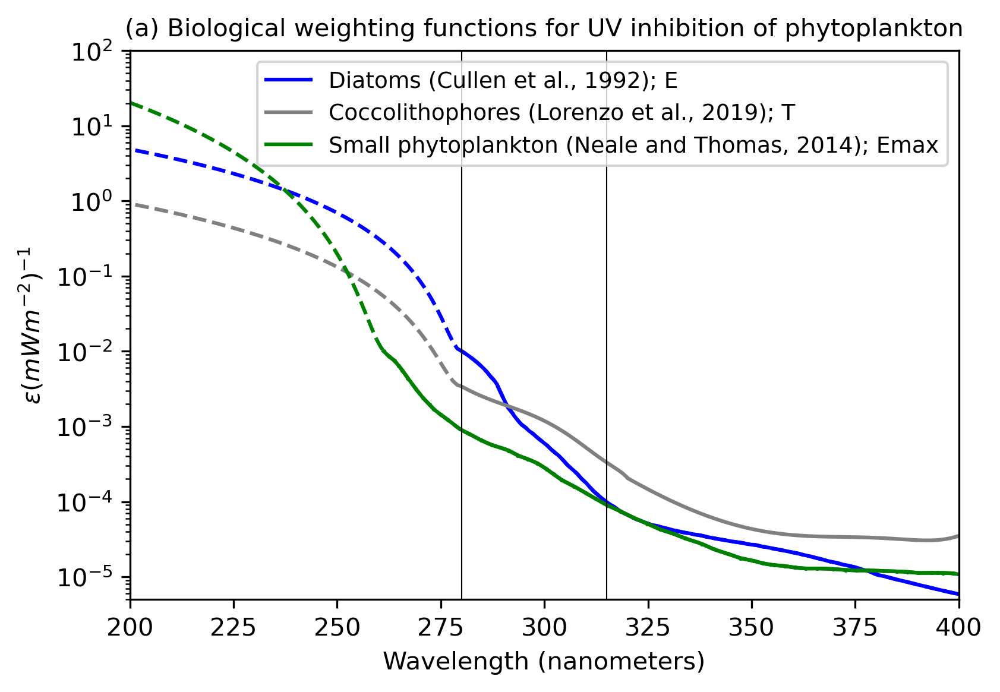

In [164]:
# Let's make some plots (Figure 1)
plt.figure(figsize=[6,4])

mpl.rcParams['figure.dpi'] = 300

if True:
    plt.plot(midpoint_band12,Einh,color='blue',label='Diatoms (Cullen et al., 1992); E')
    #plt.plot(midpoint_band12_cullen_UVC,Einh_cullen_UVC,color='blue')
    plt.plot(spline_wavelengths_cullen,spline_data_cullen,linestyle='--',color='blue')

if True:
    #plt.plot(midpoint_band12_lorenzo_UVB,Einh_lorenzo_UVB,color='green',label='Coccolithophores (Lorenzo et al., 2019)')
    #plt.plot(midpoint_band12_lorenzo_UVA,Einh_lorenzo_UVA,color='green')
    #plt.plot(midpoint_band12_lorenzo_UVC,Einh_lorenzo_UVC,color='green')
    plt.plot(spline_wavelengths_lorenzo_UVB_UVA,spline_data_lorenzo_UVB_UVA,color='grey',label='Coccolithophores (Lorenzo et al., 2019); T')
    plt.plot(spline_wavelengths_lorenzo_UVC,spline_data_lorenzo_UVC,linestyle='--',color='grey')

if False: # Neale and thomas
    #plt.plot(midpoint_band12_neale_thomas,Einh_neale_thomas,color='orange',label='Small Phytoplankton & Diazotrophs\n(Neale and Thomas, 2017)')
    #plt.plot(midpoint_band12_neale_thomas_UVC,Einh_neale_thomas_UVC,color='orange')
    plt.plot(spline_wavelengths_neale_UVC,spline_data_neale_UVC,linestyle='--',color='orange')
    plt.plot(spline_wavelengths_neale_UVB_UVA,spline_data_neale_UVB_UVA,color='orange',label='Prochlorococcus & Diazotrophs\n(Neale and Thomas, 2017); Emax')

if False: # add new cocco bwf
    plt.scatter(wavelengths_gao_cocco,Einh_gao_cocco_raw,c='k',s=2)
    #plt.plot(spline_wavelengths,spline_data,color='k') # this is all data
    plt.plot(spline_wavelengths_gao_UVB_UVA,spline_data_gao_UVB_UVA,color='k',label='Coccolithophores (Guan and Gao, 2009); E')
    plt.plot(spline_wavelengths_gao_UVC,spline_data_gao_UVC,linestyle='--',color='k')


if False:
    plt.scatter(wavelengths_xu_cocco_calc,np.array(Einh_xu_cocco_calc_raw)*1e-3,c='purple',s=2,label='Coccolithophores (Xu et al., 2011); E')
    #plt.plot(midpoint_band12_xu_cocco_calc,Einh_xu_cocco_calc,color='purple',label='Coccolithophores (Xu et al., 2011)')
    #plt.plot(midpoint_band12_xu_cocco_calc_UVC,Einh_xu_cocco_calc_UVC,color='purple')
    #plt.plot(midpoint_band12_xu_cocco_calc_uva,Einh_xu_cocco_calc_uva,color='purple')
    plt.scatter(wavelengths_xu_cocco_uncalc,np.array(Einh_xu_cocco_uncalc_raw)*1e-3,c='red',s=2,label='Coccolithophores (Uncalcified; Xu et al., 2011)')
    #plt.plot(midpoint_band12_xu_cocco_calc,Einh_xu_cocco_calc,color='red',label='Coccolithophores (Xu et al., 2011)')
    #plt.plot(midpoint_band12_xu_cocco_calc_UVC,Einh_xu_cocco_calc_UVC,color='red')
    #plt.plot(midpoint_band12_xu_cocco_calc_uva,Einh_xu_cocco_calc_uva,color='red')

if True:
    plt.scatter(wavelengths_syn,einh_syn_raw,c='green',s=0.5)
    plt.plot(wavelengths_syn,einh_syn_raw,color='green',label='Small phytoplankton (Neale and Thomas, 2014); Emax')
    #plt.plot(spline_wavelengths_syn,spline_data_syn,color='yellow')
    plt.plot(spline_wavelengths_syn_UVB_UVA,spline_data_syn_UVB_UVA,color='green')
    plt.plot(spline_wavelengths_syn_UVC,spline_data_syn_UVC,linestyle='--',color='green')


#plt.plot(midpoint_band12_lorenzo,Einh_lorenzo,color='red',label='Coccolithophores (Lorenzo et al. (2019))')
#plt.title('BWFs updated with linear extrapolation for UV-C (120 to 280 nm)')
plt.title('(a) Biological weighting functions for UV inhibition of phytoplankton',fontsize=10)
plt.yscale("log")
plt.xlim([200,400])
plt.ylim([5e-6,1e2])
plt.xlabel('Wavelength (nanometers)')
plt.ylabel('$\epsilon (mW m^{-2})^{-1}$')#E*_{inh}$')
plt.axvline(x = 315, linewidth = 0.5, color = 'k')
plt.axvline(x = 280, linewidth = 0.5, color = 'k')
#plt.title('Biological Weighting Functions for Phytoplankton in CESM2-MARBL')
plt.legend(loc='upper right', fontsize="9");
plt.savefig('GMD24_figs/Figure1.eps')
plt.savefig('GMD24_figs/Figure1.png')
plt.show()

In [208]:

# STEP 1: GET GLOBAL AVERAGE ATM_EPHYTO1, ATM_EPHYTO5, AND ATM_EPHYTO7

REV_EINHPI_DATM_CNL04_PICPOC02_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPI'
REV_EINHPULSEv01_DATM_CNL04_PICPOC02_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01'
OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/'

files_h0={}
REV_CASES=[REV_EINHPI_DATM_CNL04_PICPOC02_4P2Z,REV_EINHPULSEv01_DATM_CNL04_PICPOC02_4P2Z]
for case in REV_CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]
    

files_h0
CASES=REV_CASES 
print(CASES)


#var='photoC_TOT' # z_t_150m
#vars=['ATM_EPHYTO1UVA_NET','ATM_EPHYTO1UVB_NET','ATM_EPHYTO1UVC_NET','ATM_EPHYTO5UVA_NET','ATM_EPHYTO5UVA_NET','ATM_EPHYTO5UVB_NET','ATM_EPHYTO5UVC_NET','ATM_EPHYTO7UVA_NET','ATM_EPHYTO7UVB_NET','ATM_EPHYTO7UVC_NET']

extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
TAREA = extract.variables['TAREA'][:]*(100**-2)
z_t_150m = extract.variables['z_t_150m'][:]*(0.01)

data={}
for case in CASES:
  data[case]={}
  for ephyto_key in ['EPHYTO1','EPHYTO5','EPHYTO7']:
      data[case][ephyto_key]=[]
  for fi in files_h0[case][-12:]:
    extract = nc4.Dataset(fi,'r')
    #tempdata = extract.variables[var][0]
    #ephyto_key='EPHYTO1'
    for ephyto_key in ['EPHYTO1','EPHYTO5','EPHYTO7']:
        uva=extract.variables['ATM_'+ephyto_key+'UVA_NET'][0]
        uvb=extract.variables['ATM_'+ephyto_key+'UVB_NET'][0]
        uvc=extract.variables['ATM_'+ephyto_key+'UVC_NET'][0]
        einh_total = uva+uvb+uvc
        data[case][ephyto_key].append(np.average(einh_total,weights=TAREA))


case=REV_EINHPI_DATM_CNL04_PICPOC02_4P2Z

einh_cocco=data[case]['EPHYTO5'] 

einh_sp=data[case]['EPHYTO7']

einh_diat=data[case]['EPHYTO1']

einh_diat

['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPI', 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01']


[0.3683183915932814,
 0.3615685293750073,
 0.33988671920048913,
 0.3102750687618457,
 0.2855883707010535,
 0.2759070711584576,
 0.2816988302886136,
 0.29905157619891914,
 0.3194425889617466,
 0.3379323763719245,
 0.3519840337513991,
 0.36119539376619647]

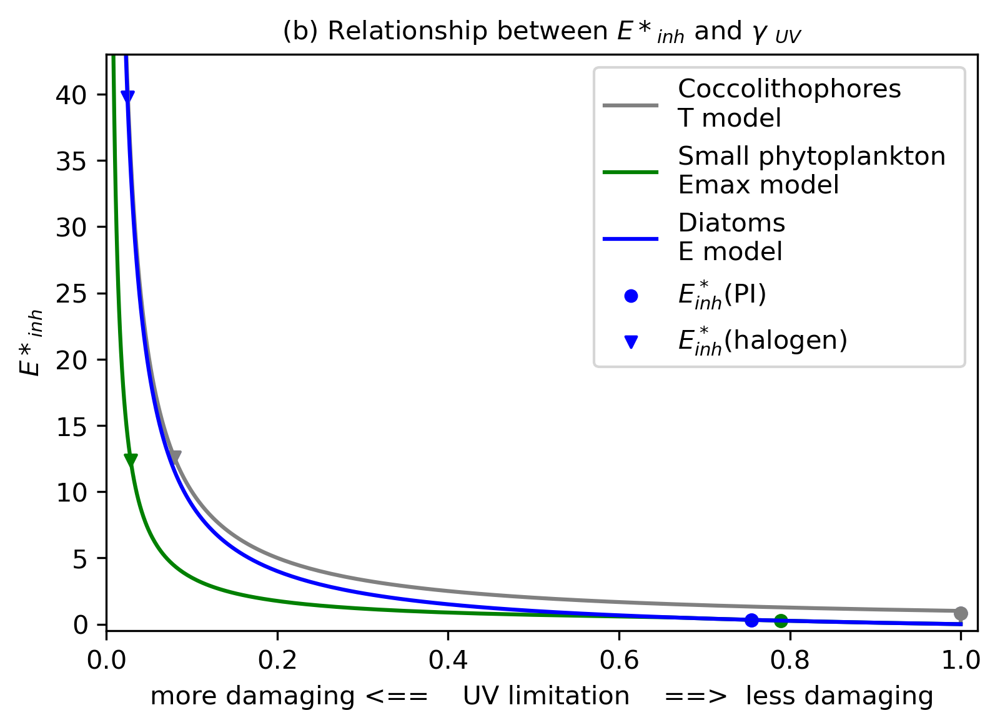

In [165]:
# create plot of varying models
def tmodel_lorenzo_gamma(einh):
    if einh<=1:
        return 1.0
    else:
        return 1.0/einh

def emax_nt2014_gamma(einh):
    emax=0.54
    c=(1+emax)/emax
    if einh<=emax:
        return 1/(1+einh)
    else:
        return 1.0/(c*einh) 

def emodel_cullen_gamma(einh):
    return 1.0/(1+einh)


einh_list = np.linspace(0,50,500)
gamma_lorenzo=[]
gamma_nt2014=[]
gamma_cullen=[]
for t in range(len(einh_list)):
    gamma_lorenzo.append(tmodel_lorenzo_gamma(einh_list[t]))
    gamma_nt2014.append( emax_nt2014_gamma(einh_list[t]))
    gamma_cullen.append(emodel_cullen_gamma(einh_list[t]))

plt.figure(figsize=[6,4])

plt.plot(gamma_lorenzo,einh_list,label='Coccolithophores \nT model',c='grey')
plt.plot(gamma_nt2014,einh_list,label='Small phytoplankton \nEmax model',c='green')
plt.plot(gamma_cullen,einh_list,label='Diatoms \nE model',c='blue')

case=REV_EINHPI_DATM_CNL04_PICPOC02_4P2Z
#einh_cocco=1.2
einh_cocco=np.nanmean(data[case]['EPHYTO5'] )
plt.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],color='blue',s=18,label='$E^*_{inh}$(PI)') 
plt.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],color='grey',s=20)#,label='Ambient UV') # Coccolithophores
#einh_sp=0.5
einh_sp=np.nanmean(data[case]['EPHYTO7'])
plt.scatter(emax_nt2014_gamma(einh_sp),[einh_sp],color='green',s=20) # Small phytoplankton
#einh_diat=0.4
einh_diat=np.nanmean(data[case]['EPHYTO1'])
plt.scatter(emodel_cullen_gamma(einh_diat),[einh_diat],color='blue',s=20) # Diatoms


case=REV_EINHPULSEv01_DATM_CNL04_PICPOC02_4P2Z
einh_cocco=np.nanmean(data[case]['EPHYTO5'] )
plt.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],marker="v",color='blue',s=18,label='$E^*_{inh}$(halogen)') 
plt.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],marker="v",color='grey',s=20)#,label='UV Pulse') # Coccolithophores
einh_sp=np.nanmean(data[case]['EPHYTO7'])
plt.scatter(emax_nt2014_gamma(einh_sp),[einh_sp],color='green',marker="v",s=20) # Small phytoplankton
einh_diat=np.nanmean(data[case]['EPHYTO1'])
plt.scatter(emodel_cullen_gamma(einh_diat),[einh_diat],color='blue',marker="v",s=20) # Diatoms



plt.title('(b) Relationship between $E*_{inh}$ and $\gamma$ $_{UV}$',fontsize=10)

plt.xlabel('more damaging <==    UV limitation    ==>  less damaging')
plt.ylabel('$E*_{inh}$')
plt.xlim([0,1.02])
plt.ylim([-0.5,43])
#plt.ylim([0,2])
plt.legend(loc='best')
plt.show()
        

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


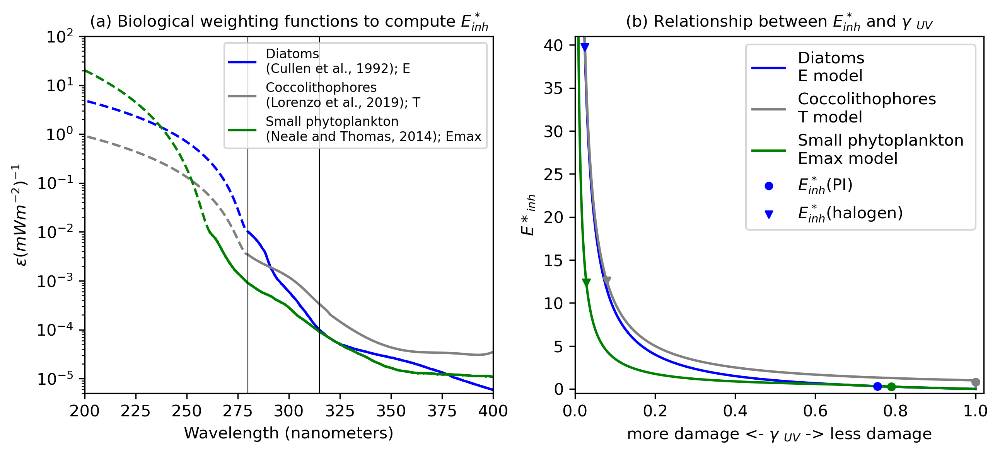

In [210]:
# combine the two

# Let's make some plots (Figure 1)
#plt.figure(figsize=[10,4])
#fig,(ax1,ax2)= plt.subplots(2,1,figsize =(10,4),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
fig = plt.figure(figsize=(10,4),facecolor='white')
gs = fig.add_gridspec(1,2)
mpl.rcParams['figure.dpi'] = 300

ax1=fig.add_subplot(gs[0,0])

if True:
    ax1.plot(midpoint_band12,Einh,color='blue',label='Diatoms \n(Cullen et al., 1992); E')
    #plt.plot(midpoint_band12_cullen_UVC,Einh_cullen_UVC,color='blue')
    ax1.plot(spline_wavelengths_cullen,spline_data_cullen,linestyle='--',color='blue')

if True:
    #plt.plot(midpoint_band12_lorenzo_UVB,Einh_lorenzo_UVB,color='green',label='Coccolithophores (Lorenzo et al., 2019)')
    #plt.plot(midpoint_band12_lorenzo_UVA,Einh_lorenzo_UVA,color='green')
    #plt.plot(midpoint_band12_lorenzo_UVC,Einh_lorenzo_UVC,color='green')
    ax1.plot(spline_wavelengths_lorenzo_UVB_UVA,spline_data_lorenzo_UVB_UVA,color='grey',label='Coccolithophores \n(Lorenzo et al., 2019); T')
    ax1.plot(spline_wavelengths_lorenzo_UVC,spline_data_lorenzo_UVC,linestyle='--',color='grey')

if False: # Neale and thomas
    #plt.plot(midpoint_band12_neale_thomas,Einh_neale_thomas,color='orange',label='Small Phytoplankton & Diazotrophs\n(Neale and Thomas, 2017)')
    #plt.plot(midpoint_band12_neale_thomas_UVC,Einh_neale_thomas_UVC,color='orange')
    ax1.plot(spline_wavelengths_neale_UVC,spline_data_neale_UVC,linestyle='--',color='orange')
    ax1.plot(spline_wavelengths_neale_UVB_UVA,spline_data_neale_UVB_UVA,color='orange',label='Prochlorococcus & Diazotrophs\n(Neale and Thomas, 2017); Emax')

if False: # add new cocco bwf
    ax1.scatter(wavelengths_gao_cocco,Einh_gao_cocco_raw,c='k',s=2)
    #plt.plot(spline_wavelengths,spline_data,color='k') # this is all data
    ax1.plot(spline_wavelengths_gao_UVB_UVA,spline_data_gao_UVB_UVA,color='k',label='Coccolithophores (Guan and Gao, 2009); E')
    ax1.plot(spline_wavelengths_gao_UVC,spline_data_gao_UVC,linestyle='--',color='k')


if False:
    ax1.scatter(wavelengths_xu_cocco_calc,np.array(Einh_xu_cocco_calc_raw)*1e-3,c='purple',s=2,label='Coccolithophores (Xu et al., 2011); E')
    #plt.plot(midpoint_band12_xu_cocco_calc,Einh_xu_cocco_calc,color='purple',label='Coccolithophores (Xu et al., 2011)')
    #plt.plot(midpoint_band12_xu_cocco_calc_UVC,Einh_xu_cocco_calc_UVC,color='purple')
    #plt.plot(midpoint_band12_xu_cocco_calc_uva,Einh_xu_cocco_calc_uva,color='purple')
    ax1.scatter(wavelengths_xu_cocco_uncalc,np.array(Einh_xu_cocco_uncalc_raw)*1e-3,c='red',s=2,label='Coccolithophores (Uncalcified; Xu et al., 2011)')
    #plt.plot(midpoint_band12_xu_cocco_calc,Einh_xu_cocco_calc,color='red',label='Coccolithophores (Xu et al., 2011)')
    #plt.plot(midpoint_band12_xu_cocco_calc_UVC,Einh_xu_cocco_calc_UVC,color='red')
    #plt.plot(midpoint_band12_xu_cocco_calc_uva,Einh_xu_cocco_calc_uva,color='red')

if True:
    ax1.scatter(wavelengths_syn,einh_syn_raw,c='green',s=0.5)
    ax1.plot(wavelengths_syn,einh_syn_raw,color='green',label='Small phytoplankton \n(Neale and Thomas, 2014); Emax')
    #plt.plot(spline_wavelengths_syn,spline_data_syn,color='yellow')
    ax1.plot(spline_wavelengths_syn_UVB_UVA,spline_data_syn_UVB_UVA,color='green')
    ax1.plot(spline_wavelengths_syn_UVC,spline_data_syn_UVC,linestyle='--',color='green')


#plt.plot(midpoint_band12_lorenzo,Einh_lorenzo,color='red',label='Coccolithophores (Lorenzo et al. (2019))')
#plt.title('BWFs updated with linear extrapolation for UV-C (120 to 280 nm)')
ax1.set_title('(a) Biological weighting functions to compute $E^*_{inh}$',fontsize=10)
ax1.set_yscale("log")
ax1.set_xlim([200,400])
ax1.set_ylim([5e-6,1e2])
ax1.set_xlabel('Wavelength (nanometers)')
ax1.set_ylabel('$\epsilon (mW m^{-2})^{-1}$')#E*_{inh}$')
ax1.axvline(x = 315, linewidth = 0.5, color = 'k')
ax1.axvline(x = 280, linewidth = 0.5, color = 'k')
#plt.title('Biological Weighting Functions for Phytoplankton in CESM2-MARBL')
ax1.legend(loc='upper right', fontsize="8");
#plt.savefig('GMD24_figs/Figure1.eps')
#plt.savefig('GMD24_figs/Figure1.png')
#plt.show()


# create plot of varying models
def tmodel_lorenzo_gamma(einh):
    if einh<=1:
        return 1.0
    else:
        return 1.0/einh

def emax_nt2014_gamma(einh):
    emax=0.54
    c=(1+emax)/emax
    if einh<=emax:
        return 1/(1+einh)
    else:
        return 1.0/(c*einh) 

def emodel_cullen_gamma(einh):
    return 1.0/(1+einh)


einh_list = np.linspace(0,50,500)
gamma_lorenzo=[]
gamma_nt2014=[]
gamma_cullen=[]
for t in range(len(einh_list)):
    gamma_lorenzo.append(tmodel_lorenzo_gamma(einh_list[t]))
    gamma_nt2014.append( emax_nt2014_gamma(einh_list[t]))
    gamma_cullen.append(emodel_cullen_gamma(einh_list[t]))

#plt.figure(figsize=[6,4])

ax2=fig.add_subplot(gs[0,1])
ax2.plot(gamma_cullen,einh_list,label='Diatoms \nE model',c='blue',zorder=0)
ax2.plot(gamma_lorenzo,einh_list,label='Coccolithophores \nT model',c='grey',zorder=0)
ax2.plot(gamma_nt2014,einh_list,label='Small phytoplankton \nEmax model',c='green',zorder=0)

case=REV_EINHPI_DATM_CNL04_PICPOC02_4P2Z
#einh_cocco=1.2
einh_cocco=np.nanmean(data[case]['EPHYTO5'] )
ax2.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],color='blue',s=18,label='$E^*_{inh}$(PI)') 
ax2.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],color='grey',s=20)#,label='Ambient UV') # Coccolithophores
#einh_sp=0.5
einh_sp=np.nanmean(data[case]['EPHYTO7'])
ax2.scatter(emax_nt2014_gamma(einh_sp),[einh_sp],color='green',s=20) # Small phytoplankton
#einh_diat=0.4
einh_diat=np.nanmean(data[case]['EPHYTO1'])
ax2.scatter(emodel_cullen_gamma(einh_diat),[einh_diat],color='blue',s=20) # Diatoms


case=REV_EINHPULSEv01_DATM_CNL04_PICPOC02_4P2Z
einh_cocco=np.nanmean(data[case]['EPHYTO5'] )
ax2.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],marker="v",color='blue',s=18,label='$E^*_{inh}$(halogen)') 
ax2.scatter(tmodel_lorenzo_gamma(einh_cocco),[einh_cocco],marker="v",color='grey',s=20,zorder=3)#,label='UV Pulse') # Coccolithophores
einh_sp=np.nanmean(data[case]['EPHYTO7'])
ax2.scatter(emax_nt2014_gamma(einh_sp),[einh_sp],color='green',marker="v",s=20) # Small phytoplankton
einh_diat=np.nanmean(data[case]['EPHYTO1'])
ax2.scatter(emodel_cullen_gamma(einh_diat),[einh_diat],color='blue',marker="v",s=20) # Diatoms



ax2.set_title('(b) Relationship between $E^*_{inh}$ and $\gamma$ $_{UV}$',fontsize=10)

ax2.set_xlabel('more damage <- $\gamma$ $_{UV}$ -> less damage')
ax2.set_ylabel('$E*_{inh}$')
ax2.set_xlim([0,1.02])
ax2.set_ylim([-0.5,41])
#plt.ylim([0,2])
ax2.legend(loc='best')

plt.savefig('GMD24_figs/Figure1.eps')
plt.savefig('GMD24_figs/Figure1.png')
plt.show()
plt.show()
        



In [15]:
# new Figure 2



import glob as glob
import os
from collections import OrderedDict
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc4
import matplotlib.pyplot as plt
import matplotlib as mpl
from pylab import *; 
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300



OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 
files_h0={}

REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI'
REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'


REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI'
REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPI'
REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'

REV_EINHPULSE_DATM_CNL03_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL03_PICPOC_EinhPULSE'
REV_EINHPULSEv01_DATM_CNL03_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL03_PICPOC_EinhPULSEv01'
REV_EINHPULSEv01_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_EinhPULSEv01' # this replaces guan and gao (2009) with lorenzo 

REV_EINHPULSEv01_DATM_CNL04_PICPOC01_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC01_EinhPULSEv01'
REV_EINHPULSEv01_DATM_CNL04_PICPOC02_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC02_EinhPULSEv01'
REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01'

REV_EINHPULSEv01YR2_DATM_CNL04_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01YR2'
REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2'
REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

REV_EINH20XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_EinhPIx20'

# 900 ppm cases
REV_EINH0XPI_DATM_CNL04_4P2Z_900PPM = 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_Einh0xPI_900ppm'
REV_EINHPI_DATM_CNL04_4P2Z_900PPM = 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_EinhPI_900ppm'


CASES=[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z,REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z,REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z,REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]
for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]


#case='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
#files_h0[case]=sorted(glob.glob('/glade/derecho/scratch/jcoupe/archive/graveyard/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv/ocn/hist/'+case+'.pop.h.0*.nc'))[:]

                     
# these are really the only three cases that I care about - only look at the first two years here 
files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z] = files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][-60:]
files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]
files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]

CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]

In [3]:
case=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV
files_h0[case]

['/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv.pop.h.0010-01.nc',
 '/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv.pop.h.0010-02.nc',
 '/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv.pop.h.0010-03.nc',
 '/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv.pop.h.0010-04.nc',
 '/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv/ocn/hist/CESM214_tuvcp

In [385]:
print(' PI case:')
print(files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z][0])
print(files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z][-1])
print(' ')
print('E*inh(halogen)')
print(files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z][0])
print(files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z][-1])
print(' ')
print('E*inh(0)')
print(files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][0])
print(files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][-1])

 PI case:
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI.pop.h.0005-01.nc
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI.pop.h.0009-12.nc
 
E*inh(halogen)
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2.pop.h.0008-01.nc
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2.pop.h.0009-12.nc
 
E*inh(0)
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI.pop.h.0013-01.nc
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CN

In [16]:
# calculate NPP
extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
TAREA = extract.variables['TAREA'][:]*(100**-2)

#scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365
scale_factor=1e-3*12*1e-15*86400*365*1e-2
data={}
#CASES=[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z]
for case in CASES:
    var='photoC_TOT_zint'
    data[case]={}
    print(case)
    for var in ['photoC_TOT_zint','photoC_diat_zint','photoC_sp_zint','photoC_diaz_zint','photoC_cocco_zint']:
        data[case][var]=[]
        for fi in files_h0[case]:
            extract = nc4.Dataset(fi,'r')
            tempdata=np.nansum(np.nansum(extract.variables[var][:]*TAREA,axis=2),axis=1)*scale_factor
            for t in range(len(tempdata)):
                data[case][var].append(tempdata[t])

CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv


In [5]:

def percent_anomaly(data,control):
   control_climo = np.nanmean(separate_by_month_arrays(control),axis=1)
   monthly_data = separate_by_month_arrays(data)
   percent_anom = []
   for yr in range(np.shape(monthly_data)[1]):
        for mo in range(np.shape(monthly_data)[0]):
          percent_anom.append( 100*(monthly_data[mo][yr] - control_climo[mo]) * (control_climo[mo]**-1))
   return percent_anom
    
def separate_by_month_arrays(dataset):
	k=0
	jan=[];feb=[];march=[];apr=[];may=[];jun=[];july=[];aug=[];sep=[];oc=[];nov=[];dec=[];
	while k <= (len(dataset)-12):
		jan.append((dataset[k]))
		feb.append((dataset[k+1]))
		march.append((dataset[k+2]))
		apr.append((dataset[k+3]))
		may.append((dataset[k+4]))
		jun.append((dataset[k+5]))
		july.append((dataset[k+6]))
		aug.append((dataset[k+7]))
		sep.append((dataset[k+8]))
		oc.append((dataset[k+9]))
		nov.append((dataset[k+10]))
		dec.append((dataset[k+11]))
		k = k+12;
	return [jan,feb,march,apr,may,jun,july,aug,sep,oc,nov,dec]

def monthly_anomaly(data,data_control,type='standard',NANDATA = False):
    monthly_data = separate_by_month_arrays(data)
    monthly_data_control = np.nanmean(separate_by_month_arrays(data_control),axis=1)
    new_data=[]
    if type == 'percent':
        return percent_anomaly(data,data_control)
    if type == 'standard':
        for yr in range(int(len(data)/12.0)):
            for mo in range(12):
                new_data.append(monthly_data[mo][yr] - monthly_data_control[mo])
        return new_data
    if type == 'sd':
        mdc_std = np.nanstd(separate_by_month_arrays(data_control),axis=1)
        for yr in range(int(len(data)/12.0)):
    	    for mo in range(12):
	          new_data.append( (monthly_data[mo][yr] - monthly_data_control[mo]) *(mdc_std[mo]**-1))
        return new_data



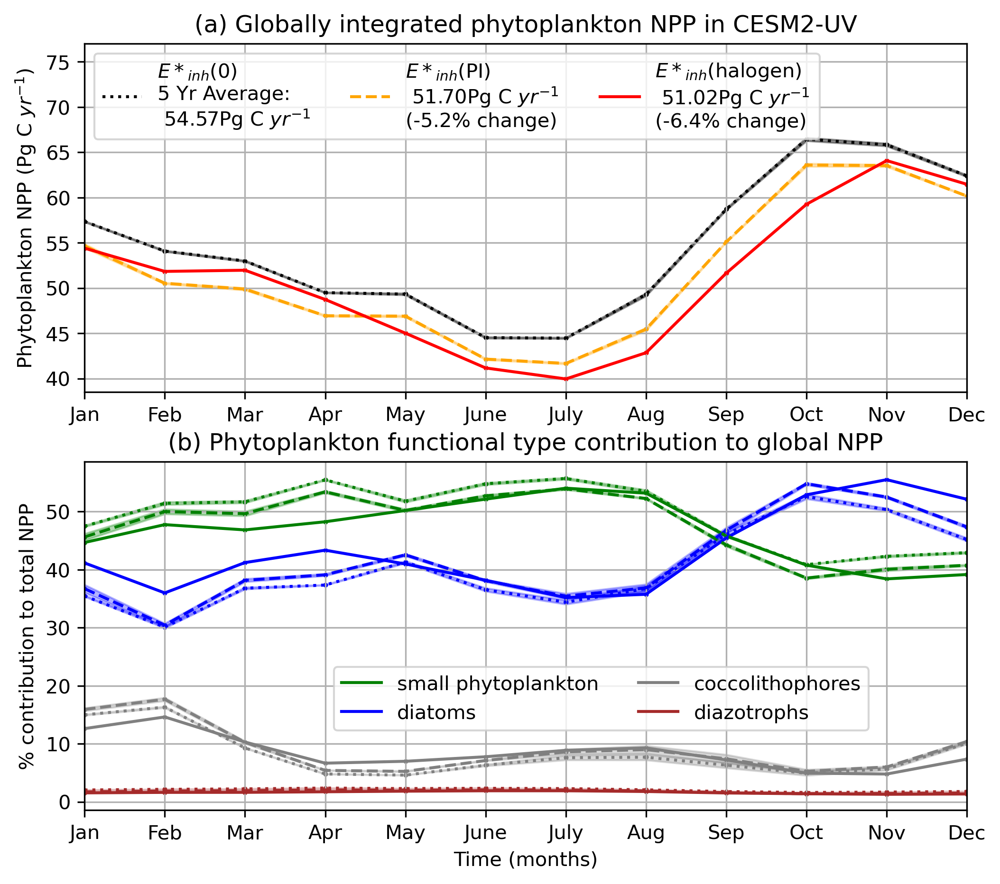

In [7]:
time_factor = 1

#CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]


if True:
    plt.figure(figsize=[8,7])
    plt.subplot(2,1,1)
    case=REV_EINH0XPI_DATM_CNL04_4P2Z; case_label='$E*_{inh}$(0)'; case_color='k'
    plot_data=data[case]['photoC_TOT_zint']
    
    CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
    CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
    CLIMO_MEAN = np.nanmean(CLIMO_MEAN,axis=1) 
    plot_data = CLIMO_MEAN
    
    ts=np.linspace(1,len(plot_data),len(plot_data))*time_factor; 
    plt.scatter(ts,plot_data,color=case_color,s=2)
    ann_mean=np.nanmean(plot_data[:])
    BASELINE = ann_mean # 5 year mean 

    plt.plot(ts,plot_data,case_color,linestyle='dotted',label=case_label+'\n5 Yr Average: \n '+str(BASELINE)[0:5]+'Pg C $yr^{-1}$') 
    TOP = CLIMO_MEAN + CLIMO_STD
    BOTTOM = CLIMO_MEAN - CLIMO_STD
    plt.fill_between(ts,TOP,BOTTOM,alpha=0.4, color='k')#,label='+/- 1 standard deviation')
    
    case=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV; case_label='$E*_{inh}$(PI)'; case_color='orange'
    plot_data=data[case]['photoC_TOT_zint']
    
    CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
    CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
    CLIMO_MEAN = np.nanmean(CLIMO_MEAN,axis=1) # annual mean 
    plot_data = CLIMO_MEAN
    
    ts=np.linspace(1,len(plot_data),len(plot_data))*time_factor; 
    plt.scatter(ts,plot_data,color=case_color,s=2)
    ann_mean=np.nanmean(plot_data[:])
    
    pct_change = ann_mean - BASELINE
    pct_change = str(pct_change * (BASELINE**-1)*100)[0:4]
   
    plt.plot(ts,plot_data,case_color,linestyle='--',label=case_label+'\n '+str(ann_mean)[0:5]+'Pg C $yr^{-1}$ \n('+pct_change+'% change)')# \n Yr2 '+str(ann_mean_yr2)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr2+'%)'+'\n Yr3 '+str(ann_mean_yr3)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr3+'%) \n Yr4 '+str(ann_mean_yr4)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr4+'%) \n Yr5 '+str(ann_mean_yr5)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr5+'%)' )
    TOP = CLIMO_MEAN + CLIMO_STD
    BOTTOM = CLIMO_MEAN - CLIMO_STD
    plt.fill_between(ts,TOP,BOTTOM,alpha=0.3, color='orange')
    
    case=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV; 
    #case=REV_EINHPULSEv01YR2_DATM_CNL04_PICPOC06_4P2Z # replace with 2nd year forcing 
    case_label='$E*_{inh}$(halogen)'; case_color='red'
    plot_data=data[case]['photoC_TOT_zint'][:]
    
    CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
    CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
    CLIMO_MEAN = np.nanmean(CLIMO_MEAN,axis=1) # annual mean 
    plot_data = CLIMO_MEAN
    
    ts=np.linspace(1,len(plot_data),len(plot_data))*time_factor; 
    plt.scatter(ts,plot_data,color=case_color,s=2)
    ann_mean=np.nanmean(plot_data[:])
    pct_change = ann_mean - BASELINE
    pct_change = str(pct_change * (BASELINE**-1)*100)[0:4]
    
    plt.scatter(ts,plot_data,color=case_color,s=2)
    plt.plot(ts,plot_data,case_color,linestyle='-',label=case_label+'\n '+str(ann_mean)[0:5]+'Pg C $yr^{-1}$ \n('+pct_change+'% change)')# \n Yr2 '+str(ann_mean_yr2)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr2+'%) \n Yr3 '+str(ann_mean_yr3)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr3+'%) \n Yr4 '+str(ann_mean_yr4)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr4+'%)\n Yr5 '+str(ann_mean_yr5)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr5+'%)' )
    TOP = CLIMO_MEAN + CLIMO_STD
    BOTTOM = CLIMO_MEAN - CLIMO_STD
    plt.fill_between(ts,TOP*0,BOTTOM*0,alpha=0.4, color='red')
    if True:
        plt.title('(a) Globally integrated phytoplankton NPP in CESM2-UV'); 
    plt.ylabel('Phytoplankton NPP (Pg C $yr^{-1}$)')
    props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
    #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
    plt.grid(); plt.ylim([38.5,77]); plt.xlim([1,12])
    #plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
    plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec'))
    plt.legend(loc='upper left',ncol=3,fontsize=10); 
    #plt.xlabel('Time (months)')


    
    plt.subplot(2,1,2)
    plt.grid()
    plot_data={} 
    CLIMO_STD={}
    case_labels={}; case_colors={}
    case_labels['photoC_sp_zint']='small phytoplankton'; case_colors['photoC_sp_zint']='g'
    case_labels['photoC_diat_zint']='diatoms'; case_colors['photoC_diat_zint']='b'
    case_labels['photoC_cocco_zint']='coccolithophores'; case_colors['photoC_cocco_zint']='grey'
    case_labels['photoC_diaz_zint']='diazotrophs'; case_colors['photoC_diaz_zint']='brown'
    for case in CASES: # make sure CASES only has three cases 
        plot_data[case]={}
        CLIMO_STD[case]={}
        #CLIMO_MEAN_NPP = separate_by_month_arrays(data[case]['photoC_TOT_zint'])
        #CLIMO_MEAN_NPP = np.nanmean(CLIMO_MEAN_NPP,axis=1) # take annual average
        for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
            plot_data[case][var] = data[case][var] * np.array(data[case]['photoC_TOT_zint'])**-1 * 100
            CLIMO_MEAN_VAR = separate_by_month_arrays(plot_data[case][var])
            CLIMO_STD[case][var] = np.nanstd(CLIMO_MEAN_VAR,axis=1) # annual standard deviation
            CLIMO_MEAN_VAR = np.nanmean(CLIMO_MEAN_VAR,axis=1)
            plot_data[case][var] = CLIMO_MEAN_VAR
            #plot_data[case][var] = data[case][var] * np.array(data[case]['photoC_TOT_zint'])**-1 * 100
            #plot_data[case][var] = CLIMO_MEAN_VAR * np.array(CLIMO_MEAN_NPP)**-1 * 100
        CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]


    case = REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV; 
    #case=REV_EINHPULSEv01YR2_DATM_CNL04_PICPOC06_4P2Z # replace uv pulse with 2nd year forcing
    case_label='$E*_{inh}$(halogen)'; linestyle='-'
    for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
        plot_data2 = plot_data[case][var]
        ts=np.linspace(1,len(plot_data2),len(plot_data2)); 
        plt.scatter(ts,plot_data2,color=case_colors[var],s=2)
        plt.plot(ts,plot_data2,case_colors[var],linestyle=linestyle,label=case_labels[var])
    case = REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV; case_label='$E*_{inh}$(PI)'; linestyle='--'
    for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
        plot_data2 = plot_data[case][var]
        ts=np.linspace(1,len(plot_data2),len(plot_data2)); 
        plt.scatter(ts,plot_data2,color=case_colors[var],s=2)
        plt.plot(ts,plot_data2,case_colors[var],linestyle=linestyle)#,label=case_labels[var])
        TOP = plot_data2 + CLIMO_STD[case][var]
        BOTTOM = plot_data2 - CLIMO_STD[case][var]
        plt.fill_between(ts,TOP,BOTTOM,alpha=0.3,color=case_colors[var])
    case = REV_EINH0XPI_DATM_CNL04_4P2Z; case_label='$E*_{inh}$(0)'; linestyle='dotted'
    for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
        plot_data2 = plot_data[case][var]
        ts=np.linspace(1,len(plot_data2),len(plot_data2)); 
        plt.scatter(ts,plot_data2,color=case_colors[var],s=2)
        plt.plot(ts,plot_data2,case_colors[var],linestyle=linestyle)#,label=case_labels[var])
        TOP = plot_data2 + CLIMO_STD[case][var]
        BOTTOM = plot_data2 - CLIMO_STD[case][var]
        plt.fill_between(ts,TOP,BOTTOM,alpha=0.3,color=case_colors[var])
    plt.title('(b) Phytoplankton functional type contribution to global NPP'); 
    plt.ylabel('% contribution to total NPP')
    #plt.text(3,8.5,'Solid = $E*_{inh}$(20x PI); Dashed = $E*_{inh}$(PI) = ; Dotted = $E*_{inh}$(0)')
    #plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12')); 
    plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec'))
    plt.xlim([1,12])
    plt.xlabel('Time (months)'); 
    plt.legend(loc='lower right',ncol=2,bbox_to_anchor=(0.9,0.2))
    #plt.savefig('GMD24_figs/Figure2.eps')
    #plt.savefig('GMD24_figs/Figure2.png')
    plt.show()

In [14]:

REV_EINH0XPI_DATM_CNL04_4P2Z

'CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'

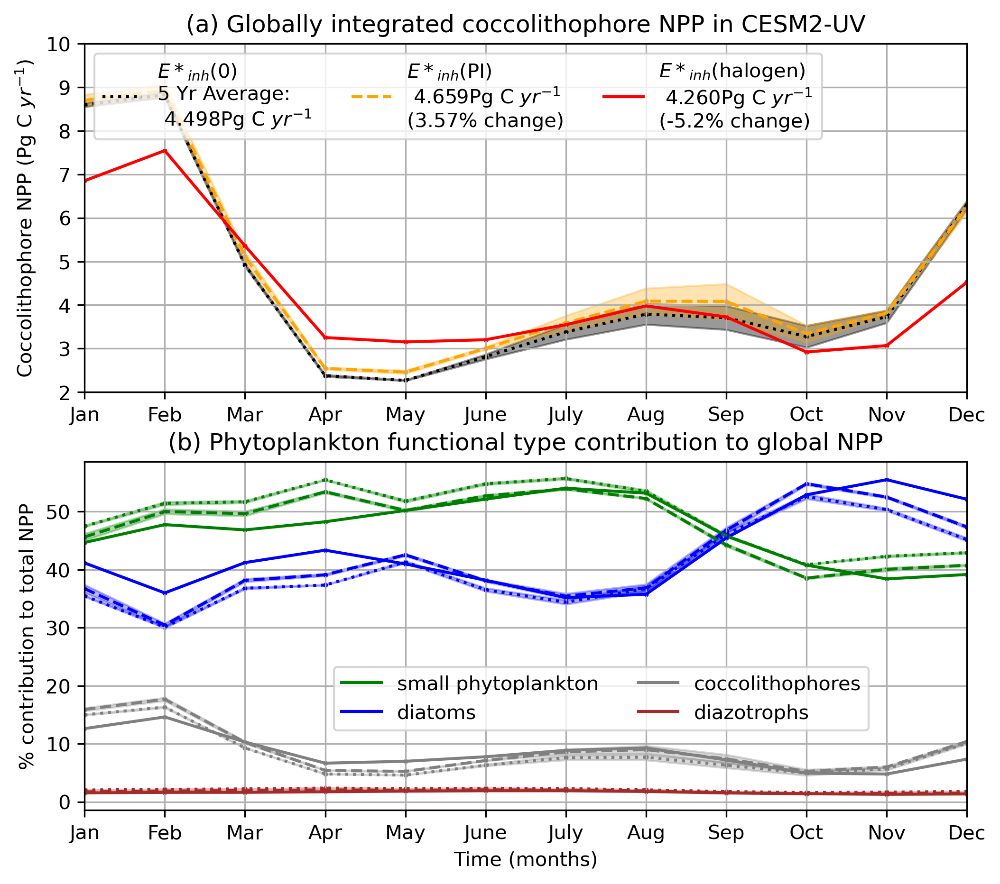

In [17]:
time_factor = 1

#CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]


if True:
    plt.figure(figsize=[8,7])
    plt.subplot(2,1,1)
    case=REV_EINH0XPI_DATM_CNL04_4P2Z; case_label='$E*_{inh}$(0)'; case_color='k'
    plot_data=data[case]['photoC_cocco_zint']
    
    CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
    CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
    CLIMO_MEAN = np.nanmean(CLIMO_MEAN,axis=1) 
    plot_data = CLIMO_MEAN
    
    ts=np.linspace(1,len(plot_data),len(plot_data))*time_factor; 
    plt.scatter(ts,plot_data,color=case_color,s=2)
    ann_mean=np.nanmean(plot_data[:])
    BASELINE = ann_mean # 5 year mean 

    plt.plot(ts,plot_data,case_color,linestyle='dotted',label=case_label+'\n5 Yr Average: \n '+str(BASELINE)[0:5]+'Pg C $yr^{-1}$') 
    TOP = CLIMO_MEAN + CLIMO_STD
    BOTTOM = CLIMO_MEAN - CLIMO_STD
    plt.fill_between(ts,TOP,BOTTOM,alpha=0.4, color='k')#,label='+/- 1 standard deviation')
    
    case=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV; case_label='$E*_{inh}$(PI)'; case_color='orange'
    plot_data=data[case]['photoC_cocco_zint']
    
    CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
    CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
    CLIMO_MEAN = np.nanmean(CLIMO_MEAN,axis=1) # annual mean 
    plot_data = CLIMO_MEAN
    
    ts=np.linspace(1,len(plot_data),len(plot_data))*time_factor; 
    plt.scatter(ts,plot_data,color=case_color,s=2)
    ann_mean=np.nanmean(plot_data[:])
    
    pct_change = ann_mean - BASELINE
    pct_change = str(pct_change * (BASELINE**-1)*100)[0:4]
   
    plt.plot(ts,plot_data,case_color,linestyle='--',label=case_label+'\n '+str(ann_mean)[0:5]+'Pg C $yr^{-1}$ \n('+pct_change+'% change)')# \n Yr2 '+str(ann_mean_yr2)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr2+'%)'+'\n Yr3 '+str(ann_mean_yr3)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr3+'%) \n Yr4 '+str(ann_mean_yr4)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr4+'%) \n Yr5 '+str(ann_mean_yr5)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr5+'%)' )
    TOP = CLIMO_MEAN + CLIMO_STD
    BOTTOM = CLIMO_MEAN - CLIMO_STD
    plt.fill_between(ts,TOP,BOTTOM,alpha=0.3, color='orange')
    
    case=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV; 
    #case=REV_EINHPULSEv01YR2_DATM_CNL04_PICPOC06_4P2Z # replace with 2nd year forcing 
    case_label='$E*_{inh}$(halogen)'; case_color='red'
    plot_data=data[case]['photoC_cocco_zint'][:]
    
    CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
    CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
    CLIMO_MEAN = np.nanmean(CLIMO_MEAN,axis=1) # annual mean 
    plot_data = CLIMO_MEAN
    
    ts=np.linspace(1,len(plot_data),len(plot_data))*time_factor; 
    plt.scatter(ts,plot_data,color=case_color,s=2)
    ann_mean=np.nanmean(plot_data[:])
    pct_change = ann_mean - BASELINE
    pct_change = str(pct_change * (BASELINE**-1)*100)[0:4]
    
    plt.scatter(ts,plot_data,color=case_color,s=2)
    plt.plot(ts,plot_data,case_color,linestyle='-',label=case_label+'\n '+str(ann_mean)[0:5]+'Pg C $yr^{-1}$ \n('+pct_change+'% change)')# \n Yr2 '+str(ann_mean_yr2)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr2+'%) \n Yr3 '+str(ann_mean_yr3)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr3+'%) \n Yr4 '+str(ann_mean_yr4)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr4+'%)\n Yr5 '+str(ann_mean_yr5)[0:5]+'Pg C $yr^{-1}$ ('+pct_change_yr5+'%)' )
    TOP = CLIMO_MEAN + CLIMO_STD
    BOTTOM = CLIMO_MEAN - CLIMO_STD
    plt.fill_between(ts,TOP*0,BOTTOM*0,alpha=0.4, color='red')
    if True:
        plt.title('(a) Globally integrated coccolithophore NPP in CESM2-UV'); 
    plt.ylabel('Coccolithophore NPP (Pg C $yr^{-1}$)')
    props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
    #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
    plt.grid(); plt.ylim([2,10]); plt.xlim([1,12])
    #plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
    plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec'))
    plt.legend(loc='upper left',ncol=3,fontsize=10); 
    #plt.xlabel('Time (months)')


    
    plt.subplot(2,1,2)
    plt.grid()
    plot_data={} 
    CLIMO_STD={}
    case_labels={}; case_colors={}
    case_labels['photoC_sp_zint']='small phytoplankton'; case_colors['photoC_sp_zint']='g'
    case_labels['photoC_diat_zint']='diatoms'; case_colors['photoC_diat_zint']='b'
    case_labels['photoC_cocco_zint']='coccolithophores'; case_colors['photoC_cocco_zint']='grey'
    case_labels['photoC_diaz_zint']='diazotrophs'; case_colors['photoC_diaz_zint']='brown'
    for case in CASES: # make sure CASES only has three cases 
        plot_data[case]={}
        CLIMO_STD[case]={}
        #CLIMO_MEAN_NPP = separate_by_month_arrays(data[case]['photoC_TOT_zint'])
        #CLIMO_MEAN_NPP = np.nanmean(CLIMO_MEAN_NPP,axis=1) # take annual average
        for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
            plot_data[case][var] = data[case][var] * np.array(data[case]['photoC_TOT_zint'])**-1 * 100
            CLIMO_MEAN_VAR = separate_by_month_arrays(plot_data[case][var])
            CLIMO_STD[case][var] = np.nanstd(CLIMO_MEAN_VAR,axis=1) # annual standard deviation
            CLIMO_MEAN_VAR = np.nanmean(CLIMO_MEAN_VAR,axis=1)
            plot_data[case][var] = CLIMO_MEAN_VAR
            #plot_data[case][var] = data[case][var] * np.array(data[case]['photoC_TOT_zint'])**-1 * 100
            #plot_data[case][var] = CLIMO_MEAN_VAR * np.array(CLIMO_MEAN_NPP)**-1 * 100
        CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]


    case = REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV; 
    #case=REV_EINHPULSEv01YR2_DATM_CNL04_PICPOC06_4P2Z # replace uv pulse with 2nd year forcing
    case_label='$E*_{inh}$(halogen)'; linestyle='-'
    for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
        plot_data2 = plot_data[case][var]
        ts=np.linspace(1,len(plot_data2),len(plot_data2)); 
        plt.scatter(ts,plot_data2,color=case_colors[var],s=2)
        plt.plot(ts,plot_data2,case_colors[var],linestyle=linestyle,label=case_labels[var])
    case = REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV; case_label='$E*_{inh}$(PI)'; linestyle='--'
    for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
        plot_data2 = plot_data[case][var]
        ts=np.linspace(1,len(plot_data2),len(plot_data2)); 
        plt.scatter(ts,plot_data2,color=case_colors[var],s=2)
        plt.plot(ts,plot_data2,case_colors[var],linestyle=linestyle)#,label=case_labels[var])
        TOP = plot_data2 + CLIMO_STD[case][var]
        BOTTOM = plot_data2 - CLIMO_STD[case][var]
        plt.fill_between(ts,TOP,BOTTOM,alpha=0.3,color=case_colors[var])
    case = REV_EINH0XPI_DATM_CNL04_4P2Z; case_label='$E*_{inh}$(0)'; linestyle='dotted'
    for var in ['photoC_sp_zint','photoC_diat_zint','photoC_cocco_zint','photoC_diaz_zint']:
        plot_data2 = plot_data[case][var]
        ts=np.linspace(1,len(plot_data2),len(plot_data2)); 
        plt.scatter(ts,plot_data2,color=case_colors[var],s=2)
        plt.plot(ts,plot_data2,case_colors[var],linestyle=linestyle)#,label=case_labels[var])
        TOP = plot_data2 + CLIMO_STD[case][var]
        BOTTOM = plot_data2 - CLIMO_STD[case][var]
        plt.fill_between(ts,TOP,BOTTOM,alpha=0.3,color=case_colors[var])
    plt.title('(b) Phytoplankton functional type contribution to global NPP'); 
    plt.ylabel('% contribution to total NPP')
    #plt.text(3,8.5,'Solid = $E*_{inh}$(20x PI); Dashed = $E*_{inh}$(PI) = ; Dotted = $E*_{inh}$(0)')
    #plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12')); 
    plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('Jan','Feb','Mar','Apr','May','June','July','Aug','Sep','Oct','Nov','Dec'))
    plt.xlim([1,12])
    plt.xlabel('Time (months)'); 
    plt.legend(loc='lower right',ncol=2,bbox_to_anchor=(0.9,0.2))
    #plt.savefig('GMD24_figs/Figure2.eps')
    #plt.savefig('GMD24_figs/Figure2.png')
    plt.show()

In [425]:
# FIGURE 3 - LET'S MAKE A MAP

import glob as glob
import os
from collections import OrderedDict
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc4
import matplotlib.pyplot as plt
import matplotlib as mpl
from pylab import *; 
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300



def pop_add_cyclic(ds): # pass an xarray object into this
    nj = ds.TLAT.shape[0] # size of POP grid
    ni = ds.TLONG.shape[1]
    xL = int(ni/2 - 1)
    xR = int(xL + ni)
    tlon = ds.TLONG.data
    tlat = ds.TLAT.data
    tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon) #make monotoncially increasing
    lon  = np.concatenate((tlon, tlon + 360.), 1) # concatenate to make larger array
    lon = lon[:, xL:xR] #restrict to middle rane
    if ni == 320: # this is the x1 POP grid
        print('\n')
    lon = lon - 360.
    lon = np.hstack((lon, lon[:, 0:1] + 360.)) # add in cyclic point
    if ni == 320:
        print('\n')
    #-- periodicity
    lat = np.concatenate((tlat, tlat), 1)
    lat = lat[:, xL:xR]
    lat = np.hstack((lat, lat[:,0:1]))
    TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
    TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
    dso = xr.Dataset({'TLAT': TLAT, 'TLONG': TLONG})
    # copy vars
    varlist = [v for v in ds.data_vars if v not in ['TLAT', 'TLONG']]
    for v in varlist:
        v_dims = ds[v].dims
        if not ('nlat' in v_dims and 'nlon' in v_dims):
            dso[v] = ds[v]
        else:
            # determine and sort other dimensions
            other_dims = set(v_dims) - {'nlat', 'nlon'}
            other_dims = tuple([d for d in v_dims if d in other_dims])
            lon_dim = ds[v].dims.index('nlon')
            field = ds[v].data
            field = np.concatenate((field, field), lon_dim)
            field = field[..., :, xL:xR]
            field = np.concatenate((field, field[..., :, 0:1]), lon_dim)       
            dso[v] = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), 
                                  attrs=ds[v].attrs)
    # copy coords
    for v, da in ds.coords.items():
        if not ('nlat' in da.dims and 'nlon' in da.dims):
            dso = dso.assign_coords(**{v: da})     
    return dso









In [426]:
# get files -



OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 
files_h0={}

REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI'
REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]

for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]




# these are really the only three cases that I care about - only look at the first two years here 
files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z] = files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][-60:]
files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]
files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]



In [427]:
monthly_data={}
monthly_data_lev={}
monthly_times={}

for case in CASES:
    monthly_data[case]={}
    monthly_data_lev[case]={}
    monthly_times[case]={}

In [428]:
# globally integrated NPP
extract = nc4.Dataset(files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV][0],'r')
TAREA = extract.variables['TAREA'][:]*(100**-2)

#for case in cases:
for case in CASES:
    for var in ['ATM_EPHYTO1UVA_NET','ATM_EPHYTO5UVA_NET','ATM_EPHYTO7UVA_NET']:#='photoC_TOT_zint'
        monthly_data[case][var]=[]
        print(case)
        print(files_h0[case][-1])
        for fi in files_h0[case]:
            extract = nc4.Dataset(fi,'r')
            ICE = extract.variables['IFRAC'][0]
            if var == 'PAR_avg':
                monthly_data[case][var].append(np.average(extract.variables[var][0,0],weights=TAREA))
            else:
                EINH=extract.variables[var][0]
                TAREA_ice = extract.variables['TAREA'][:]
                TAREA_ice[ICE>0.1]=0.0
                monthly_data[case][var].append(np.average(EINH,weights=TAREA)) # change TAREA: remove all grid cells where ICE is too big 
    for var in ['ATM_EPHYTO1UVB_NET','ATM_EPHYTO5UVB_NET','ATM_EPHYTO7UVB_NET']:#='photoC_TOT_zint'
        monthly_data[case][var]=[]
        print(case)
        print(files_h0[case][-1])
        for fi in files_h0[case]:
            extract = nc4.Dataset(fi,'r')
            ICE = extract.variables['IFRAC'][0]
            if var == 'PAR_avg':
                monthly_data[case][var].append(np.average(extract.variables[var][0,0],weights=TAREA))
            else:
                EINH=extract.variables[var][0]
                TAREA_ice = extract.variables['TAREA'][:]
                TAREA_ice[ICE>0.1]=0.0
                monthly_data[case][var].append(np.average(EINH,weights=TAREA)) # change TAREA: remove all grid cells where ICE is too big 
    for var in ['ATM_EPHYTO1UVC_NET','ATM_EPHYTO5UVC_NET','ATM_EPHYTO7UVC_NET']:#='photoC_TOT_zint'
        monthly_data[case][var]=[]
        print(case)
        print(files_h0[case][-1])
        for fi in files_h0[case]:
            extract = nc4.Dataset(fi,'r')
            ICE = extract.variables['IFRAC'][0]
            if var == 'PAR_avg':
                monthly_data[case][var].append(np.average(extract.variables[var][0,0],weights=TAREA))
            else:
                EINH=extract.variables[var][0]
                TAREA_ice = extract.variables['TAREA'][:]
                TAREA_ice[ICE>0.1]=0.0
                monthly_data[case][var].append(np.average(EINH,weights=TAREA)) # change TAREA: remove all grid cells where ICE is too big 
    monthly_data[case]['ATM_EPHYTO1_NET'] = np.array(monthly_data[case]['ATM_EPHYTO1UVA_NET']) + np.array(monthly_data[case]['ATM_EPHYTO1UVB_NET']) + np.array(monthly_data[case]['ATM_EPHYTO1UVC_NET'])
    monthly_data[case]['ATM_EPHYTO5_NET'] = np.array(monthly_data[case]['ATM_EPHYTO5UVA_NET']) + np.array(monthly_data[case]['ATM_EPHYTO5UVB_NET']) + np.array(monthly_data[case]['ATM_EPHYTO5UVC_NET'])
    monthly_data[case]['ATM_EPHYTO7_NET'] = np.array(monthly_data[case]['ATM_EPHYTO7UVA_NET']) + np.array(monthly_data[case]['ATM_EPHYTO7UVB_NET']) + np.array(monthly_data[case]['ATM_EPHYTO7UVC_NET'])



CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI.pop.h.0014-12.nc
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI.pop.h.0014-12.nc
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI.pop.h.0014-12.nc
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI.pop.h.0014-12.nc
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI
/glade/derecho/scratch/jcoupe/archive/CESM

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01 ATM_EPHYTO1_NET 40.11894092418285
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPI ATM_EPHYTO1_NET 0.3252172676906006
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01 ATM_EPHYTO5_NET 12.68170444924081
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPI ATM_EPHYTO5_NET 0.8259889280964962
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01 ATM_EPHYTO7_NET 12.46736487495061
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPI ATM_EPHYTO7_NET 0.2673414834619519


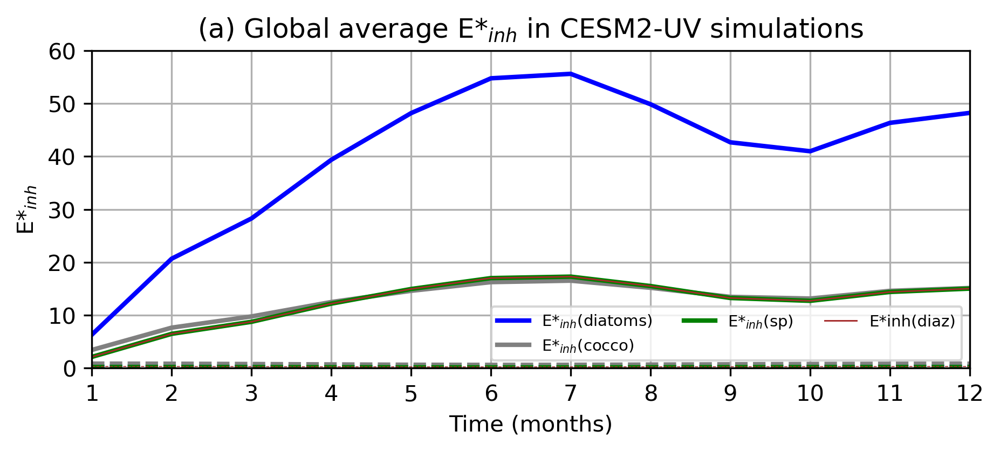

In [30]:

# ATM_EPHYTO1: Diatoms
# ATM_EPHYTO4: sp & diaz
# ATM_EPHYTO5: cocco
var_label={}; var_color={}
var='ATM_EPHYTO1_NET'; var_label[var] = 'E*$_{inh}$(diatoms)'; var_color[var]='blue'
var='ATM_EPHYTO7_NET'; var_label[var] = 'E*$_{inh}$(sp)'; var_color[var]='green' # green AND red !!
var='ATM_EPHYTO5_NET'; var_label[var] = 'E*$_{inh}$(cocco)'; var_color[var]='grey'
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV
EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
EINH_CASES=[EINH20X_DATM_CNL_4P2Z,EINHPI_DATM_CNL_4P2Z]
plt.figure(figsize=[7,2.55])  
for var in ['ATM_EPHYTO1_NET','ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
    for case in EINH_CASES:
        scale=1
        plot_data = monthly_data[case][var]
        print(case,var, np.nanmean(plot_data))
        ann_mean=np.nanmean(plot_data[0:12]); 
        ts=np.linspace(1,len(plot_data[:]),len(plot_data)); #print(len(ts))
        #plt.scatter(ts,plot_data[:],s=0.5,color='k')
        scale=2
        if case==EINH20X_DATM_CNL_4P2Z:
            case_label=var_label[var]#+' in 20x PI'#+'\n Last 6 months: \n'+str(ann_mean)[0:5]+' Pg C $yr^{-1}$'; #case_color='yellow'
            linestyle='solid'; 
            plt.plot(ts,plot_data,label=case_label,linewidth=1*scale,linestyle=linestyle,color=var_color[var]); 
            if var == 'ATM_EPHYTO7_NET':
                plt.plot(ts,plot_data,label='E*inh(diaz)',linewidth=1*scale*0.35,linestyle=linestyle,color='brown');
        else:
            scale=1.5
            case_label=var_label[var]+' in PI'
            linestyle='--'
            plt.plot(ts,plot_data,linewidth=1*scale,linestyle=linestyle,color=var_color[var]); 
            if var == 'ATM_EPHYTO7_NET':
                plt.plot(ts,plot_data,linewidth=1*scale*0.25,linestyle=linestyle,color='brown');


plt.title('(a) Global average E*$_{inh}$ in CESM2-UV simulations'); plt.xlabel('Time (months)'); plt.ylabel('E*$_{inh}$')
props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)#,fontsize=2)
#ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
plt.xlim([1,12])
plt.ylim([0,60])
#plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24],('1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20','21','22','23','24'))
plt.grid(); #plt.xlim([0.95,12.05]); #plt.ylim([1.4,8.5])
plt.legend(loc='best',ncol=3,fontsize=7)
plt.savefig('GMD24_figs/Figure3a.eps')
plt.savefig('GMD24_figs/Figure3a.png')
plt.show()

In [429]:
#
#now create a map of E*inh values !!! 
#

# get files


OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 
files_h0={}

REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI'
REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]

for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]




# these are really the only three cases that I care about - only look at the first two years here 
files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z] = files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][-60:]
files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]
files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]




In [430]:
# now create a map of E*inh values
EINH_CASES=CASES
cesm_ds={}
for case in EINH_CASES: # cycle through cases as defined above 
  cesm_mon_ds=xr.open_mfdataset(files_h0[case][:],combine='nested',concat_dim='time')#,decode_times=False,decode_coords=False, concat_dim='time')
  coords = {'x':'TLONG','y':'TLAT'}
  keepthese=['z_t','z_t_150m','time_bound','TAREA','REGION_MASK']
  vars = ['ATM_EPHYTO1UVA_NET','ATM_EPHYTO5UVA_NET','ATM_EPHYTO7UVA_NET','ATM_EPHYTO1UVB_NET','ATM_EPHYTO5UVB_NET','ATM_EPHYTO7UVB_NET','ATM_EPHYTO1UVC_NET','ATM_EPHYTO5UVC_NET','ATM_EPHYTO7UVC_NET','IFRAC'] # ALL 4 
  keepthese = keepthese+vars
  keep_vars = keepthese +list(coords.values())+['dz','KMT']
  cesm_mon_ds = cesm_mon_ds.drop([v for v in cesm_mon_ds.variables if v not in keep_vars])
  cesm_ds[case] = pop_add_cyclic(cesm_mon_ds) 
  cesm_ds[case]['ATM_EPHYTO1_NET']=cesm_ds[case]['ATM_EPHYTO1UVA_NET'] + cesm_ds[case]['ATM_EPHYTO1UVB_NET'] + cesm_ds[case]['ATM_EPHYTO1UVC_NET']
  cesm_ds[case]['ATM_EPHYTO5_NET']=cesm_ds[case]['ATM_EPHYTO5UVA_NET'] + cesm_ds[case]['ATM_EPHYTO5UVB_NET'] + cesm_ds[case]['ATM_EPHYTO5UVC_NET']
  cesm_ds[case]['ATM_EPHYTO7_NET']=cesm_ds[case]['ATM_EPHYTO7UVA_NET'] + cesm_ds[case]['ATM_EPHYTO7UVB_NET'] + cesm_ds[case]['ATM_EPHYTO7UVC_NET']



In [431]:
EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z

XXX=4

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors

scale_factor = 12*1e-2*1e-3 *86400
boundaries={}
boundaries[EINHPI_DATM_CNL_4P2Z] = np.array([0,10,20,30,40,50,60,70,80,90,100])*0.02
boundaries[EINH20X_DATM_CNL_4P2Z]=np.array([0,10,20,30,40,50,60,70,80,90,100])*0.2
#boundaries[EINHPI_WACCM6_CNL_4P2Z] = boundaries['20x PI']

colors_diff = get_colors('YlOrRd',12,add_white=-1)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365
scale_factor=1
from cartopy.util import add_cyclic_point

In [ ]:
#EINH_CASES=['CESM214_tuvcpl_datm_marbl4p2z_CNL_PICPOC_EinhPI','CESM214_tuvcpl_datm_marbl4p2z_CNL_PICPOC_Einh20xPI']
#EINH_CASES=[]

/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3395800051.py:16: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3395800051.py:33: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3395800051.py:34: RuntimeWarning: Mean of empty slice
  diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)


KeyError: 'CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'

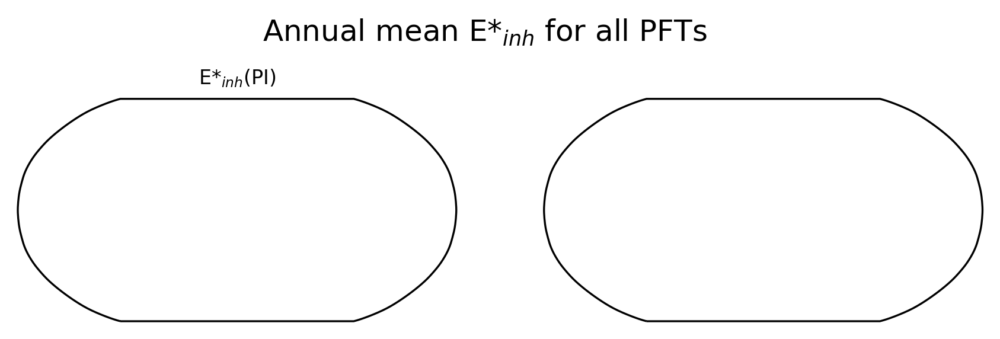

In [432]:
#CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]

# these aliases were used in the old jupyter notebook, so  
EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV
EINH_CASES=[EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]
FILTER_OUT_ICE=False
for yr in [1]:
    ax={}
    pc={}
    fig,(ax[EINHPI_DATM_CNL_4P2Z],ax[EINH20X_DATM_CNL_4P2Z])= plt.subplots(1,2,figsize =(7,2.55),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('Annual mean E*$_{inh}$ for all PFTs',y=0.92)
    for case in EINH_CASES:
        scale_factor=1
        ICE=np.array(cesm_ds[EINHPI_DATM_CNL_4P2Z]['IFRAC'][:])
        ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
        diff1=[]
        if case==EINH20X_DATM_CNL_4P2Z:
            diff_both = np.array(diff_both)*1.0
            case_label='E*$_{inh}$(halogen)'
            for var in ['ATM_EPHYTO1_NET','ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                        EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0)
        else:
            case_label='E*$_{inh}$(PI)'
            for var in ['ATM_EPHYTO1_NET','ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                    EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
        ax[case].set_title(case_label,fontsize=8)
        TLONG = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLONG']; TLAT = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLAT']
        #diff_both[ICE>0.1] = 0.0
        pc[case]=ax[case].contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries[case],transform=ccrs.PlateCarree(),extend='max')
        ax[case].contour(TLONG,TLAT,ICE_ann_mean,levels=[0.1],colors='blue',transform=ccrs.PlateCarree(),linewidths=0.4)
        #ax[case].contour(TLONG,TLAT,diff_both,colors='k',levels=[1e-10],transform=ccrs.PlateCarree(),linewidths=1)
        ax[case].coastlines(); 
        ax[case].add_feature(land_object)
    if True:#case=='control':
        case=EINHPI_DATM_CNL_4P2Z
        position = fig.add_axes([0.03,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
        case=EINH20X_DATM_CNL_4P2Z
        position = fig.add_axes([0.55,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    plt.savefig('GMD24_figs/Figure3b.eps')
    plt.savefig('GMD24_figs/Figure3b.png')
    plt.show()


In [433]:

gammauv_avg={}

for case in [EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]:
    cesm_ds[case]['gammaUV_ATM_EPHYTO1_NET']=cesm_ds[case]['ATM_EPHYTO1_NET']
    cesm_ds[case]['gammaUV_ATM_EPHYTO1_NET'] = 1 + cesm_ds[case]['ATM_EPHYTO1_NET']# = # ephyto1 is diatom e model or 1 / 1 + e*inh
    cesm_ds[case]['gammaUV_ATM_EPHYTO1_NET'] = cesm_ds[case]['gammaUV_ATM_EPHYTO1_NET']**-1

    gammauv_ephyto1 = np.nanmean(cesm_ds[case]['gammaUV_ATM_EPHYTO1_NET'],axis=0)

    cesm_ds[case]['gammaUV_ATM_EPHYTO5_NET']=cesm_ds[case]['ATM_EPHYTO5_NET']
    einh_ephyto5 = np.nanmean(cesm_ds[case]['gammaUV_ATM_EPHYTO5_NET'],axis=0)
    gammauv_ephyto5 = np.array(einh_ephyto5)
    gammauv_ephyto5 = einh_ephyto5**-1
    gammauv_ephyto5[einh_ephyto5<1] = 1.0

    cesm_ds[case]['gammaUV_ATM_EPHYTO7_NET']=cesm_ds[case]['ATM_EPHYTO7_NET']
    emax=0.54
    c = (1 + emax) / emax

    einh_ephyto7 = np.nanmean(cesm_ds[case]['gammaUV_ATM_EPHYTO7_NET'],axis=0)
    gammauv_ephyto7 = np.array(einh_ephyto7)
    gammauv_ephyto7_low = np.array(gammauv_ephyto7)
    gammauv_ephyto7_high = np.array(gammauv_ephyto7)

    gammauv_ephyto7_low = ( 1 + einh_ephyto7)**-1
    gammauv_ephyto7_low[einh_ephyto7>emax] = 0.0 # zero out when too high

    gammauv_ephyto7_high = (c*einh_ephyto7)**-1
    gammauv_ephyto7_high[einh_ephyto7<=emax] = 0.0 # zero out when too low

    gammauv_ephyto7 = gammauv_ephyto7_high + gammauv_ephyto7_low

    gammauv_avg[case] = [gammauv_ephyto1,gammauv_ephyto5,gammauv_ephyto7]
    gammauv_avg[case] = np.nanmean(gammauv_avg[case],axis=0)

/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/639004528.py:8: RuntimeWarning: Mean of empty slice
  gammauv_ephyto1 = np.nanmean(cesm_ds[case]['gammaUV_ATM_EPHYTO1_NET'],axis=0)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/639004528.py:11: RuntimeWarning: Mean of empty slice
  einh_ephyto5 = np.nanmean(cesm_ds[case]['gammaUV_ATM_EPHYTO5_NET'],axis=0)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/639004528.py:20: RuntimeWarning: Mean of empty slice
  einh_ephyto7 = np.nanmean(cesm_ds[case]['gammaUV_ATM_EPHYTO7_NET'],axis=0)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/639004528.py:34: RuntimeWarning: Mean of empty slice
  gammauv_avg[case] = np.nanmean(gammauv_avg[case],axis=0)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/639004528.py:8: RuntimeWarning: Mean of empty slice
  gammauv_ephyto1 = np.nanmean(cesm_ds[case]['gammaUV_ATM_EPHYTO1_NET'],axis=0)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/639004528.py:11: RuntimeWarning: Mean of empty slice
  einh_ephy

In [434]:

scale_factor = 12*1e-2*1e-3 *86400
boundaries={}
boundaries[EINHPI_DATM_CNL_4P2Z] = np.array([0,10,20,30,40,50,60,70,80,90,100])*0.01
boundaries[EINH20X_DATM_CNL_4P2Z]=np.array([0,10,20,30,40,50,60,70,80,90,100])*0.01
#boundaries[EINHPI_WACCM6_CNL_4P2Z] = boundaries['20x PI']

colors_diff = get_colors('YlOrRd_r',12,add_white=-1)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365
scale_factor=1
from cartopy.util import add_cyclic_point

/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2445514047.py:16: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2445514047.py:33: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2445514047.py:34: RuntimeWarning: Mean of empty slice
  diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2445514047.py:25: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2445514047.py:26: RuntimeWarning: Mean of empty slice
  diff_both = np.nanmean(diff1,axis=0)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2445514047.py:58: UserWarning: This figure includes Axes that are not compat

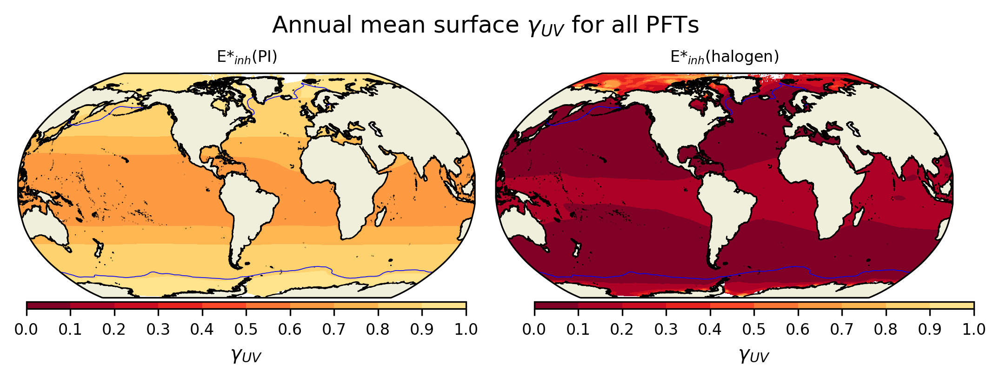

In [435]:
# try and convert this figure to gamma UV instead...
#CASES=[REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z,REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z,REV_EINH0XPI_DATM_CNL04_4P2Z]
# these aliases were used in the old jupyter notebook, so 
EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV
EINH_CASES=[EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]
FILTER_OUT_ICE=False
for yr in [1]:
    ax={}
    pc={}
    fig,(ax[EINHPI_DATM_CNL_4P2Z],ax[EINH20X_DATM_CNL_4P2Z])= plt.subplots(1,2,figsize =(7,2.55),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('Annual mean surface $\gamma$$_{UV}$ for all PFTs',y=0.92)
    for case in EINH_CASES:
        scale_factor=1
        ICE=np.array(cesm_ds[EINHPI_DATM_CNL_4P2Z]['IFRAC'][:])
        ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
        diff1=[]
        if case==EINH20X_DATM_CNL_4P2Z:
            diff_both = np.array(diff_both)*1.0
            case_label='E*$_{inh}$(halogen)'
            for var in ['ATM_EPHYTO1_NET','ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                        EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0)
        else:
            case_label='E*$_{inh}$(PI)'
            for var in ['ATM_EPHYTO1_NET','ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                    EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
        ax[case].set_title(case_label,fontsize=8)

        diff_both=gammauv_avg[case] # set diff_both to what we want (forced)
        TLONG = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLONG']; TLAT = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLAT']
        #diff_both[ICE>0.1] = 0.0
        pc[case]=ax[case].contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries[case],transform=ccrs.PlateCarree(),transform_first=True)#,extend='none')
        ax[case].contour(TLONG,TLAT,ICE_ann_mean,levels=[0.1],colors='blue',transform=ccrs.PlateCarree(),linewidths=0.4)
        #ax[case].contour(TLONG,TLAT,diff_both,colors='k',levels=[1e-10],transform=ccrs.PlateCarree(),linewidths=1)
        ax[case].coastlines(); 
        ax[case].add_feature(land_object)
    if True:#case=='control':
        case=EINHPI_DATM_CNL_4P2Z
        position = fig.add_axes([0.03,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='none',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('$\gamma$$_{UV}$');#cbar1.set_label('g C $yr^{-1}$')
        case=EINH20X_DATM_CNL_4P2Z
        position = fig.add_axes([0.55,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='none',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('$\gamma$$_{UV}$');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    #plt.savefig('GMD24_figs/Figure3b.eps')
    #plt.savefig('GMD24_figs/Figure3b.png')
    plt.show()


In [327]:
np.nanmean(gammauv_ephyto1)

0.13271122

/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3549031504.py:15: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3549031504.py:32: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3549031504.py:33: RuntimeWarning: Mean of empty slice
  diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3549031504.py:15: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3549031504.py:24: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3549031504.py:25: RuntimeWarning: Mean of empty slice


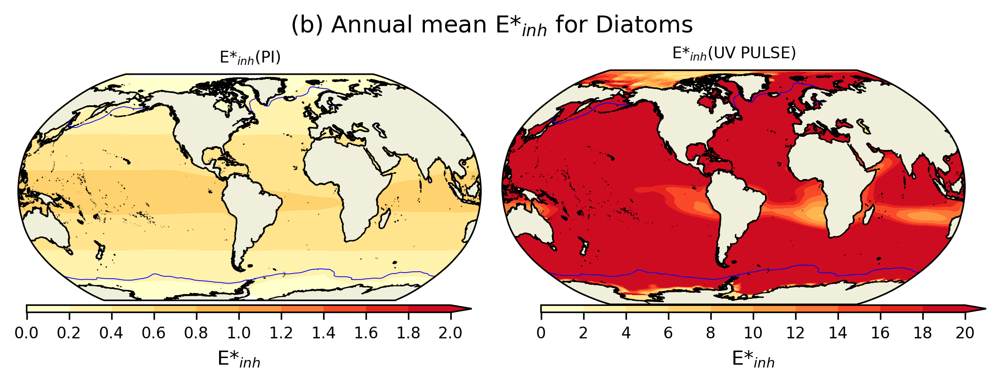

In [51]:
# recreate the above plot but for each individual pft E*inh !

EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV
EINH_CASES=[EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]
FILTER_OUT_ICE=False
for yr in [1]:
    ax={}
    pc={}
    fig,(ax[EINHPI_DATM_CNL_4P2Z],ax[EINH20X_DATM_CNL_4P2Z])= plt.subplots(1,2,figsize =(7,2.55),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean E*$_{inh}$ for Diatoms',y=0.92)
    for case in EINH_CASES:
        scale_factor=1
        ICE=np.array(cesm_ds[EINHPI_DATM_CNL_4P2Z]['IFRAC'][:])
        ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
        diff1=[]
        if case==EINH20X_DATM_CNL_4P2Z:
            diff_both = np.array(diff_both)*1
            case_label='E*$_{inh}$(UV PULSE)'
            for var in ['ATM_EPHYTO1_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                        EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0)
        else:
            case_label='E*$_{inh}$(PI)'
            for var in ['ATM_EPHYTO1_NET']:#,'ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                    EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
        ax[case].set_title(case_label,fontsize=8)
        TLONG = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLONG']; TLAT = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLAT']
        #diff_both[ICE>0.1] = 0.0
        pc[case]=ax[case].contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries[case],transform=ccrs.PlateCarree(),extend='max')
        ax[case].contour(TLONG,TLAT,ICE_ann_mean,levels=[0.1],colors='blue',transform=ccrs.PlateCarree(),linewidths=0.4)
        #ax[case].contour(TLONG,TLAT,diff_both,colors='k',levels=[1e-10],transform=ccrs.PlateCarree(),linewidths=1)
        ax[case].coastlines(); 
        ax[case].add_feature(land_object)
    if True:#case=='control':
        case=EINHPI_DATM_CNL_4P2Z
        position = fig.add_axes([0.03,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
        case=EINH20X_DATM_CNL_4P2Z
        position = fig.add_axes([0.55,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    plt.savefig('GMD24_figs/Figure3b.eps')
    plt.savefig('GMD24_figs/Figure3b.png')
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2863040981.py:15: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2863040981.py:33: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2863040981.py:34: RuntimeWarning: Mean of empty slice
  diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2863040981.py:15: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2863040981.py:24: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2863040981.py:25: RuntimeWarning: Mean of empty slice


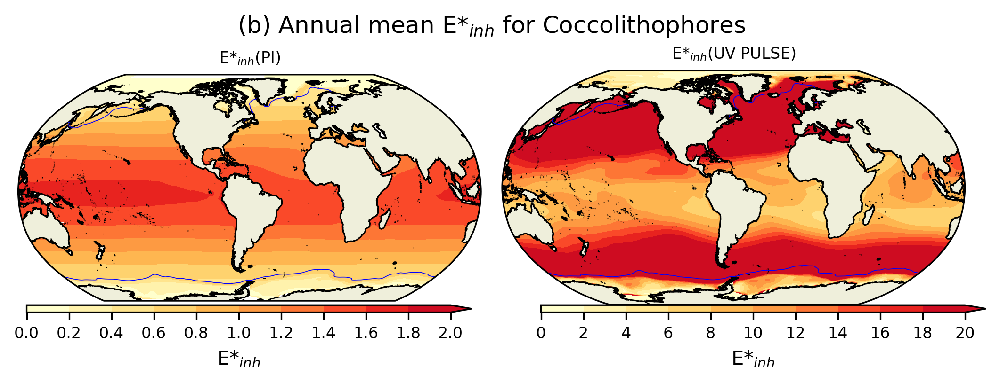

In [50]:
# recreate the above plot but for each individual pft E*inh !

EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z
EINH_CASES=[EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]
FILTER_OUT_ICE=False
for yr in [1]:
    ax={}
    pc={}
    fig,(ax[EINHPI_DATM_CNL_4P2Z],ax[EINH20X_DATM_CNL_4P2Z])= plt.subplots(1,2,figsize =(7,2.55),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean E*$_{inh}$ for Coccolithophores',y=0.92)
    for case in EINH_CASES:
        scale_factor=1
        ICE=np.array(cesm_ds[EINHPI_DATM_CNL_4P2Z]['IFRAC'][:])
        ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
        diff1=[]
        if case==EINH20X_DATM_CNL_4P2Z:
            diff_both = np.array(diff_both)*1
            case_label='E*$_{inh}$(UV PULSE)'
            for var in ['ATM_EPHYTO5_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                        EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0)

        else:
            case_label='E*$_{inh}$(PI)'
            for var in ['ATM_EPHYTO5_NET']:#,'ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                    EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
        ax[case].set_title(case_label,fontsize=8)
        TLONG = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLONG']; TLAT = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLAT']
        #diff_both[ICE>0.1] = 0.0
        pc[case]=ax[case].contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries[case],transform=ccrs.PlateCarree(),extend='max')
        ax[case].contour(TLONG,TLAT,ICE_ann_mean,levels=[0.1],colors='blue',transform=ccrs.PlateCarree(),linewidths=0.4)
        #ax[case].contour(TLONG,TLAT,diff_both,colors='k',levels=[1e-10],transform=ccrs.PlateCarree(),linewidths=1)
        ax[case].coastlines(); 
        ax[case].add_feature(land_object)
    if True:#case=='control':
        case=EINHPI_DATM_CNL_4P2Z
        position = fig.add_axes([0.03,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
        case=EINH20X_DATM_CNL_4P2Z
        position = fig.add_axes([0.55,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    plt.savefig('GMD24_figs/Figure3b.eps')
    plt.savefig('GMD24_figs/Figure3b.png')
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/627797111.py:15: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/627797111.py:32: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/627797111.py:33: RuntimeWarning: Mean of empty slice
  diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/627797111.py:15: RuntimeWarning: All-NaN slice encountered
  ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/627797111.py:24: RuntimeWarning: Mean of empty slice
  diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/627797111.py:25: RuntimeWarning: Mean of empty slice
  diff

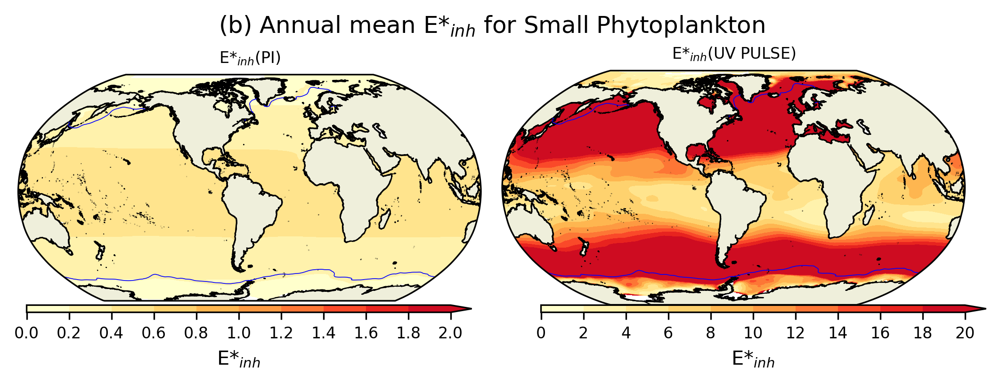

In [49]:
# recreate the above plot but for each individual pft E*inh !

EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z
EINH_CASES=[EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]
FILTER_OUT_ICE=False
for yr in [1]:
    ax={}
    pc={}
    fig,(ax[EINHPI_DATM_CNL_4P2Z],ax[EINH20X_DATM_CNL_4P2Z])= plt.subplots(1,2,figsize =(7,2.55),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean E*$_{inh}$ for Small Phytoplankton',y=0.92)
    for case in EINH_CASES:
        scale_factor=1
        ICE=np.array(cesm_ds[EINHPI_DATM_CNL_4P2Z]['IFRAC'][:])
        ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
        diff1=[]
        if case==EINH20X_DATM_CNL_4P2Z:
            #diff_both = np.array(diff_both)*5
            case_label='E*$_{inh}$(UV PULSE)'
            for var in ['ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                        EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0)
        else:
            case_label='E*$_{inh}$(PI)'
            for var in ['ATM_EPHYTO7_NET']:#,'ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                    EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
            diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
        ax[case].set_title(case_label,fontsize=8)
        TLONG = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLONG']; TLAT = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLAT']
        #diff_both[ICE>0.1] = 0.0
        pc[case]=ax[case].contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries[case],transform=ccrs.PlateCarree(),extend='max')
        ax[case].contour(TLONG,TLAT,ICE_ann_mean,levels=[0.1],colors='blue',transform=ccrs.PlateCarree(),linewidths=0.4)
        #ax[case].contour(TLONG,TLAT,diff_both,colors='k',levels=[1e-10],transform=ccrs.PlateCarree(),linewidths=1)
        ax[case].coastlines(); 
        ax[case].add_feature(land_object)
    if True:#case=='control':
        case=EINHPI_DATM_CNL_4P2Z
        position = fig.add_axes([0.03,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
        case=EINH20X_DATM_CNL_4P2Z
        position = fig.add_axes([0.55,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    plt.savefig('GMD24_figs/Figure3b.eps')
    plt.savefig('GMD24_figs/Figure3b.png')
    plt.show()


In [ ]:
# convert the FIRST PLOT to GAMMA !!!

EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z
EINH_CASES=[EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]
FILTER_OUT_ICE=False
for yr in [1]:
    ax={}
    pc={}
    fig,(ax[EINHPI_DATM_CNL_4P2Z],ax[EINH20X_DATM_CNL_4P2Z])= plt.subplots(1,2,figsize =(7,2.55),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean E*$_{inh}$ for all PFTs',y=0.92)
    for case in EINH_CASES:
        scale_factor=1
        ICE=np.array(cesm_ds[EINHPI_DATM_CNL_4P2Z]['IFRAC'][:])
        ICE_ann_mean = np.array(np.nanmax(ICE[0:12],axis=0))
        diff1=[]
        if case==EINH20X_DATM_CNL_4P2Z:
            diff_both = np.array(diff_both)*20
            case_label='E*$_{inh}$(UV PULSE)'
        else:
            case_label='E*$_{inh}$(PI)'
            for var in ['ATM_EPHYTO1_NET','ATM_EPHYTO5_NET','ATM_EPHYTO7_NET']:
                EINH=np.array(cesm_ds[case][var][:])
                if FILTER_OUT_ICE:
                    EINH[ICE>0.1] = 0.0 # filter out EINH where ICE is > 0.1 
                diff1.append(np.array(np.nanmean(EINH,axis=0))) # annual mean for each PFT
                # now compute gamma !!
                if var == 'ATM_EPHYTO1_NET': # diatoms, then use E model?
                    gamma = 1.0 + np.array(diff1[0])
                    gamma = gamma**-1 # take the inverse to find gamma and use gamma !
            diff_both = np.nanmean(diff1,axis=0) # average across PFTs; #diff_both = np.subtract(diff1,diff2)
            gamma_both
        ax[case].set_title(case_label,fontsize=8)
        TLONG = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLONG']; TLAT = cesm_ds[EINHPI_DATM_CNL_4P2Z]['TLAT']
        #diff_both[ICE>0.1] = 0.0
        pc[case]=ax[case].contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries[case],transform=ccrs.PlateCarree(),extend='max')
        ax[case].contour(TLONG,TLAT,ICE_ann_mean,levels=[0.1],colors='blue',transform=ccrs.PlateCarree(),linewidths=0.4)
        #ax[case].contour(TLONG,TLAT,diff_both,colors='k',levels=[1e-10],transform=ccrs.PlateCarree(),linewidths=1)
        ax[case].coastlines(); 
        ax[case].add_feature(land_object)
    if True:#case=='control':
        case=EINHPI_DATM_CNL_4P2Z
        position = fig.add_axes([0.03,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
        case=EINH20X_DATM_CNL_4P2Z
        position = fig.add_axes([0.55,0.09,0.45,0.02])
        cbar1 = fig.colorbar(pc[case],extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
        cbar1.ax.tick_params(labelsize=8)
        cbar1.set_ticks(boundaries[case])
        cbar1.set_label('E*$_{inh}$');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    plt.savefig('GMD24_figs/Figure3b.eps')
    plt.savefig('GMD24_figs/Figure3b.png')
    plt.show()




In [4]:
# create maps of NPP


import glob as glob
import os
from collections import OrderedDict
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc4
import matplotlib.pyplot as plt
import matplotlib as mpl
from pylab import *; 
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300



def pop_add_cyclic(ds): # pass an xarray object into this
    nj = ds.TLAT.shape[0] # size of POP grid
    ni = ds.TLONG.shape[1]
    xL = int(ni/2 - 1)
    xR = int(xL + ni)
    tlon = ds.TLONG.data
    tlat = ds.TLAT.data
    tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon) #make monotoncially increasing
    lon  = np.concatenate((tlon, tlon + 360.), 1) # concatenate to make larger array
    lon = lon[:, xL:xR] #restrict to middle rane
    if ni == 320: # this is the x1 POP grid
        print('\n')
    lon = lon - 360.
    lon = np.hstack((lon, lon[:, 0:1] + 360.)) # add in cyclic point
    if ni == 320:
        print('\n')
    #-- periodicity
    lat = np.concatenate((tlat, tlat), 1)
    lat = lat[:, xL:xR]
    lat = np.hstack((lat, lat[:,0:1]))
    TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
    TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
    dso = xr.Dataset({'TLAT': TLAT, 'TLONG': TLONG})
    # copy vars
    varlist = [v for v in ds.data_vars if v not in ['TLAT', 'TLONG']]
    for v in varlist:
        v_dims = ds[v].dims
        if not ('nlat' in v_dims and 'nlon' in v_dims):
            dso[v] = ds[v]
        else:
            # determine and sort other dimensions
            other_dims = set(v_dims) - {'nlat', 'nlon'}
            other_dims = tuple([d for d in v_dims if d in other_dims])
            lon_dim = ds[v].dims.index('nlon')
            field = ds[v].data
            field = np.concatenate((field, field), lon_dim)
            field = field[..., :, xL:xR]
            field = np.concatenate((field, field[..., :, 0:1]), lon_dim)       
            dso[v] = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), 
                                  attrs=ds[v].attrs)
    # copy coords
    for v, da in ds.coords.items():
        if not ('nlat' in da.dims and 'nlon' in da.dims):
            dso = dso.assign_coords(**{v: da})     
    return dso









In [23]:

OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 
files_h0={}

REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'

REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI'

REV_EINHPULSE_DATM_CNL03_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL03_PICPOC_EinhPULSE'
REV_EINHPULSEv01_DATM_CNL03_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL03_PICPOC_EinhPULSEv01'
REV_EINHPULSEv01_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_EinhPULSEv01' # this replaces guan and gao (2009) with lorenzo 

REV_EINHPULSEv01_DATM_CNL04_PICPOC01_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC01_EinhPULSEv01'
REV_EINHPULSEv01_DATM_CNL04_PICPOC02_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC02_EinhPULSEv01'
REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01'
REV_EINHPULSEv01_DATM_CNL05_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

REV_EINH20XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_EinhPIx20'

# 900 ppm cases
REV_EINH0XPI_DATM_CNL04_4P2Z_900PPM = 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_Einh0xPI_900ppm'
REV_EINHPI_DATM_CNL04_4P2Z_900PPM = 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_EinhPI_900ppm'


CASES=[REV_EINHPULSEv01_DATM_CNL05_PICPOC06_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z,REV_EINH0XPI_DATM_CNL04_4P2Z]
for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]



########### replace the above .... ############

OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 


REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'
REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]

for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]


# these subsetting lines are important because E*inh(0x PI) now includes a longer spin-up
files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z] = files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][-60:]
files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]
files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]




In [24]:
for case in CASES:
    print(files_h0[case][-1])

/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv.pop.h.0014-12.nc
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv.pop.h.0014-12.nc
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv.pop.h.0014-12.nc


In [25]:
# get data cesm_ds={}

# assign aliases

EINH0X_DATM_CNL_4P2Z=REV_EINH0XPI_DATM_CNL04_4P2Z
EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV

CASES=[EINH0X_DATM_CNL_4P2Z,EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]
cesm_ds={}
for case in CASES: # cycle through cases as defined above 
  print(case)
  cesm_mon_ds=xr.open_mfdataset(files_h0[case][:],combine='nested',concat_dim='time')#,decode_times=False,decode_coords=False, concat_dim='time')
  coords = {'x':'TLONG','y':'TLAT'}
  keepthese=['z_t','z_t_150m','time_bound','TAREA','REGION_MASK']
  vars = ['photoC_diat_zint','photoC_diaz_zint','photoC_sp_zint','photoC_cocco_zint','photoC_TOT_zint']
  keepthese = keepthese+vars
  keep_vars = keepthese +list(coords.values())+['dz','KMT']
  cesm_mon_ds = cesm_mon_ds.drop([v for v in cesm_mon_ds.variables if v not in keep_vars])
  cesm_ds[case] = pop_add_cyclic(cesm_mon_ds) 
  print('Done. Starting next case ...')
    

CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv




Done. Starting next case ...
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv




Done. Starting next case ...
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv




Done. Starting next case ...


In [ ]:
#EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z
#EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z
#REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI'


/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/167913721.py:33: RuntimeWarning: Mean of empty slice
  diff1 = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/167913721.py:43: RuntimeWarning: Mean of empty slice
  diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/167913721.py:55: RuntimeWarning: Mean of empty slice
  diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/167913721.py:62: RuntimeWarning: Mean of empty slice
  diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/167913721.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])


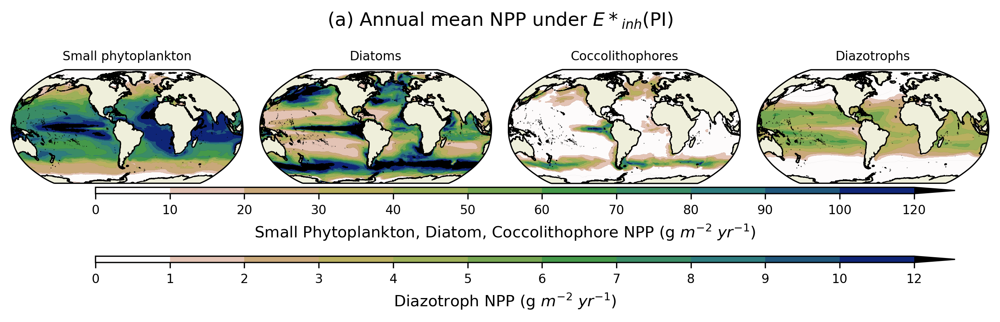

In [26]:
XXX=4

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors

scale_factor = 12*1e-2*1e-3 *86400
boundaries=np.array(np.linspace(0,12,12))*10
boundaries = np.array([0,10,20,30,40,50,60,70,80,90,100,120])
boundaries_small=np.array(np.linspace(0,12,12))*1
boundaries_small = np.array([0,1,2,3,4,5,6,7,8,9,10,12])

colors_diff = get_colors('gist_earth_r',12,add_white=-1)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365
from cartopy.util import add_cyclic_point
for case in [EINHPI_DATM_CNL_4P2Z]: # only plotting e*inh(PI), note this is a hard-coded alias
    var='photoC_sp_zint'
    diff1 = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    diff_both = diff1; #diff_both = np.subtract(diff1,diff2)
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(9,2.8),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(a) Annual mean NPP under $E*_{inh}$(PI)',y=0.8)
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='max')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='max')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('Small Phytoplankton, Diatom, Coccolithophore NPP (g $m^{-2}$ $yr^{-1}$)');#cbar1.set_label('g C $yr^{-1}$')
    
    var='photoC_cocco_zint'
    diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='max')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries_small,transform=ccrs.PlateCarree(),transform_first=True,extend='max')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries_small,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    position = fig.add_axes([0.10,0.001,0.85,0.02])
    cbar1 = fig.colorbar(pc4,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries_small)
    cbar1.set_label('Diazotroph NPP (g $m^{-2}$ $yr^{-1}$)');#cbar1.set_label('g C $yr^{-1}$')
    #fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('GMD24_figs/Figure4a.eps')
    plt.savefig('GMD24_figs/Figure4a.png')
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/4175201632.py:31: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * ZERO**-1*100; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/4175201632.py:31: RuntimeWarning: invalid value encountered in multiply
  diff_both = diff_both * ZERO**-1*100; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/4175201632.py:43: RuntimeWarning: Mean of empty slice
  ZERO = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/4175201632.py:44: RuntimeWarning: Mean of empty slice
  PI = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/4175201632.py:56: RuntimeWarning: Mean of empty slice
  ZERO = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scrat

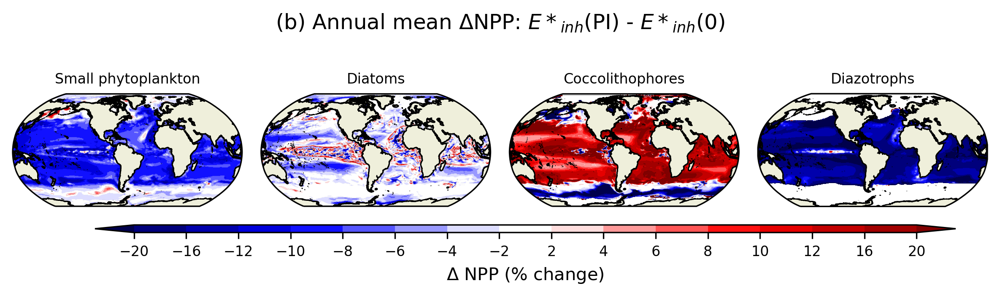

In [27]:
def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*2

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    var='photoC_sp_zint'
    ZERO = np.array(np.sum(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    PI = np.array(np.sum(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = PI-ZERO
    diff_both = diff_both * ZERO**-1*100; #diff_both = np.subtract(diff1,diff2)
    diff_both[diff_both<-25] = -25.0
    diff_both[diff_both>25]=25.0
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(8,3),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean $\Delta$NPP: $E*_{inh}$(PI) - $E*_{inh}$(0)',y=0.8)
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    ZERO = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    PI = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = PI-ZERO
    diff_both = diff_both * ZERO**-1*100; #diff_both = np.subtract(diff1,diff2)
    diff_both[diff_both<-25] = -25.0
    diff_both[diff_both>10]=-5.0
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)

    
    var='photoC_cocco_zint'
    ZERO = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    PI = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = PI-ZERO
    diff_both = diff_both * ZERO**-1*100; #diff_both = np.subtract(diff1,diff2)
    diff_both[diff_both<-25] = -25.0
    diff_both[diff_both>25]=25.0
    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    ZERO = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    PI = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = PI-ZERO
    diff_both = diff_both * ZERO**-1*100; #diff_both = np.subtract(diff1,diff2)
    diff_both[diff_both<-25] = -25.0
    diff_both[diff_both>25]=25.0
    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('GMD24_figs/Figure4b.eps')
    plt.savefig('GMD24_figs/Figure4b.png')
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/1643238999.py:15: RuntimeWarning: Mean of empty slice
  HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/1643238999.py:16: RuntimeWarning: Mean of empty slice
  REGULAR = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/1643238999.py:28: RuntimeWarning: Mean of empty slice
  HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/1643238999.py:29: RuntimeWarning: Mean of empty slice
  REGULAR = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/1643238999.py:39: RuntimeWarning: Mean of empty slice
  HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/sc

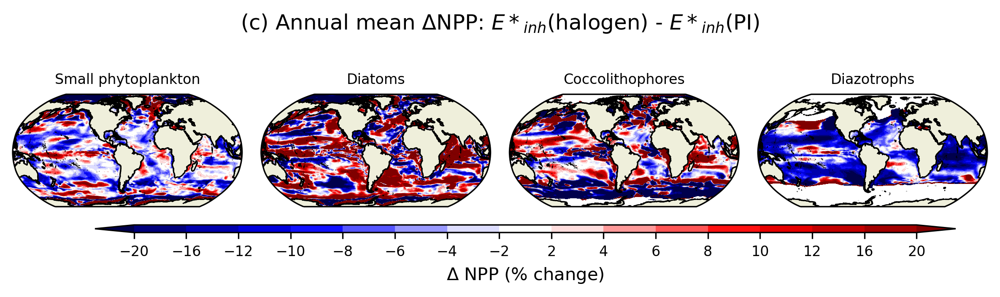

In [28]:

land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.1
#boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.2
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*2

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    var='photoC_sp_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(8,3),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(c) Annual mean $\Delta$NPP: $E*_{inh}$(halogen) - $E*_{inh}$(PI)',y=0.8)
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)

    
    var='photoC_cocco_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('GMD24_figs/Figure4c.eps')
    plt.savefig('GMD24_figs/Figure4c.png')
    plt.show()

/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2048400055.py:34: RuntimeWarning: Mean of empty slice
  diff1 = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2048400055.py:44: RuntimeWarning: Mean of empty slice
  diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2048400055.py:56: RuntimeWarning: Mean of empty slice
  diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2048400055.py:63: RuntimeWarning: Mean of empty slice
  diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2048400055.py:74: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])


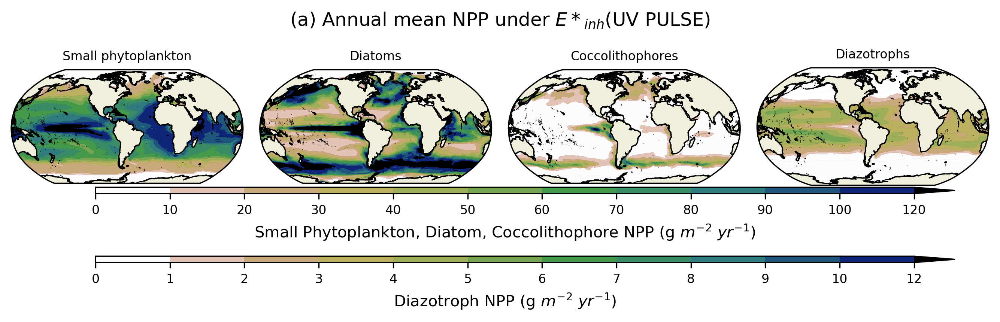

In [29]:
# recreate figure 4a but with E*inh(UV PULSE)
XXX=4

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors

scale_factor = 12*1e-2*1e-3 *86400
boundaries=np.array(np.linspace(0,12,12))*10
boundaries = np.array([0,10,20,30,40,50,60,70,80,90,100,120])
boundaries_small=np.array(np.linspace(0,12,12))*1
boundaries_small = np.array([0,1,2,3,4,5,6,7,8,9,10,12])

colors_diff = get_colors('gist_earth_r',12,add_white=-1)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365
from cartopy.util import add_cyclic_point
for case in [EINH20X_DATM_CNL_4P2Z]: # only plotting e*inh(PI)
    var='photoC_sp_zint'
    diff1 = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    diff_both = diff1; #diff_both = np.subtract(diff1,diff2)
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(9,2.8),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(a) Annual mean NPP under $E*_{inh}$(UV PULSE)',y=0.8)
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='max')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='max')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('Small Phytoplankton, Diatom, Coccolithophore NPP (g $m^{-2}$ $yr^{-1}$)');#cbar1.set_label('g C $yr^{-1}$')
    
    var='photoC_cocco_zint'
    diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='max')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    diff_both = np.array(np.nanmean(cesm_ds[case][var][:]*scale_factor,axis=0))
    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries_small,transform=ccrs.PlateCarree(),extend='max')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries_small,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    position = fig.add_axes([0.10,0.001,0.85,0.02])
    cbar1 = fig.colorbar(pc4,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries_small)
    cbar1.set_label('Diazotroph NPP (g $m^{-2}$ $yr^{-1}$)');#cbar1.set_label('g C $yr^{-1}$')
    #fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('GMD24_figs/Figure4a_pulse.eps')
    plt.savefig('GMD24_figs/Figure4a_pulse.png')
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2330733731.py:15: RuntimeWarning: Mean of empty slice
  HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2330733731.py:16: RuntimeWarning: Mean of empty slice
  REGULAR = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2330733731.py:28: RuntimeWarning: Mean of empty slice
  HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2330733731.py:29: RuntimeWarning: Mean of empty slice
  REGULAR = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_36390/2330733731.py:39: RuntimeWarning: Mean of empty slice
  HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
/glade/derecho/sc

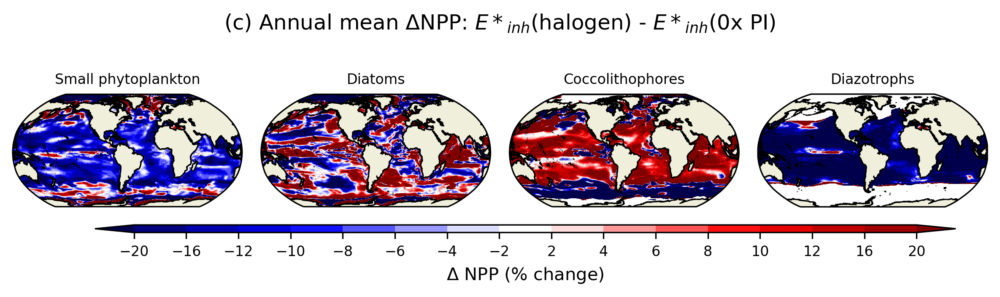

In [30]:

land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.1
#boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.2
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*2

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    var='photoC_sp_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(8,3),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(c) Annual mean $\Delta$NPP: $E*_{inh}$(halogen) - $E*_{inh}$(0x PI)',y=0.8)
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)

    
    var='photoC_cocco_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    HALOGEN = np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    REGULAR = np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var][:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.savefig('GMD24_figs/Figure4d.eps')
    plt.savefig('GMD24_figs/Figure4d.png')
    plt.show()

In [1]:
# figure 5 : vertical change in productivity


import glob as glob
import os
#from collections import OrderedDictq
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc4
import matplotlib.pyplot as plt
import matplotlib as mpl
from pylab import *; 
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300




In [2]:
# get files ( should be same as above tbh )


OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 
files_h0={}

REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'
REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPULSEv01'
REV_EINH20XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_EinhPIx20'

REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

# 900 ppm cases
REV_EINH0XPI_DATM_CNL04_4P2Z_900PPM = 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_Einh0xPI_900ppm'
REV_EINHPI_DATM_CNL04_4P2Z_900PPM = 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC_EinhPI_900ppm'


CASES=[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z,REV_EINH0XPI_DATM_CNL04_4P2Z]
for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]


#files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z]= files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z][0:12] # remove the first year 
# assign aliases



########### replace the above .... ############

OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 


REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'
REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]

for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]


# these subsetting lines are important because E*inh(0x PI) now includes a longer spin-up
files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z] = files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][-60:]
files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]
files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]





EINH0X_DATM_CNL_4P2Z=REV_EINH0XPI_DATM_CNL04_4P2Z
EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV

CASES=[EINH0X_DATM_CNL_4P2Z,EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]


In [3]:
for case in CASES:
    print(files_h0[case][-1])

/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv.pop.h.0014-12.nc
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv.pop.h.0014-12.nc
/glade/derecho/scratch/jcoupe/archive/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv/ocn/hist/CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv.pop.h.0014-12.nc


In [14]:
var='photoC_TOT' # z_t_150m
#var='photoC_cocco'

extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
TAREA = extract.variables['TAREA'][:]*(100**-2)
z_t_150m = extract.variables['z_t_150m'][:]*(0.01)

if True:
 scale_factor=1
 data={};
 for case in CASES:
     data[case]=np.zeros((60,len(z_t_150m)))
     print(case)
     for i in range(5):
         t=0
         for fi in files_h0[case][:]:
             extract = nc4.Dataset(fi,'r')
             tempdata = extract.variables[var][0]
             for lev in range(len(z_t_150m)):
                   data[case][t][lev] = np.average(tempdata[lev],weights=TAREA)
             t=t+1
                   #data[case][t][lev] = 1/(1+data[case][t][lev])
         #print(data[case])


CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv


In [10]:

def percent_anomaly(data,control):
   control_climo = np.nanmean(separate_by_month_arrays(control),axis=1)
   monthly_data = separate_by_month_arrays(data)
   percent_anom = []
   for yr in range(np.shape(monthly_data)[1]):
        for mo in range(np.shape(monthly_data)[0]):
          percent_anom.append( 100*(monthly_data[mo][yr] - control_climo[mo]) * (control_climo[mo]**-1))
   return percent_anom
    
def separate_by_month_arrays(dataset):
	k=0
	jan=[];feb=[];march=[];apr=[];may=[];jun=[];july=[];aug=[];sep=[];oc=[];nov=[];dec=[];
	while k <= (len(dataset)-12):
		jan.append((dataset[k]))
		feb.append((dataset[k+1]))
		march.append((dataset[k+2]))
		apr.append((dataset[k+3]))
		may.append((dataset[k+4]))
		jun.append((dataset[k+5]))
		july.append((dataset[k+6]))
		aug.append((dataset[k+7]))
		sep.append((dataset[k+8]))
		oc.append((dataset[k+9]))
		nov.append((dataset[k+10]))
		dec.append((dataset[k+11]))
		k = k+12;
	return [jan,feb,march,apr,may,jun,july,aug,sep,oc,nov,dec]

def monthly_anomaly(data,data_control,type='standard',NANDATA = False):
    monthly_data = separate_by_month_arrays(data)
    monthly_data_control = np.nanmean(separate_by_month_arrays(data_control),axis=1)
    new_data=[]
    if type == 'percent':
        return percent_anomaly(data,data_control)
    if type == 'standard':
        for yr in range(int(len(data)/12.0)):
            for mo in range(12):
                new_data.append(monthly_data[mo][yr] - monthly_data_control[mo])
        return new_data
    if type == 'sd':
        mdc_std = np.nanstd(separate_by_month_arrays(data_control),axis=1)
        for yr in range(int(len(data)/12.0)):
    	    for mo in range(12):
	          new_data.append( (monthly_data[mo][yr] - monthly_data_control[mo]) *(mdc_std[mo]**-1))
        return new_data



In [16]:
data_climo={}
data_climo2={}
for case in CASES:
    data_climo[case]=np.zeros((60,len(z_t_150m)))
    data_climo2[case]=np.zeros((13,15))
    data_climo[case] = separate_by_month_arrays( data[case])
    print(np.shape(data_climo[case]))
    data_climo[case] = np.nanmean(data_climo[case],axis=1)
    data_climo[case] = data_climo[case]
    data_climo2[case][0:12] = data_climo[case][0:12]
    data_climo2[case][12:13] = data_climo[case][0:1]
    print(np.shape(data_climo[case]))


(12, 5, 15)
(12, 15)
(12, 5, 15)
(12, 15)
(12, 5, 15)
(12, 15)


In [235]:
if False: # only if want to use only the first year of the UV pulse
    data_climo2[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z][0:12] = data[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z][0:12]
    data_climo2[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z][12:13] = data[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z][0:1]

/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/1274682371.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()


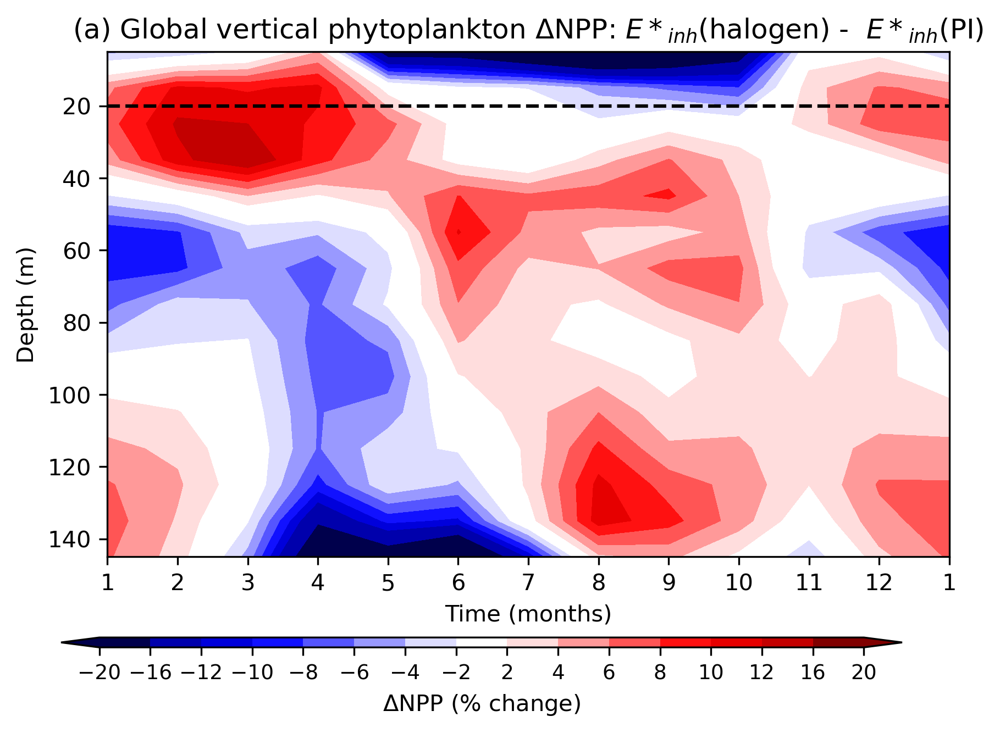

/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/1274682371.py:76: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()


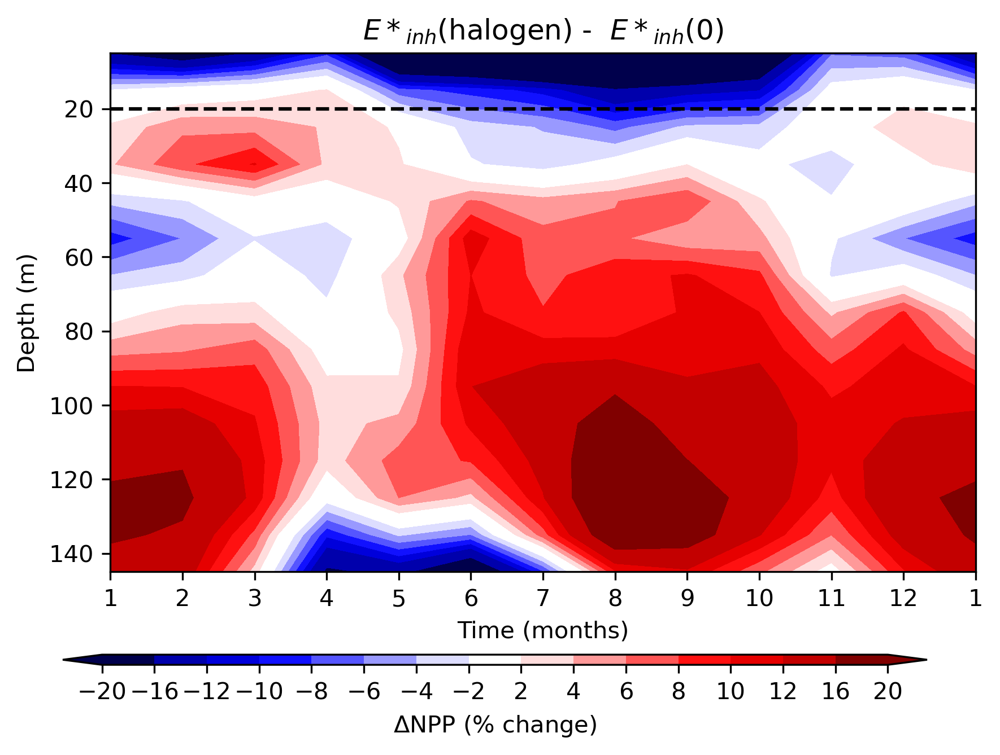

/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/1274682371.py:100: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()


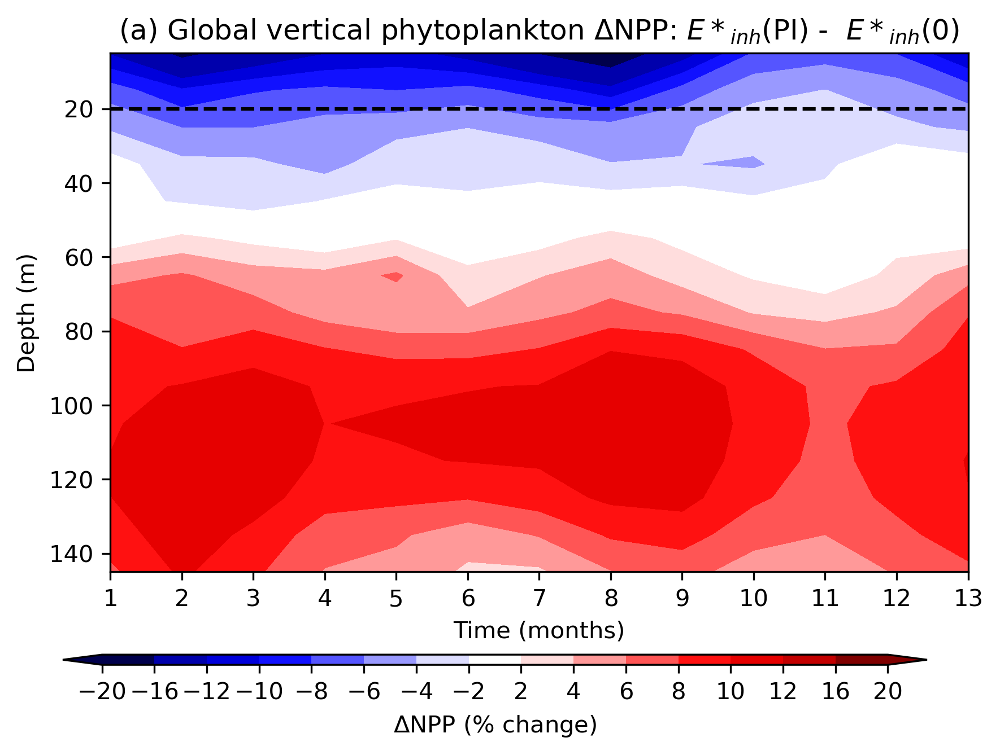

In [17]:

scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*365
scale_factor = 12*1e-2*1e-3 *86400
scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


# ORIGINAL
boundaries_diff=[-30,-20,-10,-5,-2,2,5,10,20,30]
colors_diff = get_colors('seismic',10,add_white=5)
cmap_diff = mpl.colors.ListedColormap(colors_diff, "")

# TRY TO REPLICAT NEW MAPS ?
boundaries_diff = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*2.0
colors_diff = get_colors('seismic',16,add_white=8)
cmap_diff = mpl.colors.ListedColormap(colors_diff, "")

time=np.linspace(1,len(data_climo2[case]),len(data_climo2[case]))
if True:
    # plot difference
    HALOGEN = np.array(data_climo2[EINH20X_DATM_CNL_4P2Z]) 
    REGULAR= np.array(data_climo2[EINHPI_DATM_CNL_4P2Z])
    diff = HALOGEN - REGULAR
    diff = diff * REGULAR**-1 * 100
    fig,ax = plt.subplots(1,1,figsize=(6,4))
    pc1 = ax.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax.set_title('(a) Global vertical phytoplankton $\Delta$NPP: $E*_{inh}$(halogen) -  $E*_{inh}$(PI)'); ax.set_ylabel('Depth (m)'); ax.set_xlabel('Time (months)')
    ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
    ax.axhline(20,linestyle='--',color='k')
    position = fig.add_axes([0.07,0.005,0.85,0.015])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal',norm=mpl.colors.BoundaryNorm(boundaries_diff,ncolors=len(boundaries_diff)-1,clip=False))
    cbar1.ax.tick_params(labelsize=9)
    cbar1.set_ticks(boundaries_diff)
    cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()
    plt.savefig('GMD24_figs/Figure5a.eps')
    plt.savefig('GMD24_figs/Figure5b.png')
    plt.show()


# !! note the below figures are not in the paper but replicate the above figure with the additional cases
'''
#boundaries_diff=np.array(np.linspace(-1,1,12))*0.01
boundaries_diff=[-30,-20,-10,-5,-2,2,5,10,20,30]
#cmap_seismic = plt.cm.get_cmap('seismic',len(boundaries))
colors_diff = get_colors('seismic',10,add_white=5)
#colors = list(cmap_seismic(np.arange(len(boundaries))))
cmap_diff = mpl.colors.ListedColormap(colors_diff, "")
'''
time=np.linspace(1,len(data_climo2[case]),len(data_climo2[case]))
if True:
    # plot difference
    HALOGEN = np.array(data_climo2[EINH20X_DATM_CNL_4P2Z]) 
    REGULAR= np.array(data_climo2[EINH0X_DATM_CNL_4P2Z])
    diff = HALOGEN - REGULAR
    diff = diff * REGULAR**-1 * 100
    fig,ax = plt.subplots(1,1,figsize=(6,4))
    pc1 = ax.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax.set_title('$E*_{inh}$(halogen) -  $E*_{inh}$(0)'); ax.set_ylabel('Depth (m)'); ax.set_xlabel('Time (months)')
    ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
    ax.axhline(20,linestyle='--',color='k')
    position = fig.add_axes([0.07,0.005,0.85,0.015])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal',norm=mpl.colors.BoundaryNorm(boundaries_diff,ncolors=len(boundaries_diff)-1,clip=False))
    cbar1.ax.tick_params(labelsize=10)
    cbar1.set_ticks(boundaries_diff)
    cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()
    #plt.savefig('GMD24_figs/Figure4_20x-0.eps')
    #plt.savefig('GMD24_figs/Figure4_20x0.png')
    plt.show()

time=np.linspace(1,len(data_climo2[case]),len(data_climo2[case]))
if True:
    # plot difference
    factor=0.5
    factor=1
    HALOGEN = np.array(data_climo2[EINHPI_DATM_CNL_4P2Z]) 
    ZERO= np.array(data_climo2[EINH0X_DATM_CNL_4P2Z])
    diff = HALOGEN - REGULAR
    diff = diff * REGULAR**-1 * 100
    fig,ax = plt.subplots(1,1,figsize=(6,4))
    pc1 = ax.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=np.array(boundaries_diff)*factor,extend='both')
    ax.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax.set_title('(a) Global vertical phytoplankton $\Delta$NPP: $E*_{inh}$(PI) -  $E*_{inh}$(0)'); ax.set_ylabel('Depth (m)'); ax.set_xlabel('Time (months)')
    ax.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','13'))
    ax.axhline(20,linestyle='--',color='k')
    position = fig.add_axes([0.07,0.005,0.85,0.015])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal',norm=mpl.colors.BoundaryNorm(np.array(boundaries_diff)*factor,ncolors=len(boundaries_diff)-1,clip=False))
    cbar1.ax.tick_params(labelsize=10)
    cbar1.set_ticks(np.array(boundaries_diff)*factor)
    cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()
    #plt.savefig('GMD24_figs/Figure4_20x-PI.eps')
    #plt.savefig('GMD24_figs/Figure4_20x-PI.png')
    plt.show()

    

In [468]:
CASES

['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI',
 'CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv',
 'CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv']

In [11]:
# get data
cesm_ds={}
for case in CASES: # cycle through cases as defined above 
  print(case)
  cesm_mon_ds=xr.open_mfdataset(files_h0[case][:],combine='nested',concat_dim='time')#,decode_times=False,decode_coords=False, concat_dim='time')
  coords = {'x':'TLONG','y':'TLAT'}
  keepthese=['z_t','z_t_150m','time_bound','TAREA','REGION_MASK']
  vars = ['photoC_TOT']
  keepthese = keepthese+vars
  keep_vars = keepthese +list(coords.values())+['dz','KMT']
  cesm_mon_ds = cesm_mon_ds.drop([v for v in cesm_mon_ds.variables if v not in keep_vars])
  cesm_ds[case] = pop_add_cyclic(cesm_mon_ds) 
  print('case done, moving on ...')


CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv




case done, moving on ...
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv




case done, moving on ...
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv




case done, moving on ...


/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/2291460245.py:34: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/2291460245.py:35: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/2291460245.py:44: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/2291460245.py:45: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/2291460245.py:47: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * (

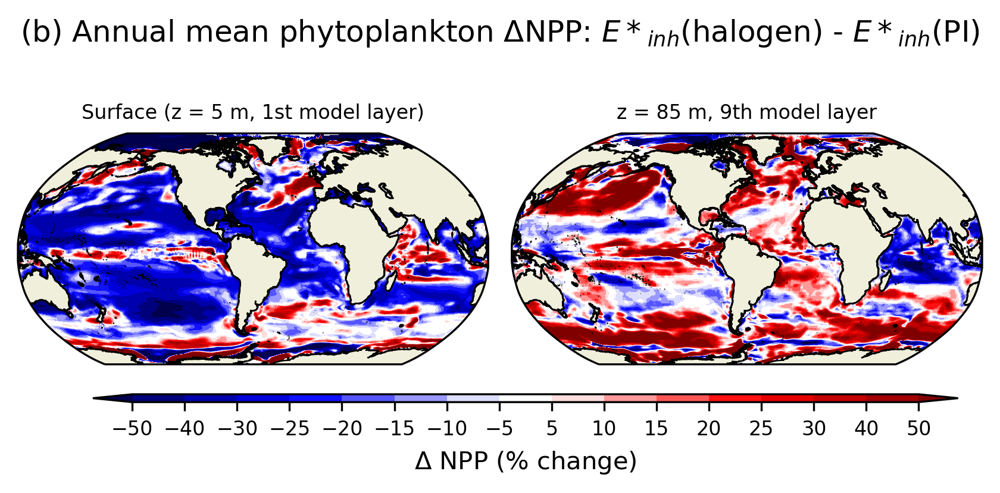

In [12]:
# show spatial distribution of phytoplankton productivity changes at different vertical levels

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.1
#boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.2
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*5
#boundaries=[-100,-80,-60,-40,-20,-10,10,20,40,60,80,100]

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2)= plt.subplots(1,2,figsize =(5.7,2.2),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean phytoplankton $\Delta$NPP: $E*_{inh}$(halogen) - $E*_{inh}$(PI)',y=1.0)

    var='photoC_TOT'
    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * (REGULAR**-1)*100;
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    #ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Surface (z = 5 m, 1st model layer)',fontsize=8)

    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * (REGULAR**-1)*100; #diff_both = np.subtract(diff1,diff2)
    
    pc1=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    #ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('z = 85 m, 9th model layer',fontsize=8)
    #ax2.set_title('z = 15 m, 2nd model layer',fontsize=8)
    
    
    position = fig.add_axes([0.10,0.02,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('GMD24_figs/Figure3c.eps')
    #plt.savefig('GMD24_figs/Figure3c.png')
    plt.subplots_adjust(wspace=0.05)
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/3131288870.py:34: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/3131288870.py:35: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/3131288870.py:44: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/3131288870.py:45: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/3131288870.py:47: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * (RE

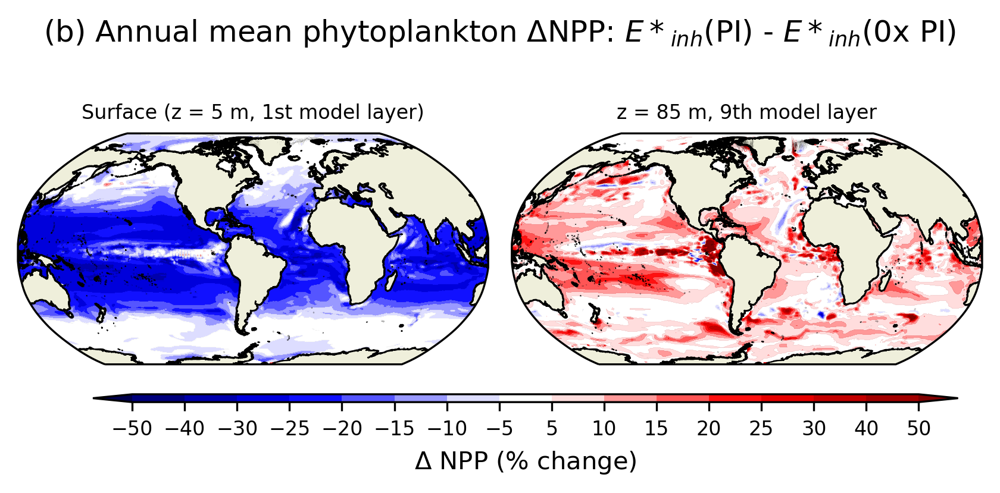

In [13]:
# show spatial distribution of phytoplankton productivity changes at different vertical levels

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.1
#boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.2
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*5
#boundaries=[-100,-80,-60,-40,-20,-10,10,20,40,60,80,100]

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2)= plt.subplots(1,2,figsize =(5.7,2.2),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean phytoplankton $\Delta$NPP: $E*_{inh}$(PI) - $E*_{inh}$(0x PI)',y=1.0)

    var='photoC_TOT'
    HALOGEN= np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * (REGULAR**-1)*100;
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Surface (z = 5 m, 1st model layer)',fontsize=8)

    HALOGEN= np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=8)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * (REGULAR**-1)*100; #diff_both = np.subtract(diff1,diff2)
    
    pc1=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('z = 85 m, 9th model layer',fontsize=8)
    #ax2.set_title('z = 15 m, 2nd model layer',fontsize=8)
    
    
    position = fig.add_axes([0.10,0.02,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('GMD24_figs/Figure3c.eps')
    #plt.savefig('GMD24_figs/Figure3c.png')
    plt.subplots_adjust(wspace=0.05)
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/1478349212.py:3: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/1478349212.py:4: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))


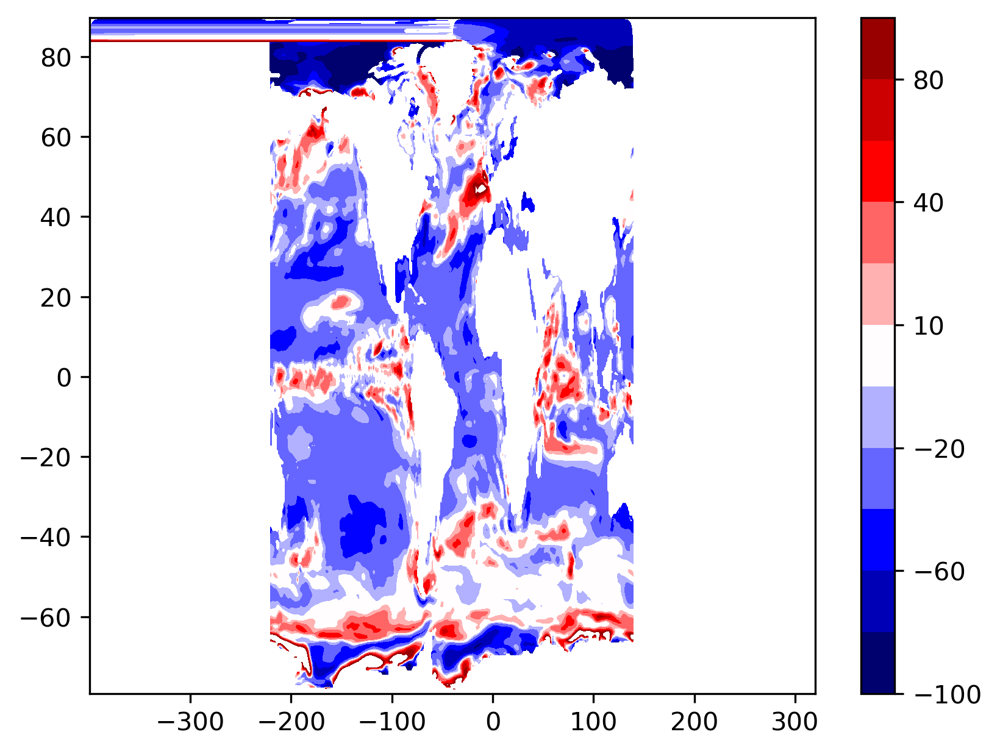

In [271]:
if True:
    var='photoC_TOT'
    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINHPI_DATM_CNL_4P2Z][var].isel(z_t_150m=0)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * (REGULAR**-1)*100;
    
np.nanmin(diff_both)

plt.figure()
plt.contourf(TLONG,TLAT,diff_both,levels=[-100,-80,-60,-40,-20,-10,10,20,40,60,80,100],cmap='seismic')
plt.colorbar()

/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2981876119.py:33: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=2)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2981876119.py:34: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=2)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2981876119.py:43: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=3)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2981876119.py:44: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=3)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/2981876119.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so

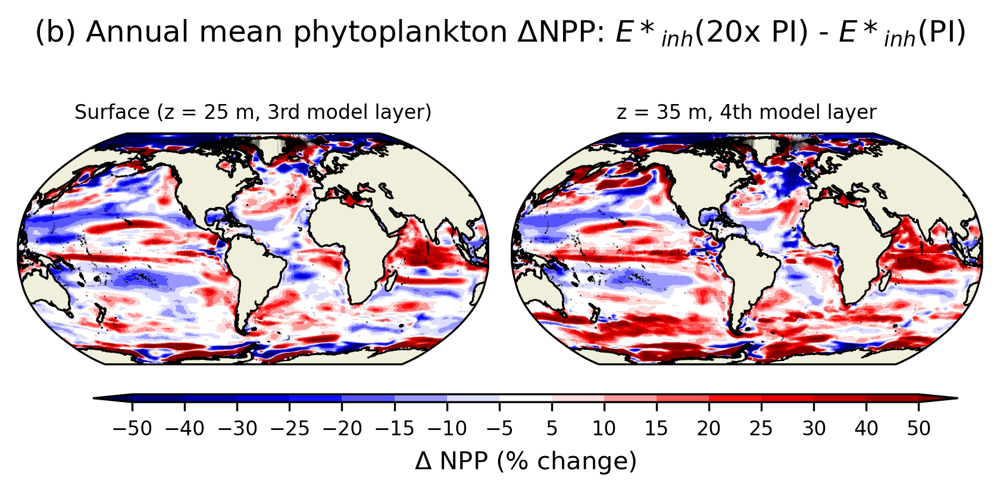

In [279]:
# show spatial distribution of phytoplankton productivity changes at different vertical levels

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.1
#boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.2
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*5

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2)= plt.subplots(1,2,figsize =(5.7,2.2),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean phytoplankton $\Delta$NPP: $E*_{inh}$(20x PI) - $E*_{inh}$(PI)',y=1.0)

    var='photoC_TOT'
    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=2)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=2)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100;
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Surface (z = 25 m, 3rd model layer)',fontsize=8)

    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=3)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=3)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
    
    pc1=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),transform_first=True,linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    #ax2.set_title('z = 35 m, 4th model layer',fontsize=8)
    ax2.set_title('z = 35 m, 4th model layer',fontsize=8)
    
    
    position = fig.add_axes([0.10,0.02,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('GMD24_figs/Figure3c.eps')
    #plt.savefig('GMD24_figs/Figure3c.png')
    plt.subplots_adjust(wspace=0.05)
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3441969053.py:33: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=4)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3441969053.py:34: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=4)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3441969053.py:43: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=5)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3441969053.py:44: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=5)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/3441969053.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so

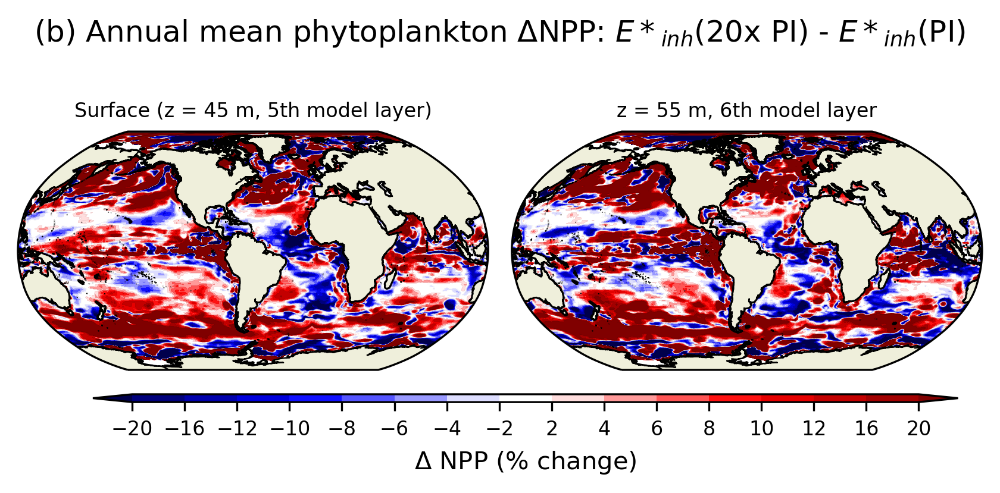

In [94]:
# show spatial distribution of phytoplankton productivity changes at different vertical levels

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.1
#boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.2
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*2

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2)= plt.subplots(1,2,figsize =(5.7,2.2),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean phytoplankton $\Delta$NPP: $E*_{inh}$(20x PI) - $E*_{inh}$(PI)',y=1.0)

    var='photoC_TOT'
    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=4)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=4)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100;
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Surface (z = 45 m, 5th model layer)',fontsize=8)

    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=5)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=5)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
    
    pc1=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    #ax2.set_title('z = 35 m, 4th model layer',fontsize=8)
    ax2.set_title('z = 55 m, 6th model layer',fontsize=8)
    
    
    position = fig.add_axes([0.10,0.02,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('GMD24_figs/Figure3c.eps')
    #plt.savefig('GMD24_figs/Figure3c.png')
    plt.subplots_adjust(wspace=0.05)
    plt.show()


/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/1439846304.py:33: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=6)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/1439846304.py:34: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=6)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/1439846304.py:43: RuntimeWarning: Mean of empty slice
  HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=7)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/1439846304.py:44: RuntimeWarning: Mean of empty slice
  REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=7)[:]*scale_factor,axis=0))
/glade/derecho/scratch/jcoupe/tmp/ipykernel_38414/1439846304.py:60: UserWarning: This figure includes Axes that are not compatible with tight_layout, so

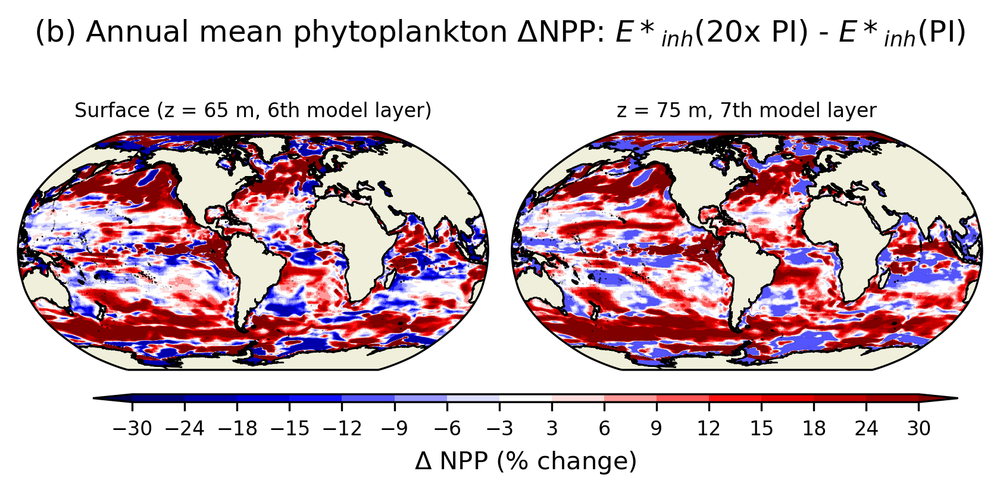

In [97]:
# show spatial distribution of phytoplankton productivity changes at different vertical levels

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 12*1e-2*1e-3 *86400
boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.1
#boundaries = np.array([-70,-60,-50,-40,-30,-20,-10,-5,5,10,20,30,40,50,60,70])*0.2
boundaries = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*3

colors_diff = get_colors('seismic',16,add_white=8)
cmap = mpl.colors.ListedColormap(colors_diff, "")
from cartopy.util import add_cyclic_point
if True: #EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2)= plt.subplots(1,2,figsize =(5.7,2.2),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-60))) 
    fig.suptitle('(b) Annual mean phytoplankton $\Delta$NPP: $E*_{inh}$(20x PI) - $E*_{inh}$(PI)',y=1.0)

    var='photoC_TOT'
    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=6)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=6)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100;
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Surface (z = 65 m, 6th model layer)',fontsize=8)

    HALOGEN= np.array(np.nanmean(cesm_ds[EINH20X_DATM_CNL_4P2Z][var].isel(z_t_150m=7)[:]*scale_factor,axis=0))
    REGULAR=np.array(np.nanmean(cesm_ds[EINH0X_DATM_CNL_4P2Z][var].isel(z_t_150m=7)[:]*scale_factor,axis=0))
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
    
    pc1=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    #ax2.set_title('z = 35 m, 4th model layer',fontsize=8)
    ax2.set_title('z = 75 m, 7th model layer',fontsize=8)
    
    
    position = fig.add_axes([0.10,0.02,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    #plt.savefig('GMD24_figs/Figure3c.eps')
    #plt.savefig('GMD24_figs/Figure3c.png')
    plt.subplots_adjust(wspace=0.05)
    plt.show()


In [18]:
# add a new separate figure for halogen injection simulation

# import statements and functions to use


def percent_anomaly(data,control):
   control_climo = np.nanmean(separate_by_month_arrays(control),axis=1)
   monthly_data = separate_by_month_arrays(data)
   percent_anom = []
   for yr in range(np.shape(monthly_data)[1]):
        for mo in range(np.shape(monthly_data)[0]):
          percent_anom.append( 100*(monthly_data[mo][yr] - control_climo[mo]) * (control_climo[mo]**-1))
   return percent_anom
    
def separate_by_month_arrays(dataset):
	k=0
	jan=[];feb=[];march=[];apr=[];may=[];jun=[];july=[];aug=[];sep=[];oc=[];nov=[];dec=[];
	while k <= (len(dataset)-12):
		jan.append((dataset[k]))
		feb.append((dataset[k+1]))
		march.append((dataset[k+2]))
		apr.append((dataset[k+3]))
		may.append((dataset[k+4]))
		jun.append((dataset[k+5]))
		july.append((dataset[k+6]))
		aug.append((dataset[k+7]))
		sep.append((dataset[k+8]))
		oc.append((dataset[k+9]))
		nov.append((dataset[k+10]))
		dec.append((dataset[k+11]))
		k = k+12;
	return [jan,feb,march,apr,may,jun,july,aug,sep,oc,nov,dec]

def monthly_anomaly(data,data_control,type='standard',NANDATA = False):
    monthly_data = separate_by_month_arrays(data)
    monthly_data_control = np.nanmean(separate_by_month_arrays(data_control),axis=1)
    new_data=[]
    if type == 'percent':
        return percent_anomaly(data,data_control)
    if type == 'standard':
        for yr in range(int(len(data)/12.0)):
            for mo in range(12):
                new_data.append(monthly_data[mo][yr] - monthly_data_control[mo])
        return new_data
    if type == 'sd':
        mdc_std = np.nanstd(separate_by_month_arrays(data_control),axis=1)
        for yr in range(int(len(data)/12.0)):
    	    for mo in range(12):
	          new_data.append( (monthly_data[mo][yr] - monthly_data_control[mo]) *(mdc_std[mo]**-1))
        return new_data




import glob as glob
import os
from collections import OrderedDict
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc4
import matplotlib.pyplot as plt
import matplotlib as mpl
from pylab import *; 
import cartopy
import cartopy.crs as ccrs
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300




In [22]:


OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 
files_h0={}


# replace cases with ye old cases


########### replace the above .... ############

OUTPUT_PATH='/glade/derecho/scratch/jcoupe/archive/' # Note this is a temporary location for output files - this will be moved to 
OUTPUT_PATH='/glade/campaign/univ/ucnn0026/UVphyto/COUPE25/'

REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'
REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

CASES=[REV_EINH0XPI_DATM_CNL04_4P2Z,REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV,REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV]

for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[:]


# these subsetting lines are important because E*inh(0x PI) now includes a longer spin-up
files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z] = files_h0[REV_EINH0XPI_DATM_CNL04_4P2Z][-60:]
files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]
files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV] = files_h0[REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV][-60:]





EINH0X_DATM_CNL_4P2Z=REV_EINH0XPI_DATM_CNL04_4P2Z
EINHPI_DATM_CNL_4P2Z=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
EINH20X_DATM_CNL_4P2Z=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV

CASES=[EINH0X_DATM_CNL_4P2Z,EINHPI_DATM_CNL_4P2Z,EINH20X_DATM_CNL_4P2Z]



In [23]:


var='photoC_TOT' # z_t_150m
VARS=['photoC_TOT','photoC_cocco','photoC_sp','photoC_diat']

extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
TAREA = extract.variables['TAREA'][:]*(100**-2)
z_t_150m = extract.variables['z_t_150m'][:]*(0.01)

if True:
 scale_factor=1
 #data={};
 for case in CASES:
     data[case]={}
     for var in VARS:
         data[case][var]=np.zeros((60,len(z_t_150m)))
         print(case, var)
     #if True:
         t=0
         for fi in files_h0[case][:]:
             extract = nc4.Dataset(fi,'r')
             tempdata = extract.variables[var][0]
             for lev in range(len(z_t_150m)):
                   data[case][var][t][lev] = np.average(tempdata[lev],weights=TAREA)
             t=t+1
                   #data[case][t][lev] = 1/(1+data[case][t][lev])
         #print(data[case])




CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv photoC_TOT
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv photoC_cocco
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv photoC_sp
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv photoC_diat
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv photoC_TOT
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv photoC_cocco
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv photoC_sp
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv photoC_diat
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv photoC_TOT
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv photoC_cocco
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv photoC_sp
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv photoC_diat


/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/2520037598.py:116: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()


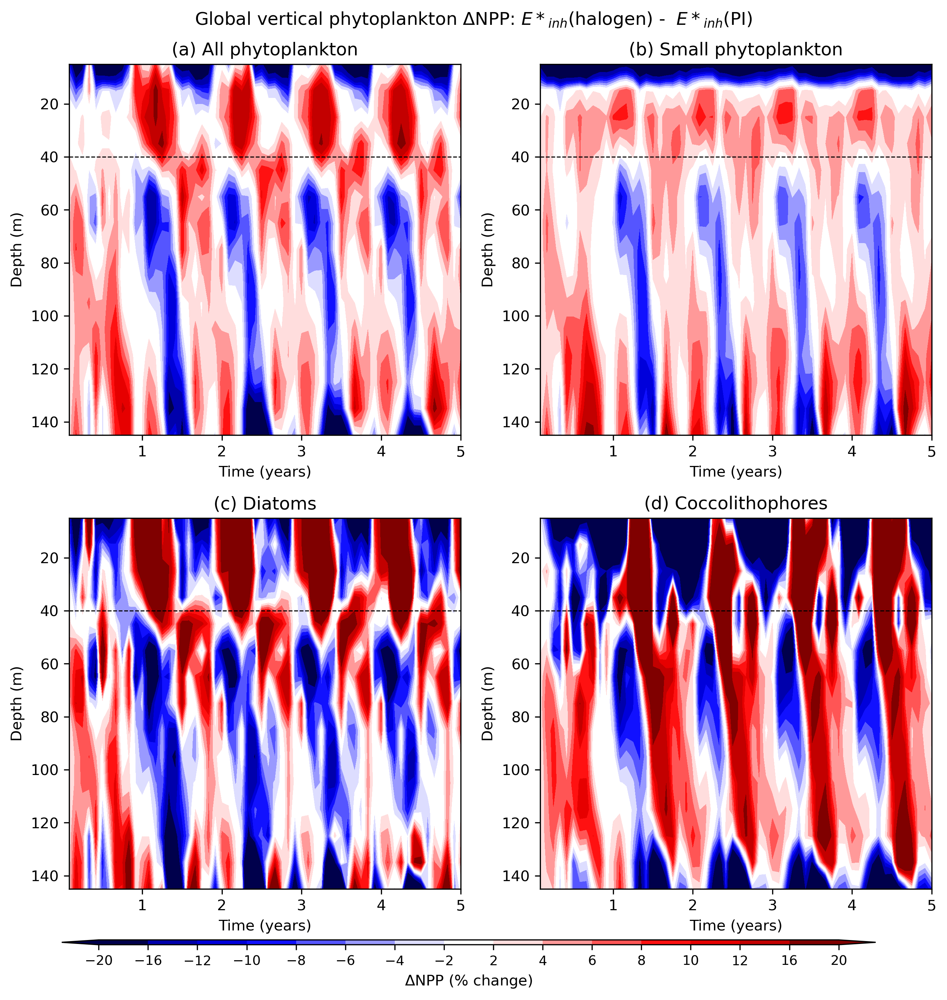

In [29]:
# make the plot:

scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


def get_difference(HALOGEN,REGULAR):
    HALOGEN = np.array(HALOGEN)  #REV_CASES = [REV_EINHPI_DATM_CNL00_4P2Z,REV_EINHPI_DATM_CNL01_4P2Z]
    REGULAR= np.array(REGULAR)
    diff = HALOGEN - REGULAR # NEW - OLD
    diff = diff * REGULAR**-1 * 100
    return diff
    
# ORIGINAL
boundaries_diff=[-30,-20,-10,-5,-2,2,5,10,20,30]
colors_diff = get_colors('seismic',10,add_white=5)
cmap_diff = mpl.colors.ListedColormap(colors_diff, "")

# TRY TO REPLICATE NEW MAPS ?
boundaries_diff = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*2.0
colors_diff = get_colors('seismic',16,add_white=8)
cmap_diff = mpl.colors.ListedColormap(colors_diff, "")

fig = plt.figure(figsize=(9,9),facecolor='white')
gs = fig.add_gridspec(2, 2)

time=np.linspace(1,len(data[case][var]),len(data[case][var]))
if True:

    fig.suptitle('Global vertical phytoplankton $\Delta$NPP: $E*_{inh}$(halogen) -  $E*_{inh}$(PI)')
    #fig.suptitle('Global vertical phytoplankton $\Delta$NPP: $E*_{inh}$(halogen) -  $E*_{inh}$(PI) CNL05 PICPOC06 CO$_2$=284 ppm')

    var='photoC_TOT' #CASES=[REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z,REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z,REV_EINH0XPI_DATM_CNL04_4P2Z]
    '''
    
    REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI'
    REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
    REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'
    '''
    PERTURBED_CASE=REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV
    BASELINE_CASE=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV #REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z
    
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var]) # EINH PULSE - NO UV 
    time=np.linspace(1,len(diff),len(diff))
    ax1=fig.add_subplot(gs[0,0])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc1 = ax1.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax1.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax1.set_title('(a) All phytoplankton'); ax1.set_ylabel('Depth (m)'); 
    if False:
        ax1.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax1.set_xlabel('Time (months)')
    if True:
        ax1.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax1.set_xlabel('Time (years)')
    ax1.axhline(40,linestyle='--',color='k',linewidth=0.7)

    var='photoC_sp'
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var])
    time=np.linspace(1,len(diff),len(diff))
    ax2=fig.add_subplot(gs[0,1])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc2 = ax2.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax2.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax2.set_title('(b) Small phytoplankton'); ax2.set_ylabel('Depth (m)'); 
    if False:
        ax2.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax2.set_xlabel('Time (months)')
    if True:
        ax2.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax2.set_xlabel('Time (years)')
    ax2.axhline(40,linestyle='--',color='k',linewidth=0.7)

    var='photoC_diat'
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var])
    time=np.linspace(1,len(diff),len(diff))
    ax3=fig.add_subplot(gs[1,0])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc3 = ax3.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax3.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax3.set_title('(c) Diatoms'); ax3.set_ylabel('Depth (m)'); 
    if False:
        ax3.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax3.set_xlabel('Time (months)')
    if True:
        ax3.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax3.set_xlabel('Time (years)')
    ax3.axhline(40,linestyle='--',color='k',linewidth=0.7)
    
    var='photoC_cocco'
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var])
    time=np.linspace(1,len(diff),len(diff))
    ax4=fig.add_subplot(gs[1,1])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc4 = ax4.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax4.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax4.set_title('(d) Coccolithophores'); ax4.set_ylabel('Depth (m)'); ax4.set_xlabel('Time (months)')
    if False:
        ax4.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax4.set_xlabel('Time (months)')
    if True:
        ax4.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax4.set_xlabel('Time (years)')
    ax4.axhline(40,linestyle='--',color='k',linewidth=0.7)

    position = fig.add_axes([0.07,0.005,0.85,0.005])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal',norm=mpl.colors.BoundaryNorm(boundaries_diff,ncolors=len(boundaries_diff)-1,clip=False))
    cbar1.ax.tick_params(labelsize=9)
    cbar1.set_ticks(boundaries_diff)
    cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()
    plt.show()
    

/glade/derecho/scratch/jcoupe/tmp/ipykernel_14085/2142880227.py:118: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()


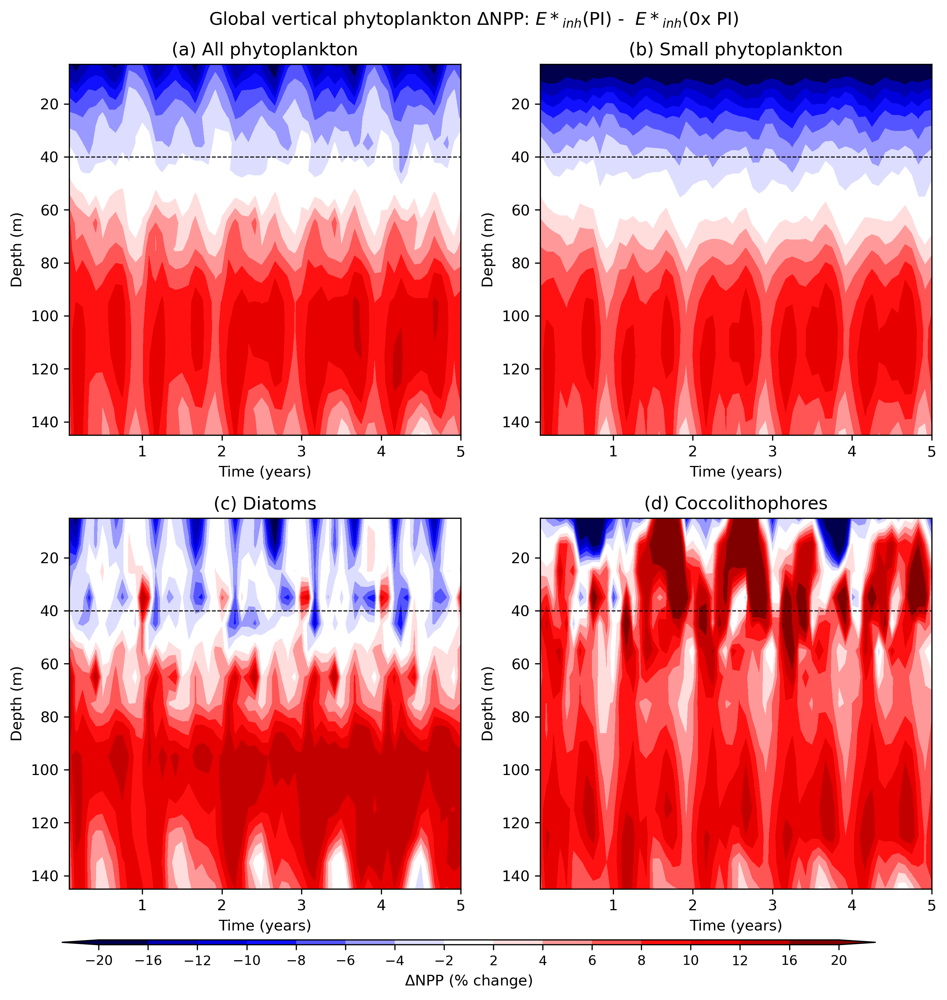

In [30]:
# replicate the above but e*inh(0xpi) and e*inh(pi)

# make the plot:

scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors


def get_difference(HALOGEN,REGULAR):
    HALOGEN = np.array(HALOGEN)  #REV_CASES = [REV_EINHPI_DATM_CNL00_4P2Z,REV_EINHPI_DATM_CNL01_4P2Z]
    REGULAR= np.array(REGULAR)
    diff = HALOGEN - REGULAR # NEW - OLD
    diff = diff * REGULAR**-1 * 100
    return diff
    
# ORIGINAL
boundaries_diff=[-30,-20,-10,-5,-2,2,5,10,20,30]
colors_diff = get_colors('seismic',10,add_white=5)
cmap_diff = mpl.colors.ListedColormap(colors_diff, "")

# TRY TO REPLICATE NEW MAPS ?
boundaries_diff = np.array([-10,-8,-6,-5,-4,-3,-2,-1,1,2,3,4,5,6,8,10])*2.0
colors_diff = get_colors('seismic',16,add_white=8)
cmap_diff = mpl.colors.ListedColormap(colors_diff, "")

fig = plt.figure(figsize=(9,9),facecolor='white')
gs = fig.add_gridspec(2, 2)

time=np.linspace(1,len(data[case][var]),len(data[case][var]))
if True:

    fig.suptitle('Global vertical phytoplankton $\Delta$NPP: $E*_{inh}$(PI) -  $E*_{inh}$(0x PI)')
    #fig.suptitle('Global vertical phytoplankton $\Delta$NPP: $E*_{inh}$(halogen) -  $E*_{inh}$(PI) CNL05 PICPOC06 CO$_2$=284 ppm')

    var='photoC_TOT' #CASES=[REV_EINHPULSEv01_DATM_CNL04_PICPOC06_4P2Z,REV_EINHPI_DATM_CNL04_PICPOC06_4P2Z,REV_EINH0XPI_DATM_CNL04_4P2Z]
    '''
    
    REV_EINH0XPI_DATM_CNL04_4P2Z='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC03_Einh0xPI'
    REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
    REV_EINHPULSEv01YR1YR2_DATM_CNL05_PICPOC06_4P2Z_FV='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'
    '''
    PERTURBED_CASE=REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z_FV
    BASELINE_CASE=REV_EINH0XPI_DATM_CNL04_4P2Z #REV_EINHPI_DATM_CNL05_PICPOC06_4P2Z
    
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var]) # EINH PULSE - NO UV 
    time=np.linspace(1,len(diff),len(diff))
    ax1=fig.add_subplot(gs[0,0])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc1 = ax1.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax1.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax1.set_title('(a) All phytoplankton'); ax1.set_ylabel('Depth (m)'); 
    if False:
        ax1.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax1.set_xlabel('Time (months)')
    if True:
        ax1.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax1.set_xlabel('Time (years)')
    ax1.axhline(40,linestyle='--',color='k',linewidth=0.7)

    var='photoC_sp'
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var])
    time=np.linspace(1,len(diff),len(diff))
    ax2=fig.add_subplot(gs[0,1])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc2 = ax2.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax2.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax2.set_title('(b) Small phytoplankton'); ax2.set_ylabel('Depth (m)'); 
    if False:
        ax2.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax2.set_xlabel('Time (months)')
    if True:
        ax2.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax2.set_xlabel('Time (years)')
    ax2.axhline(40,linestyle='--',color='k',linewidth=0.7)

    var='photoC_diat'
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var])
    time=np.linspace(1,len(diff),len(diff))
    ax3=fig.add_subplot(gs[1,0])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc3 = ax3.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax3.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax3.set_title('(c) Diatoms'); ax3.set_ylabel('Depth (m)'); 
    if False:
        ax3.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax3.set_xlabel('Time (months)')
    if True:
        ax3.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax3.set_xlabel('Time (years)')
    ax3.axhline(40,linestyle='--',color='k',linewidth=0.7)
    
    var='photoC_cocco'
    diff = get_difference(data[PERTURBED_CASE][var],data[BASELINE_CASE][var])
    time=np.linspace(1,len(diff),len(diff))
    ax4=fig.add_subplot(gs[1,1])#,facecolor='darkgrey',projection=ccrs.Robinson(central_longitude=-60))
    pc4 = ax4.contourf(time,z_t_150m,diff.T,cmap=cmap_diff,levels=boundaries_diff,extend='both')
    ax4.set_ylim((z_t_150m[-1],z_t_150m[0]))
    ax4.set_title('(d) Coccolithophores'); ax4.set_ylabel('Depth (m)'); ax4.set_xlabel('Time (months)')
    if False:
        ax4.set_xticks([1,2,3,4,5,6,7,8,9,10,11,12,13],('1','2','3','4','5','6','7','8','9','10','11','12','1'))
        ax4.set_xlabel('Time (months)')
    if True:
        ax4.set_xticks([12,24,36,48,60],('1','2','3','4','5'))
        ax4.set_xlabel('Time (years)')
    ax4.axhline(40,linestyle='--',color='k',linewidth=0.7)

    position = fig.add_axes([0.07,0.005,0.85,0.005])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal',norm=mpl.colors.BoundaryNorm(boundaries_diff,ncolors=len(boundaries_diff)-1,clip=False))
    cbar1.ax.tick_params(labelsize=9)
    cbar1.set_ticks(boundaries_diff)
    cbar1.set_label('$\Delta$NPP (% change)'); fig.tight_layout()
    plt.show()
    

In [2]:
# biome analysis of ye old 



def pop_add_cyclic(ds): # pass an xarray object into this
    nj = ds.TLAT.shape[0] # size of POP grid
    ni = ds.TLONG.shape[1]
    xL = int(ni/2 - 1)
    xR = int(xL + ni)
    tlon = ds.TLONG.data
    tlat = ds.TLAT.data
    tlon = np.where(np.greater_equal(tlon, min(tlon[:,0])), tlon-360., tlon) #make monotoncially increasing
    lon  = np.concatenate((tlon, tlon + 360.), 1) # concatenate to make larger array
    lon = lon[:, xL:xR] #restrict to middle rane
    if ni == 320: # this is the x1 POP grid
        print('\n')
    lon = lon - 360.
    lon = np.hstack((lon, lon[:, 0:1] + 360.)) # add in cyclic point
    if ni == 320:
        print('\n')
    #-- periodicity
    lat = np.concatenate((tlat, tlat), 1)
    lat = lat[:, xL:xR]
    lat = np.hstack((lat, lat[:,0:1]))
    TLAT = xr.DataArray(lat, dims=('nlat', 'nlon'))
    TLONG = xr.DataArray(lon, dims=('nlat', 'nlon'))
    dso = xr.Dataset({'TLAT': TLAT, 'TLONG': TLONG})
    # copy vars
    varlist = [v for v in ds.data_vars if v not in ['TLAT', 'TLONG']]
    for v in varlist:
        v_dims = ds[v].dims
        if not ('nlat' in v_dims and 'nlon' in v_dims):
            dso[v] = ds[v]
        else:
            # determine and sort other dimensions
            other_dims = set(v_dims) - {'nlat', 'nlon'}
            other_dims = tuple([d for d in v_dims if d in other_dims])
            lon_dim = ds[v].dims.index('nlon')
            field = ds[v].data
            field = np.concatenate((field, field), lon_dim)
            field = field[..., :, xL:xR]
            field = np.concatenate((field, field[..., :, 0:1]), lon_dim)       
            dso[v] = xr.DataArray(field, dims=other_dims+('nlat', 'nlon'), 
                                  attrs=ds[v].attrs)
    # copy coords
    for v, da in ds.coords.items():
        if not ('nlat' in da.dims and 'nlon' in da.dims):
            dso = dso.assign_coords(**{v: da})     
    return dso



In [3]:

################
OUTPUT_PATH='/glade/campaign/univ/ucnn0026/UVphyto/COUPE25/'

OUTPUT_PATH='/glade/campaign/univ/ucnn0026/UVphyto/COUPE25/'
files_h0={}
REV_EINH0XPI_284PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'
REV_EINHPI_284PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPULSEv01YR1YR2_284PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPULSEv01YR1YR2_284ppm_fv'

REV_EINH0XPI_400PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_400ppm'
REV_EINHPI_400PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_400ppm_fv'

REV_EINH0XPI_600PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_600ppm_fv'
REV_EINHPI_600PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_600ppm_fv'

REV_EINH0XPI_700PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_700ppm_fv'
REV_EINHPI_700PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_700ppm_fv'

REV_EINH0XPI_900PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'
REV_EINHPI_9000PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'


CASES=[]
CASES.append(REV_EINH0XPI_284PPM)
CASES.append(REV_EINHPI_284PPM)
#CASES.append(REV_EINHPULSEv01YR1YR2_284PPM)
CASES.append(REV_EINH0XPI_400PPM)
CASES.append(REV_EINHPI_400PPM)
CASES.append(REV_EINH0XPI_600PPM)
CASES.append(REV_EINHPI_600PPM)
CASES.append(REV_EINH0XPI_700PPM)
CASES.append(REV_EINHPI_700PPM)
CASES.append(REV_EINH0XPI_900PPM)
CASES.append(REV_EINHPI_9000PPM)


for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[-60:]



In [ ]:
# create biome based map with total NPP and cocco NPP
extract=nc4.Dataset('/glade/work/jcoupe/misc_files/fay_biomes_POP.nc','r')
meanMask = extract.variables['fay_biomes'][:].T

CASES=[REV_EINH0XPI_284PPM,REV_EINHPI_284PPM] # cases with picpoc scaling turned on and co2 set to 284 ppm
cesm_ds={}
for case in CASES: # cycle through cases as defined above 
  cesm_mon_ds=xr.open_mfdataset(files_h0[case][:],combine='nested',concat_dim='time')#,decode_times=False,decode_coords=False, concat_dim='time')
  coords = {'x':'TLONG','y':'TLAT'}
  keepthese=['z_t','z_t_150m','time_bound','TAREA','REGION_MASK']
  vars = ['photoC_diat_zint','photoC_diaz_zint','photoC_sp_zint','photoC_cocco_zint','photoC_TOT_zint']
  keepthese = keepthese+vars
  keep_vars = keepthese +list(coords.values())+['dz','KMT']
  cesm_mon_ds = cesm_mon_ds.drop([v for v in cesm_mon_ds.variables if v not in keep_vars])
  covered = np.zeros((384,320))
  # filter out for biomes here, before we pop_addcyclic? 
  #cesm_mon_ds[var] = cesm_mon_ds[var]
  for var in vars:
      for BIOME_NUMBER in range(1,18): # biomes 1 to 17
          print(BIOME_NUMBER)
          TAREA_biome = np.array(cesm_mon_ds['TAREA'][0]*(100**-2)) # meters squared
          TAREA_biome[meanMask!=BIOME_NUMBER] = 0
          covered[meanMask!=BIOME_NUMBER] = 1 # 1 means this gridpoint has been covered, 0 means not. becomes reelvant at teh end.
          TOT_AREA = np.nansum(TAREA_biome)
          mo_avg_var=[] # for temp use in loop, will average together after loop
          t=0
          for yr in range(5): #0,1,2,3,4
           for mo in range(12): #0,1,2,3,4,5,6,7,8,9,10,11
              temp=np.nansum(cesm_mon_ds[var][t].values*(TAREA_biome*TOT_AREA**-1)) # this is total sum of NPP globally, I guess 
              #mo_avg_var.append(np.average(np.array(cesm_mon_ds[var][t].values),weights=TAREA_biome))
              mo_avg_var.append(temp)
              t=t+1 # lol we're hacking this I guess?
              #print(mo_avg_var[-1])
          annual_avg_var = np.nanmean(mo_avg_var) # should be dimension (12) --> (1) # time average value 
          # now assign annual_avg_var everywhere that cesm_mon_ds[var] is a certain value
          temp = cesm_mon_ds[var][0].values
          temp[meanMask==BIOME_NUMBER] = annual_avg_var #assign places within the BIOME the annual_avg_var !!
          cesm_mon_ds[var][0] = temp #replace first time step ?
      temp = cesm_mon_ds[var][0].values
      temp[covered==0]= 0.0 # set anything not covered by the biome map to 0.0 
      temp[np.isnan(meanMask)]=0.0 # zero out anything not on the grid
      cesm_mon_ds[var][0]=temp
      cesm_ds[case] = pop_add_cyclic(cesm_mon_ds) #pop_add_cyclic after all of this is over 


/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/2102387994.py:34: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/2102387994.py:34: RuntimeWarning: invalid value encountered in multiply
  diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/2102387994.py:47: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * REGULAR**-1*100
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/2102387994.py:47: RuntimeWarning: invalid value encountered in multiply
  diff_both = diff_both * REGULAR**-1*100
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/2102387994.py:58: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * REGULAR**-1*100
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/2102387994.py:58: RuntimeWarning: invalid v

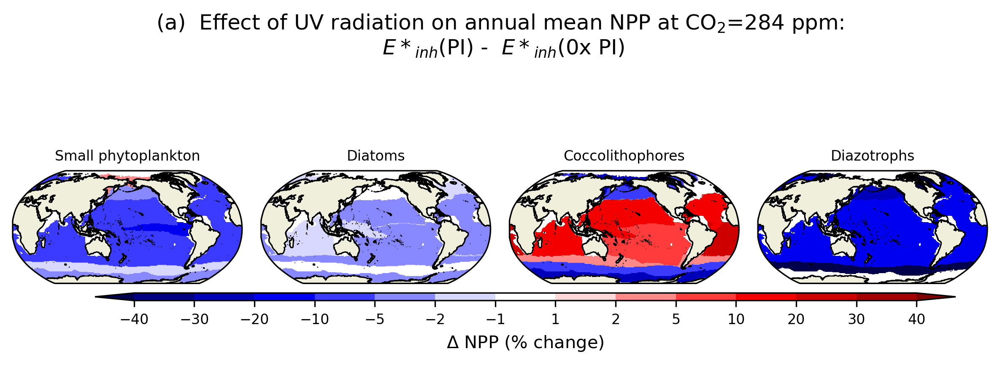

In [6]:

def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors

scale_factor = 12*1e-2*1e-3 *86400
boundaries=np.array(np.linspace(0,12,12))*10
boundaries = np.array([-40,-30,-20,-10,-5,-2,-1,1,2,5,10,20,30,40])


colors_diff = get_colors('seismic',14,add_white=7)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365
scale_factor=1
from cartopy.util import add_cyclic_point
if True: #[REV_EINH0XPI_284PPM,REV_EINHPI_284PPM]
    var='photoC_sp_zint'
    HALOGEN = np.array(cesm_ds[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
    TLONG = cesm_ds[CASES[0]]['TLONG']; TLAT = cesm_ds[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(8,3),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-180))) 
    fig.suptitle('(a)  Effect of UV radiation on annual mean NPP at CO$_2$=284 ppm:\n $E*_{inh}$(PI) -  $E*_{inh}$(0x PI)')
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    HALOGEN = np.array(cesm_ds[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)

    
    var='photoC_cocco_zint'
    HALOGEN = np.array(cesm_ds[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    HALOGEN = np.array(cesm_ds[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); 
    #plt.savefig('GMD24_figs/Figure8a.eps')
    #plt.savefig('GMD24_figs/Figure8a.png')
    plt.show()

    #### NEW PLOT IDEA: SHOW ACTUAL NPP OF PI AND SHOW ANOMALY IN E*INH PI !!!!! ( DELTA OF HALOGEN - PI % CHANGE )
    

In [5]:
CASES=[]


OUTPUT_PATH='/glade/campaign/univ/ucnn0026/UVphyto/COUPE25/'
files_h0={}
REV_EINH0XPI_284PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'
REV_EINH0XPI_900PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'

REV_EINHPI_284PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPI_900PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_EinhPI_900ppm'


CASES.append(REV_EINH0XPI_284PPM)
CASES.append(REV_EINH0XPI_900PPM)
#CASES.append(REV_EINHPI_284PPM)
#CASES.append(REV_EINHPI_900PPM)

#REV_EINH0XPI_900PPM - REV_EINH0XPI_284PPM



for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[-60:]





In [8]:
# create biome based map with total NPP and cocco NPP
extract=nc4.Dataset('/glade/work/jcoupe/misc_files/fay_biomes_POP.nc','r')
meanMask = extract.variables['fay_biomes'][:].T


cesm_ds2={}
for case in CASES: # cycle through cases as defined above 
  cesm_mon_ds=xr.open_mfdataset(files_h0[case][:],combine='nested',concat_dim='time')#,decode_times=False,decode_coords=False, concat_dim='time')
  coords = {'x':'TLONG','y':'TLAT'}
  keepthese=['z_t','z_t_150m','time_bound','TAREA','REGION_MASK']
  vars = ['photoC_diat_zint','photoC_diaz_zint','photoC_sp_zint','photoC_cocco_zint','photoC_TOT_zint']
  keepthese = keepthese+vars
  keep_vars = keepthese +list(coords.values())+['dz','KMT']
  cesm_mon_ds = cesm_mon_ds.drop([v for v in cesm_mon_ds.variables if v not in keep_vars])
  covered = np.zeros((384,320))
  # filter out for biomes here, before we pop_addcyclic? 
  #cesm_mon_ds[var] = cesm_mon_ds[var]
  for var in vars:
      for BIOME_NUMBER in range(1,18): # biomes 1 to 17
          print(BIOME_NUMBER)
          TAREA_biome = np.array(cesm_mon_ds['TAREA'][0]*(100**-2)) # meters squared
          TAREA_biome[meanMask!=BIOME_NUMBER] = 0
          covered[meanMask!=BIOME_NUMBER] = 1 # 1 means this gridpoint has been covered, 0 means not. becomes reelvant at teh end.
          TOT_AREA = np.nansum(TAREA_biome)
          mo_avg_var=[] # for temp use in loop, will average together after loop
          t=0
          for yr in range(5): #0,1,2,3,4
           for mo in range(12): #0,1,2,3,4,5,6,7,8,9,10,11
              temp=np.nansum(cesm_mon_ds[var][t].values*(TAREA_biome*TOT_AREA**-1)) # this is total sum of NPP globally, I guess 
              #mo_avg_var.append(np.average(np.array(cesm_mon_ds[var][t].values),weights=TAREA_biome))
              mo_avg_var.append(temp)
              t=t+1 # lol we're hacking this I guess?
              #print(mo_avg_var[-1])
          annual_avg_var = np.nanmean(mo_avg_var) # should be dimension (12) --> (1) # time average value 
          # now assign annual_avg_var everywhere that cesm_mon_ds[var] is a certain value
          temp = cesm_mon_ds[var][0].values
          temp[meanMask==BIOME_NUMBER] = annual_avg_var #assign places within the BIOME the annual_avg_var !!
          cesm_mon_ds[var][0] = temp #replace first time step ?
      temp = cesm_mon_ds[var][0].values
      temp[covered==0]= 0.0 # set anything not covered by the biome map to 0.0 
      temp[np.isnan(meanMask)]=0.0 # zero out anything not on the grid
      cesm_mon_ds[var][0]=temp
      cesm_ds2[case] = pop_add_cyclic(cesm_mon_ds) #pop_add_cyclic after all of this is over 


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17




1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17






/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/1882287316.py:41: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/1882287316.py:41: RuntimeWarning: invalid value encountered in multiply
  diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/1882287316.py:54: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * REGULAR**-1*100
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/1882287316.py:54: RuntimeWarning: invalid value encountered in multiply
  diff_both = diff_both * REGULAR**-1*100
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/1882287316.py:65: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both = diff_both * REGULAR**-1*100
/glade/derecho/scratch/jcoupe/tmp/ipykernel_24490/1882287316.py:65: RuntimeWarning: invalid v

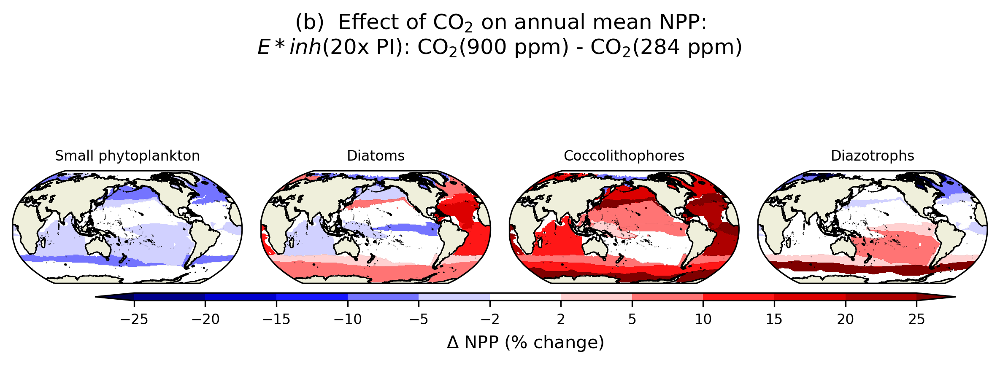

In [9]:
# show effect of co2 on biomes

# uses: cases both have pic/poc scaling but different co2


def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors

scale_factor = 12*1e-2*1e-3 *86400
boundaries=np.array(np.linspace(0,12,12))*10
boundaries = np.array([-25,-20,-15,-10,-5,-2,2,5,10,15,20,25])


colors_diff = get_colors('seismic',12,add_white=6)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365

from cartopy.util import add_cyclic_point
if True: #  #REV_EINH0XPI_900PPM - REV_EINH0XPI_284PPM


    var='photoC_sp_zint'
    HALOGEN = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100; #diff_both = np.subtract(diff1,diff2)

    TLONG = cesm_ds2[CASES[0]]['TLONG']; TLAT = cesm_ds2[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(8,3),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-180))) 
    fig.suptitle('(b)  Effect of CO$_2$ on annual mean NPP:\n$E*{inh}$(0x PI): CO$_2$(900 ppm) - CO$_2$(284 ppm) ')
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    HALOGEN = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)

    
    var='photoC_cocco_zint'
    HALOGEN = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    HALOGEN = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    REGULAR = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN-REGULAR
    diff_both = diff_both * REGULAR**-1*100
    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); plt.show()

    #### NEW PLOT IDEA: SHOW ACTUAL NPP OF PI AND SHOW ANOMALY IN E*INH PI !!!!! ( DELTA OF HALOGEN - PI % CHANGE )
    

In [6]:
CASES=[]


OUTPUT_PATH='/glade/campaign/univ/ucnn0026/UVphyto/COUPE25/'
files_h0={}
REV_EINH0XPI_284PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'
REV_EINH0XPI_900PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'

REV_EINHPI_284PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'
REV_EINHPI_900PPM='CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'


CASES.append(REV_EINH0XPI_284PPM)
CASES.append(REV_EINH0XPI_900PPM)
CASES.append(REV_EINHPI_284PPM)
CASES.append(REV_EINHPI_900PPM)

#REV_EINH0XPI_900PPM - REV_EINH0XPI_284PPM



for case in CASES:
    files_h0[case]=sorted(glob.glob(OUTPUT_PATH+case+'/ocn/hist/'+case+'.pop.h.0*.nc'))[-60:]



In [ ]:
# create biome based map with total NPP and cocco NPP
extract=nc4.Dataset('/glade/work/jcoupe/misc_files/fay_biomes_POP.nc','r')
meanMask = extract.variables['fay_biomes'][:].T


cesm_ds2={}
for case in [REV_EINHPI_900PPM]: # cycle through cases as defined above 
  print(case)
  cesm_mon_ds=xr.open_mfdataset(files_h0[case][:],combine='nested',concat_dim='time')#,decode_times=False,decode_coords=False, concat_dim='time')
  coords = {'x':'TLONG','y':'TLAT'}
  keepthese=['z_t','z_t_150m','time_bound','TAREA','REGION_MASK']
  vars = ['photoC_diat_zint','photoC_diaz_zint','photoC_sp_zint','photoC_cocco_zint','photoC_TOT_zint']
  keepthese = keepthese+vars
  keep_vars = keepthese +list(coords.values())+['dz','KMT']
  cesm_mon_ds = cesm_mon_ds.drop([v for v in cesm_mon_ds.variables if v not in keep_vars])
  covered = np.zeros((384,320))
  # filter out for biomes here, before we pop_addcyclic? 
  #cesm_mon_ds[var] = cesm_mon_ds[var]
  for var in vars:
      for BIOME_NUMBER in range(1,18): # biomes 1 to 17
          print(BIOME_NUMBER)
          TAREA_biome = np.array(cesm_mon_ds['TAREA'][0]*(100**-2)) # meters squared
          TAREA_biome[meanMask!=BIOME_NUMBER] = 0
          covered[meanMask!=BIOME_NUMBER] = 1 # 1 means this gridpoint has been covered, 0 means not. becomes reelvant at teh end.
          TOT_AREA = np.nansum(TAREA_biome)
          mo_avg_var=[] # for temp use in loop, will average together after loop
          t=0
          for yr in range(5): #0,1,2,3,4
           for mo in range(12): #0,1,2,3,4,5,6,7,8,9,10,11
              temp=np.nansum(cesm_mon_ds[var][t].values*(TAREA_biome*TOT_AREA**-1)) # this is total sum of NPP globally, I guess 
              #mo_avg_var.append(np.average(np.array(cesm_mon_ds[var][t].values),weights=TAREA_biome))
              mo_avg_var.append(temp)
              t=t+1 # lol we're hacking this I guess?
              #print(mo_avg_var[-1])
          annual_avg_var = np.nanmean(mo_avg_var) # should be dimension (12) --> (1) # time average value 
          # now assign annual_avg_var everywhere that cesm_mon_ds[var] is a certain value
          temp = cesm_mon_ds[var][0].values
          temp[meanMask==BIOME_NUMBER] = annual_avg_var #assign places within the BIOME the annual_avg_var !!
          cesm_mon_ds[var][0] = temp #replace first time step ?
      temp = cesm_mon_ds[var][0].values
      temp[covered==0]= 0.0 # set anything not covered by the biome map to 0.0 
      temp[np.isnan(meanMask)]=0.0 # zero out anything not on the grid
      cesm_mon_ds[var][0]=temp
      cesm_ds2[case] = pop_add_cyclic(cesm_mon_ds) #pop_add_cyclic after all of this is over 
  print('case done')


/glade/derecho/scratch/jcoupe/tmp/ipykernel_53580/2954176714.py:42: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both_284PPM = diff_both * REGULAR_284PPM**-1*100;
/glade/derecho/scratch/jcoupe/tmp/ipykernel_53580/2954176714.py:42: RuntimeWarning: invalid value encountered in multiply
  diff_both_284PPM = diff_both * REGULAR_284PPM**-1*100;
/glade/derecho/scratch/jcoupe/tmp/ipykernel_53580/2954176714.py:47: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both_900PPM = diff_both * REGULAR_900PPM**-1*100;
/glade/derecho/scratch/jcoupe/tmp/ipykernel_53580/2954176714.py:47: RuntimeWarning: invalid value encountered in multiply
  diff_both_900PPM = diff_both * REGULAR_900PPM**-1*100;
/glade/derecho/scratch/jcoupe/tmp/ipykernel_53580/2954176714.py:63: RuntimeWarning: divide by zero encountered in reciprocal
  diff_both_284PPM = diff_both * REGULAR_284PPM**-1*100;
/glade/derecho/scratch/jcoupe/tmp/ipykernel_53580/2954176714.py:63: RuntimeWarning: invalid valu

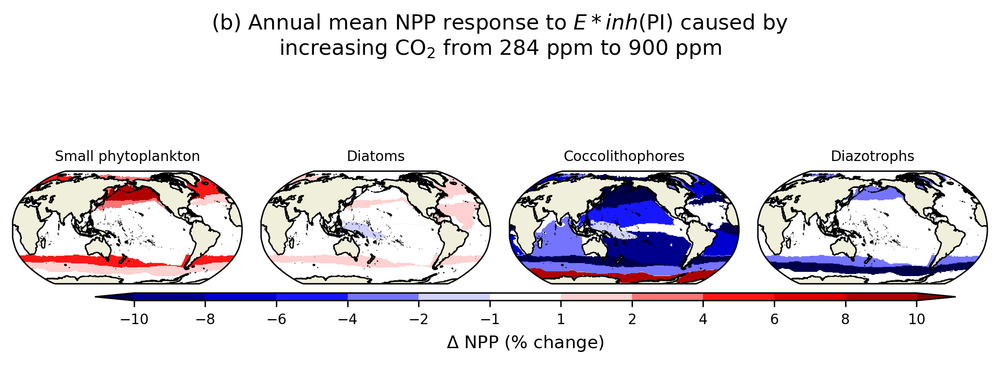

In [23]:
# show effect of co2 on biomes

# uses: cases both have pic/poc scaling but different co2


def get_colors(string,num,add_white = -1):
    #from pylab import *; 
    cmap = cm.get_cmap(string, num)    # PiYG
    colors=[]
    for i in range(cmap.N):
        rgb = cmap(i)[:3] # will return rgba, we take only first 3 so we get rgb
        colors.append(str(matplotlib.colors.rgb2hex(rgb))) 
    if add_white != -1:
        colors.insert(add_white,'#FFFFFF')
    return colors

scale_factor = 12*1e-2*1e-3 *86400
boundaries=np.array(np.linspace(0,12,12))*10
boundaries = np.array([-25,-20,-15,-10,-5,-2,2,5,10,15,20,25])
boundaries = np.array([-10,-8,-6,-4,-2,-1,1,2,4,6,8,10])

colors_diff = get_colors('seismic',12,add_white=6)
cmap = mpl.colors.ListedColormap(colors_diff, "")


land_object=cartopy.feature.NaturalEarthFeature('physical', 'land', '10m',
                                    edgecolor='k',linewidth=0.5,
                                    facecolor=cartopy.feature.COLORS['land'])

scale_factor = 1e-2*86400*365*1e-3
scale_factor = 12*1e-2*1e-3*86400*365

from cartopy.util import add_cyclic_point
if True: #  #REV_EINH0XPI_900PPM - REV_EINH0XPI_284PPM


    var='photoC_sp_zint'
    #new idea, find percent difference between response to UV under 284 ppm and 900 ppm
    HALOGEN_284PPM = np.array(cesm_ds2[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR_284PPM = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN_284PPM-REGULAR_284PPM
    diff_both_284PPM = diff_both * REGULAR_284PPM**-1*100;

    HALOGEN_900PPM = np.array(cesm_ds2[REV_EINHPI_900PPM][var][0]*scale_factor)
    REGULAR_900PPM = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    diff_both = HALOGEN_900PPM-REGULAR_900PPM
    diff_both_900PPM = diff_both * REGULAR_900PPM**-1*100;

    diff_both = diff_both_900PPM - diff_both_284PPM
    
    TLONG = cesm_ds2[CASES[0]]['TLONG']; TLAT = cesm_ds2[CASES[0]]['TLAT']
    fig,(ax,ax2,ax3,ax4)= plt.subplots(1,4,figsize =(8,3),facecolor='w',subplot_kw=dict(projection=ccrs.Robinson(central_longitude=-180))) 
    fig.suptitle('(b) Annual mean NPP response to $E*{inh}$(PI) caused by \nincreasing CO$_2$ from 284 ppm to 900 ppm')# CO$_2$(900 ppm) - CO$_2$(284 ppm) ')
    
    pc1=ax.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax.coastlines(); ax.add_feature(land_object)
    ax.set_title('Small phytoplankton',fontsize=8)
    var='photoC_diat_zint'
    HALOGEN_284PPM = np.array(cesm_ds2[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR_284PPM = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN_284PPM-REGULAR_284PPM
    diff_both_284PPM = diff_both * REGULAR_284PPM**-1*100;

    HALOGEN_900PPM = np.array(cesm_ds2[REV_EINHPI_900PPM][var][0]*scale_factor)
    REGULAR_900PPM = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    diff_both = HALOGEN_900PPM-REGULAR_900PPM
    diff_both_900PPM = diff_both * REGULAR_900PPM**-1*100;

    diff_both = diff_both_900PPM - diff_both_284PPM
    pc2=ax2.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax2.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax2.coastlines(); ax2.add_feature(land_object)
    ax2.set_title('Diatoms',fontsize=8)

    
    var='photoC_cocco_zint'
    HALOGEN_284PPM = np.array(cesm_ds2[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR_284PPM = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN_284PPM-REGULAR_284PPM
    diff_both_284PPM = diff_both * REGULAR_284PPM**-1*100;

    HALOGEN_900PPM = np.array(cesm_ds2[REV_EINHPI_900PPM][var][0]*scale_factor)
    REGULAR_900PPM = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    diff_both = HALOGEN_900PPM-REGULAR_900PPM
    diff_both_900PPM = diff_both * REGULAR_900PPM**-1*100;

    diff_both = diff_both_900PPM - diff_both_284PPM # UV inhibition due to increased co2

    pc3=ax3.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax3.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax3.coastlines(); ax3.add_feature(land_object)
    ax3.set_title('Coccolithophores',fontsize=8)
    
    var='photoC_diaz_zint'
    HALOGEN_284PPM = np.array(cesm_ds2[REV_EINHPI_284PPM][var][0]*scale_factor)
    REGULAR_284PPM = np.array(cesm_ds2[REV_EINH0XPI_284PPM][var][0]*scale_factor)
    diff_both = HALOGEN_284PPM-REGULAR_284PPM
    diff_both_284PPM = diff_both * REGULAR_284PPM**-1*100;

    HALOGEN_900PPM = np.array(cesm_ds2[REV_EINHPI_900PPM][var][0]*scale_factor)
    REGULAR_900PPM = np.array(cesm_ds2[REV_EINH0XPI_900PPM][var][0]*scale_factor)
    diff_both = HALOGEN_900PPM-REGULAR_900PPM
    diff_both_900PPM = diff_both * REGULAR_900PPM**-1*100;

    diff_both = diff_both_900PPM - diff_both_284PPM # UV inhibition due to increased co2

    pc4=ax4.contourf(TLONG,TLAT,diff_both,colors=colors_diff,levels=boundaries,transform=ccrs.PlateCarree(),extend='both')
    ax4.contour(TLONG,TLAT,diff_both,colors='k',levels=boundaries,transform=ccrs.PlateCarree(),linewidths=0.01)
    ax4.coastlines(); ax4.add_feature(land_object)
    ax4.set_title('Diazotrophs',fontsize=8)
    
    position = fig.add_axes([0.10,0.22,0.85,0.02])
    cbar1 = fig.colorbar(pc1,extend='both',cax=position,orientation='horizontal')#,norm=mpl.colors.BoundaryNorm(boundaries,ncolors=len(boundaries)-1,clip=False))
    cbar1.ax.tick_params(labelsize=8)
    cbar1.set_ticks(boundaries)
    cbar1.set_label('$\Delta$ NPP (% change)');#cbar1.set_label('g C $yr^{-1}$')
    fig.tight_layout(); plt.show()

    #### NEW PLOT IDEA: SHOW ACTUAL NPP OF PI AND SHOW ANOMALY IN E*INH PI !!!!! ( DELTA OF HALOGEN - PI % CHANGE )
    

In [24]:
for case in CASES:
    print(files_h0[case][0])
    print(files_h0[case][-1])
    

['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv',
 'CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm',
 'CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv',
 'CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv']

In [8]:

def separate_by_month_arrays(dataset):
	k=0
	jan=[];feb=[];march=[];apr=[];may=[];jun=[];july=[];aug=[];sep=[];oc=[];nov=[];dec=[];
	while k <= (len(dataset)-12):
		jan.append((dataset[k]))
		feb.append((dataset[k+1]))
		march.append((dataset[k+2]))
		apr.append((dataset[k+3]))
		may.append((dataset[k+4]))
		jun.append((dataset[k+5]))
		july.append((dataset[k+6]))
		aug.append((dataset[k+7]))
		sep.append((dataset[k+8]))
		oc.append((dataset[k+9]))
		nov.append((dataset[k+10]))
		dec.append((dataset[k+11]))
		k = k+12;
	return [jan,feb,march,apr,may,jun,july,aug,sep,oc,nov,dec]


In [21]:
for BIOME_NUMBER in range(16,17):
    extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
    TAREA = extract.variables['TAREA'][:]*(100**-2)
    TAREA_biome = TAREA
    TAREA_biome[meanMask!=BIOME_NUMBER] = 0 # set TAREA equal to 0 outside of the biomes 
    #TAREA_biome[meanMask==BIOME_NUMBER]=1 # set TAREA equal to 1 for everything outside of the biome limits
    #scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365
    scale_factor=1e-3*12*1e-15*86400*365*1e-2
    data={}
    for case in CASES:
        #var='photoC_cocco_zint'
        data[case]={}
        VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
        for var in VARS:
            data[case][var]=[]
        print(case)
        for fi in files_h0[case][:]:
            extract = nc4.Dataset(fi,'r')
            for var in VARS:
                if True:#case in [CONTROL_4P2Z,EINH_4P2Z,HALOGEN_CASE_4P2Z]: # assume all have coccolithophores 
                    tempdata=np.nansum(np.nansum(extract.variables[var][:]*TAREA_biome,axis=2),axis=1)*scale_factor
                for t in range(len(tempdata)):
                    data[case][var].append(tempdata[t])

CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv


In [ ]:
case_labels={}; case_colors={}
var='photoC_cocco_zint'; case_labels[var]='Coccolithophores'; case_colors[var]='grey'
var='photoC_sp_zint'; case_labels[var]='Small phytoplankton'; case_colors[var]='green'
var='photoC_diat_zint'; case_labels[var]='Diatoms'; case_colors[var]='blue'
var='photoC_TOT_zint'; case_labels[var]='All phytoplankton'; case_colors[var]='k'
VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
BIOME_NUMBER=16
if True:
        plt.figure(figsize=[7,2.3])
        for var in VARS:
            #case_label=case_labels[var]; case_color = case_colors[var]
            #plot_data = data[EINHX20_DATM_CNL_4P2Z_284PPM][var] - data[EINHX20_DATM_CNL_4P2Z_900PPM][var]
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einh0xpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einhpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900_einh0xpi = CLIMO_MEAN_900
            #plot_data_900_einh0xpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100
            
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900 = CLIMO_MEAN_900
            plot_data_900_einhpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100

            # now create percentages ???
            diff_900 = plot_data_900_einhpi - plot_data_900_einh0xpi
            diff_900 = diff_900 * (plot_data_900_einh0xpi**-1)*100.0
            diff_284 = plot_data_284_einhpi - plot_data_284_einh0xpi
            diff_284 = diff_284*(plot_data_284_einh0xpi**-1)*100.0
            plot_data = diff_900 - diff_284 # percent difference between effects 
            
            
            ts=np.linspace(1,len(plot_data),len(plot_data))
            plt.scatter(ts,plot_data,color=case_colors[var],s=2)
            plt.plot(ts,plot_data,case_colors[var],linestyle='-',label=case_labels[var])
        
        plt.title('(c)  Biome-'+str(BIOME_NUMBER)+' NPP change under $E*_{inh}$(PI) caused by \nincreasing CO$_2$ from 284 ppm to 900 ppm'); plt.xlabel('Time (months)'); plt.ylabel('Phytoplankton NPP \n(% change)')
        props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
        #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
        plt.grid(); #plt.ylim([0,6]); 
        plt.xlim([0.9,12])
        plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
        plt.legend(loc='best',ncol=2,prop={'size':6'}); 
        #plt.savefig('GMD24_figs/Figure8c.eps')
        #plt.savefig('GMD24_figs/Figure8c.png')
        plt.show()


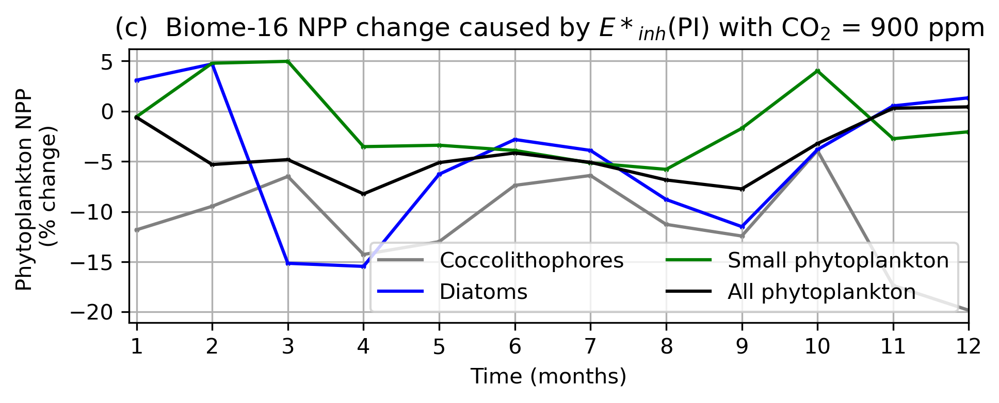

In [24]:
case_labels={}; case_colors={}
var='photoC_cocco_zint'; case_labels[var]='Coccolithophores'; case_colors[var]='grey'
var='photoC_sp_zint'; case_labels[var]='Small phytoplankton'; case_colors[var]='green'
var='photoC_diat_zint'; case_labels[var]='Diatoms'; case_colors[var]='blue'
var='photoC_TOT_zint'; case_labels[var]='All phytoplankton'; case_colors[var]='k'
VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
BIOME_NUMBER=16
if True:
        plt.figure(figsize=[7,2.3])
        for var in VARS:
            #case_label=case_labels[var]; case_color = case_colors[var]
            #plot_data = data[EINHX20_DATM_CNL_4P2Z_284PPM][var] - data[EINHX20_DATM_CNL_4P2Z_900PPM][var]
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einh0xpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einhpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900_einh0xpi = CLIMO_MEAN_900
            #plot_data_900_einh0xpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100
            
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900 = CLIMO_MEAN_900
            plot_data_900_einhpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100

            # now create percentages ???
            diff_900 = plot_data_900_einhpi - plot_data_900_einh0xpi
            diff_900 = diff_900 * (plot_data_900_einh0xpi**-1)*100.0
            diff_284 = plot_data_284_einhpi - plot_data_284_einh0xpi
            diff_284 = diff_284*(plot_data_284_einh0xpi**-1)*100.0
            plot_data = diff_900 #- diff_284 # percent difference between effects 
            
            
            ts=np.linspace(1,len(plot_data),len(plot_data))
            plt.scatter(ts,plot_data,color=case_colors[var],s=2)
            plt.plot(ts,plot_data,case_colors[var],linestyle='-',label=case_labels[var])
        
        plt.title('(c)  Biome-'+str(BIOME_NUMBER)+' NPP change caused by $E*_{inh}$(PI) with CO$_2$ = 900 ppm'); plt.xlabel('Time (months)'); plt.ylabel('Phytoplankton NPP \n(% change)')
        props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
        #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
        plt.grid(); #plt.ylim([0,6]); 
        plt.xlim([0.9,12])
        plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
        plt.legend(loc='best',ncol=2); 
        #plt.savefig('GMD24_figs/Figure8c.eps')
        #plt.savefig('GMD24_figs/Figure8c.png')
        plt.show()


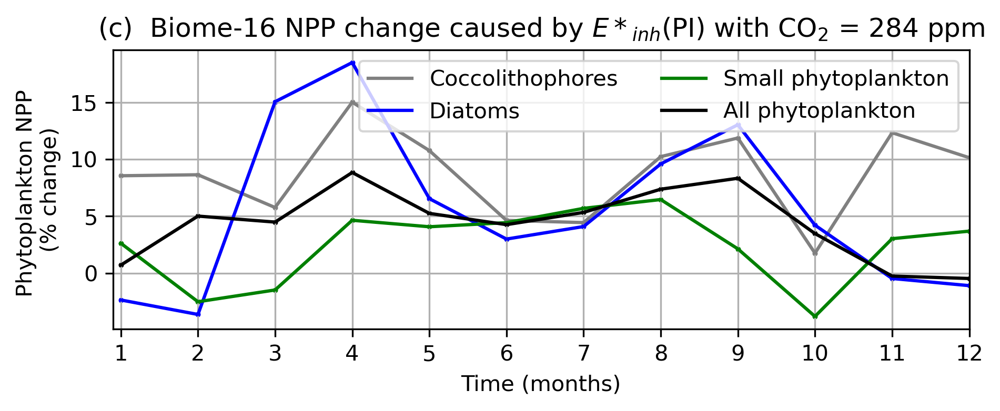

In [25]:
case_labels={}; case_colors={}
var='photoC_cocco_zint'; case_labels[var]='Coccolithophores'; case_colors[var]='grey'
var='photoC_sp_zint'; case_labels[var]='Small phytoplankton'; case_colors[var]='green'
var='photoC_diat_zint'; case_labels[var]='Diatoms'; case_colors[var]='blue'
var='photoC_TOT_zint'; case_labels[var]='All phytoplankton'; case_colors[var]='k'
VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
BIOME_NUMBER=16
if True:
        plt.figure(figsize=[7,2.3])
        for var in VARS:
            #case_label=case_labels[var]; case_color = case_colors[var]
            #plot_data = data[EINHX20_DATM_CNL_4P2Z_284PPM][var] - data[EINHX20_DATM_CNL_4P2Z_900PPM][var]
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einh0xpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einhpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900_einh0xpi = CLIMO_MEAN_900
            #plot_data_900_einh0xpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100
            
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900 = CLIMO_MEAN_900
            plot_data_900_einhpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100

            # now create percentages ???
            diff_900 = plot_data_900_einhpi - plot_data_900_einh0xpi
            diff_900 = diff_900 * (plot_data_900_einh0xpi**-1)*100.0
            diff_284 = plot_data_284_einhpi - plot_data_284_einh0xpi
            diff_284 = diff_284*(plot_data_284_einh0xpi**-1)*100.0
            plot_data = diff_284 # percent difference between effects 
            
            
            ts=np.linspace(1,len(plot_data),len(plot_data))
            plt.scatter(ts,plot_data,color=case_colors[var],s=2)
            plt.plot(ts,plot_data,case_colors[var],linestyle='-',label=case_labels[var])
        
        plt.title('(c)  Biome-'+str(BIOME_NUMBER)+' NPP change caused by $E*_{inh}$(PI) with CO$_2$ = 284 ppm'); plt.xlabel('Time (months)'); plt.ylabel('Phytoplankton NPP \n(% change)')
        props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
        #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
        plt.grid(); #plt.ylim([0,6]); 
        plt.xlim([0.9,12])
        plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
        plt.legend(loc='best',ncol=2); 
        #plt.savefig('GMD24_figs/Figure8c.eps')
        #plt.savefig('GMD24_figs/Figure8c.png')
        plt.show()


In [31]:
for BIOME_NUMBER in range(15,16):
    print(BIOME_NUMBER)
    extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
    TAREA = extract.variables['TAREA'][:]*(100**-2)
    TAREA_biome = TAREA
    TAREA_biome[meanMask!=BIOME_NUMBER] = 0 # set TAREA equal to 0 outside of the biomes 
    #TAREA_biome[meanMask==BIOME_NUMBER]=1 # set TAREA equal to 1 for everything outside of the biome limits
    #scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365
    scale_factor=1e-3*12*1e-15*86400*365*1e-2
    data={}
    for case in CASES:
        #var='photoC_cocco_zint'
        data[case]={}
        VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
        for var in VARS:
            data[case][var]=[]
        print(case)
        for fi in files_h0[case][:]:
            extract = nc4.Dataset(fi,'r')
            for var in VARS:
                if True:#case in [CONTROL_4P2Z,EINH_4P2Z,HALOGEN_CASE_4P2Z]: # assume all have coccolithophores 
                    tempdata=np.nansum(np.nansum(extract.variables[var][:]*TAREA_biome,axis=2),axis=1)*scale_factor
                for t in range(len(tempdata)):
                    data[case][var].append(tempdata[t])

15
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv


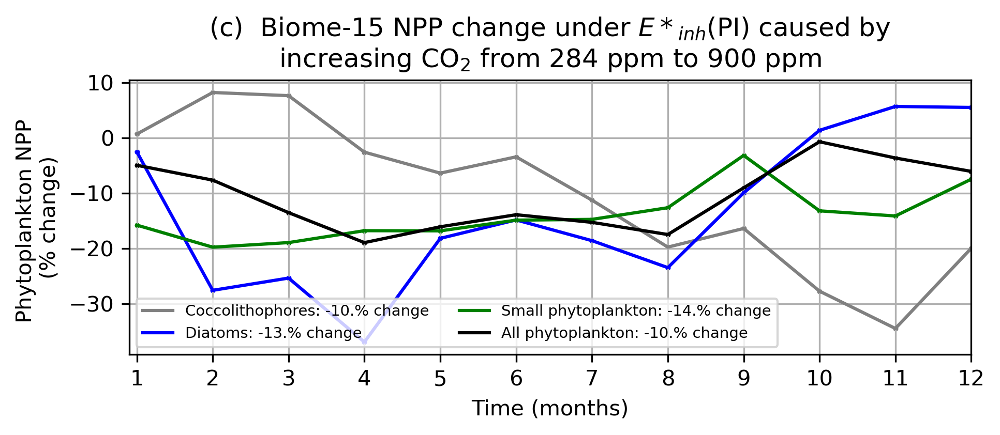

In [32]:
case_labels={}; case_colors={}
var='photoC_cocco_zint'; case_labels[var]='Coccolithophores'; case_colors[var]='grey'
var='photoC_sp_zint'; case_labels[var]='Small phytoplankton'; case_colors[var]='green'
var='photoC_diat_zint'; case_labels[var]='Diatoms'; case_colors[var]='blue'
var='photoC_TOT_zint'; case_labels[var]='All phytoplankton'; case_colors[var]='k'
VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
BIOME_NUMBER=15
if True:
        plt.figure(figsize=[7,2.3])
        for var in VARS:
            #case_label=case_labels[var]; case_color = case_colors[var]
            #plot_data = data[EINHX20_DATM_CNL_4P2Z_284PPM][var] - data[EINHX20_DATM_CNL_4P2Z_900PPM][var]
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einh0xpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einhpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900_einh0xpi = CLIMO_MEAN_900
            #plot_data_900_einh0xpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100
            
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900 = CLIMO_MEAN_900
            plot_data_900_einhpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100

            # now create percentages ???
            diff_900 = plot_data_900_einhpi - plot_data_900_einh0xpi
            diff_900 = diff_900 * (plot_data_900_einh0xpi**-1)*100.0
            diff_284 = plot_data_284_einhpi - plot_data_284_einh0xpi
            diff_284 = diff_284*(plot_data_284_einh0xpi**-1)*100.0
            plot_data = diff_900 - diff_284 # percent difference between effects 

            ann_plot_data = np.nanmean(plot_data)

            '''
            #annual means
            ann_plot_data_900_einhpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var])
            ann_plot_data_900_einh0xpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var])
            ann_plot_data_284_einhpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
            ann_plot_data_284_einh0xpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
        
            
            ann_diff_900 = ann_plot_data_900_einhpi - ann_plot_data_900_einh0xpi
            ann_diff_900 = ann_diff_900 * (ann_plot_data_900_einh0xpi**-1)*100.0
            ann_diff_284 = ann_plot_data_284_einhpi - ann_plot_data_284_einh0xpi
            ann_diff_284 = ann_diff_284*(ann_plot_data_284_einh0xpi**-1)*100.0
            ann_plot_data = ann_diff_900 - ann_diff_284 # percent difference between effects 
            '''
                        
            
            ts=np.linspace(1,len(plot_data),len(plot_data))
            plt.scatter(ts,plot_data,color=case_colors[var],s=2)
            plt.plot(ts,plot_data,case_colors[var],linestyle='-',label=case_labels[var]+': ' +str(ann_plot_data)[0:4]+'% change')
        
        plt.title('(c)  Biome-'+str(BIOME_NUMBER)+' NPP change under $E*_{inh}$(PI) caused by \nincreasing CO$_2$ from 284 ppm to 900 ppm'); plt.xlabel('Time (months)'); plt.ylabel('Phytoplankton NPP \n(% change)')
        props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
        #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
        plt.grid(); #plt.ylim([0,6]); 
        plt.xlim([0.9,12])
        plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
        plt.legend(loc='best',ncol=2,prop={'size':7}); 
        #plt.savefig('GMD24_figs/Figure8c.eps')
        #plt.savefig('GMD24_figs/Figure8c.png')
        plt.show()


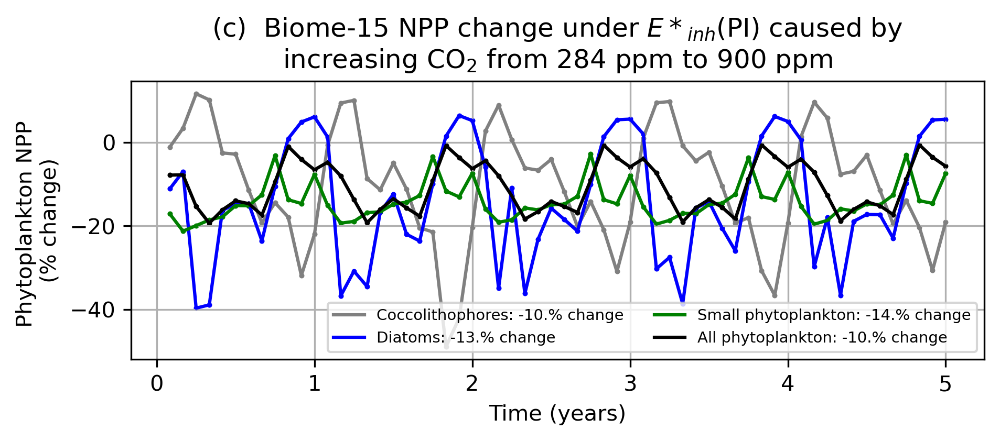

In [36]:
# re-create teh above plot but without months and climatology



case_labels={}; case_colors={}
var='photoC_cocco_zint'; case_labels[var]='Coccolithophores'; case_colors[var]='grey'
var='photoC_sp_zint'; case_labels[var]='Small phytoplankton'; case_colors[var]='green'
var='photoC_diat_zint'; case_labels[var]='Diatoms'; case_colors[var]='blue'
var='photoC_TOT_zint'; case_labels[var]='All phytoplankton'; case_colors[var]='k'
VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
BIOME_NUMBER=15
if True:
        plt.figure(figsize=[7,2.3])
        for var in VARS:
            #case_label=case_labels[var]; case_color = case_colors[var]
            #plot_data = data[EINHX20_DATM_CNL_4P2Z_284PPM][var] - data[EINHX20_DATM_CNL_4P2Z_900PPM][var]
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'][var]
            #CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            #CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            #CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einh0xpi =np.array(plot_data)

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var]
            #CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            #CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            #CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einhpi = np.array(plot_data)

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var]
            #CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            #CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            #CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900_einh0xpi = np.array(plot_data)
            #plot_data_900_einh0xpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100
            
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var]
            #CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            #CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            #CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900 = plot_data
            plot_data_900_einhpi = np.array(plot_data)# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100

            # now create percentages ???
            diff_900 = plot_data_900_einhpi - plot_data_900_einh0xpi
            diff_900 = diff_900 * (plot_data_900_einh0xpi**-1)*100.0
            diff_284 = plot_data_284_einhpi - plot_data_284_einh0xpi
            diff_284 = diff_284*(plot_data_284_einh0xpi**-1)*100.0
            plot_data = diff_900 - diff_284 # percent difference between effects 

            ann_plot_data = np.nanmean(plot_data)

            '''
            #annual means
            ann_plot_data_900_einhpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var])
            ann_plot_data_900_einh0xpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var])
            ann_plot_data_284_einhpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
            ann_plot_data_284_einh0xpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
        
            
            ann_diff_900 = ann_plot_data_900_einhpi - ann_plot_data_900_einh0xpi
            ann_diff_900 = ann_diff_900 * (ann_plot_data_900_einh0xpi**-1)*100.0
            ann_diff_284 = ann_plot_data_284_einhpi - ann_plot_data_284_einh0xpi
            ann_diff_284 = ann_diff_284*(ann_plot_data_284_einh0xpi**-1)*100.0
            ann_plot_data = ann_diff_900 - ann_diff_284 # percent difference between effects 
            '''
                        
            
            ts=np.linspace(1,len(plot_data),len(plot_data))*(1.0/12)
            plt.scatter(ts,plot_data,color=case_colors[var],s=2)
            plt.plot(ts,plot_data,case_colors[var],linestyle='-',label=case_labels[var]+': ' +str(ann_plot_data)[0:4]+'% change')
        
        plt.title('(c)  Biome-'+str(BIOME_NUMBER)+' NPP change under $E*_{inh}$(PI) caused by \nincreasing CO$_2$ from 284 ppm to 900 ppm'); plt.xlabel('Time (years)'); plt.ylabel('Phytoplankton NPP \n(% change)')
        props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
        #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
        plt.grid(); #plt.ylim([0,6]); 
        #plt.xlim([0.9,12])
        #plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
        plt.legend(loc='best',ncol=2,prop={'size':7}); 
        #plt.savefig('GMD24_figs/Figure8c.eps')
        #plt.savefig('GMD24_figs/Figure8c.png')
        plt.show()




In [29]:
for BIOME_NUMBER in range(16,17):
    print(BIOME_NUMBER)
    extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
    TAREA = extract.variables['TAREA'][:]*(100**-2)
    TAREA_biome = TAREA
    TAREA_biome[meanMask!=BIOME_NUMBER] = 0 # set TAREA equal to 0 outside of the biomes 
    #TAREA_biome[meanMask==BIOME_NUMBER]=1 # set TAREA equal to 1 for everything outside of the biome limits
    #scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365
    scale_factor=1e-3*12*1e-15*86400*365*1e-2
    data={}
    for case in CASES:
        #var='photoC_cocco_zint'
        data[case]={}
        VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
        for var in VARS:
            data[case][var]=[]
        print(case)
        for fi in files_h0[case][:]:
            extract = nc4.Dataset(fi,'r')
            for var in VARS:
                if True:#case in [CONTROL_4P2Z,EINH_4P2Z,HALOGEN_CASE_4P2Z]: # assume all have coccolithophores 
                    tempdata=np.nansum(np.nansum(extract.variables[var][:]*TAREA_biome,axis=2),axis=1)*scale_factor
                for t in range(len(tempdata)):
                    data[case][var].append(tempdata[t])

16
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv


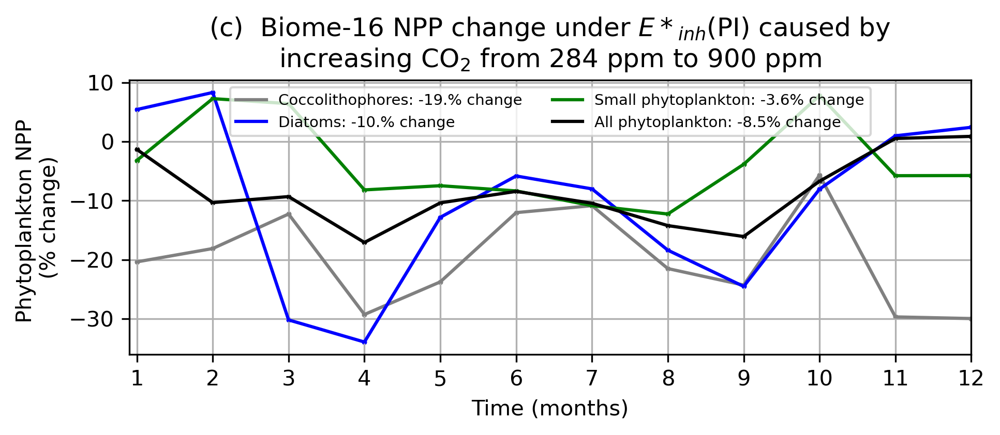

In [30]:
case_labels={}; case_colors={}
var='photoC_cocco_zint'; case_labels[var]='Coccolithophores'; case_colors[var]='grey'
var='photoC_sp_zint'; case_labels[var]='Small phytoplankton'; case_colors[var]='green'
var='photoC_diat_zint'; case_labels[var]='Diatoms'; case_colors[var]='blue'
var='photoC_TOT_zint'; case_labels[var]='All phytoplankton'; case_colors[var]='k'
VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
BIOME_NUMBER=16
if True:
        plt.figure(figsize=[7,2.3])
        for var in VARS:
            #case_label=case_labels[var]; case_color = case_colors[var]
            #plot_data = data[EINHX20_DATM_CNL_4P2Z_284PPM][var] - data[EINHX20_DATM_CNL_4P2Z_900PPM][var]
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einh0xpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einhpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900_einh0xpi = CLIMO_MEAN_900
            #plot_data_900_einh0xpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100
            
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900 = CLIMO_MEAN_900
            plot_data_900_einhpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100

            # now create percentages ???
            diff_900 = plot_data_900_einhpi - plot_data_900_einh0xpi
            diff_900 = diff_900 * (plot_data_900_einh0xpi**-1)*100.0
            diff_284 = plot_data_284_einhpi - plot_data_284_einh0xpi
            diff_284 = diff_284*(plot_data_284_einh0xpi**-1)*100.0
            plot_data = diff_900 - diff_284 # percent difference between effects 
            
            ann_plot_data = np.nanmean(plot_data)

            '''
            #annual means
            ann_plot_data_900_einhpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var])
            ann_plot_data_900_einh0xpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var])
            ann_plot_data_284_einhpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
            ann_plot_data_284_einh0xpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
        
            
            ann_diff_900 = ann_plot_data_900_einhpi - ann_plot_data_900_einh0xpi
            ann_diff_900 = ann_diff_900 * (ann_plot_data_900_einh0xpi**-1)*100.0
            ann_diff_284 = ann_plot_data_284_einhpi - ann_plot_data_284_einh0xpi
            ann_diff_284 = ann_diff_284*(ann_plot_data_284_einh0xpi**-1)*100.0
            ann_plot_data = ann_diff_900 - ann_diff_284 # percent difference between effects 
            '''
            
            
            ts=np.linspace(1,len(plot_data),len(plot_data))
            plt.scatter(ts,plot_data,color=case_colors[var],s=2)
            plt.plot(ts,plot_data,case_colors[var],linestyle='-',label=case_labels[var]+': ' +str(ann_plot_data)[0:4]+'% change')
        
        plt.title('(c)  Biome-'+str(BIOME_NUMBER)+' NPP change under $E*_{inh}$(PI) caused by \nincreasing CO$_2$ from 284 ppm to 900 ppm'); plt.xlabel('Time (months)'); plt.ylabel('Phytoplankton NPP \n(% change)')
        props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
        #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
        plt.grid(); #plt.ylim([0,6]); 
        plt.xlim([0.9,12])
        plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
        plt.legend(loc='best',ncol=2,prop={'size':7}); 
        #plt.savefig('GMD24_figs/Figure8c.eps')
        #plt.savefig('GMD24_figs/Figure8c.png')
        plt.show()


In [26]:
for BIOME_NUMBER in range(2,3):
    print(BIOME_NUMBER)
    extract = nc4.Dataset(files_h0[CASES[0]][0],'r')
    TAREA = extract.variables['TAREA'][:]*(100**-2)
    TAREA_biome = TAREA
    TAREA_biome[meanMask!=BIOME_NUMBER] = 0 # set TAREA equal to 0 outside of the biomes 
    #TAREA_biome[meanMask==BIOME_NUMBER]=1 # set TAREA equal to 1 for everything outside of the biome limits
    #scale_factor=86400.0*12.0*(1/1000.0)*(1/100.0)*(1e-15)*365
    scale_factor=1e-3*12*1e-15*86400*365*1e-2
    data={}
    for case in CASES:
        #var='photoC_cocco_zint'
        data[case]={}
        VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
        for var in VARS:
            data[case][var]=[]
        print(case)
        for fi in files_h0[case][:]:
            extract = nc4.Dataset(fi,'r')
            for var in VARS:
                if True:#case in [CONTROL_4P2Z,EINH_4P2Z,HALOGEN_CASE_4P2Z]: # assume all have coccolithophores 
                    tempdata=np.nansum(np.nansum(extract.variables[var][:]*TAREA_biome,axis=2),axis=1)*scale_factor
                for t in range(len(tempdata)):
                    data[case][var].append(tempdata[t])

2
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv
CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv


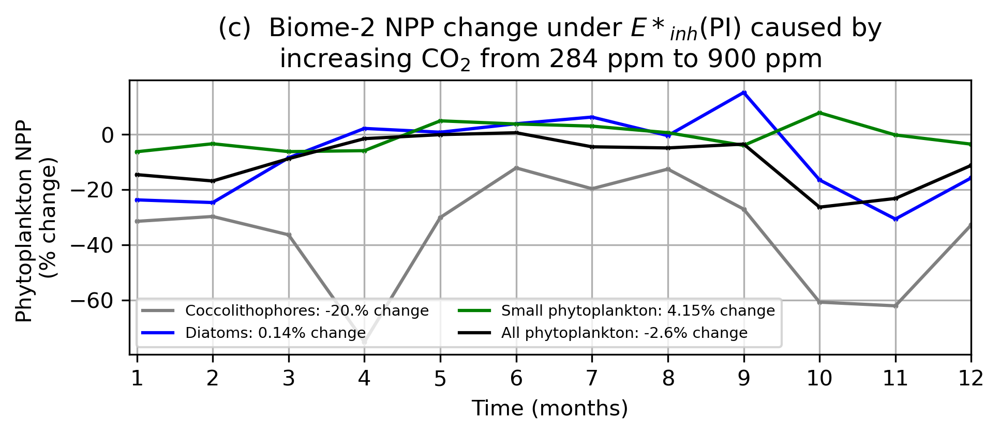

In [27]:
case_labels={}; case_colors={}
var='photoC_cocco_zint'; case_labels[var]='Coccolithophores'; case_colors[var]='grey'
var='photoC_sp_zint'; case_labels[var]='Small phytoplankton'; case_colors[var]='green'
var='photoC_diat_zint'; case_labels[var]='Diatoms'; case_colors[var]='blue'
var='photoC_TOT_zint'; case_labels[var]='All phytoplankton'; case_colors[var]='k'
VARS=['photoC_cocco_zint','photoC_diat_zint','photoC_sp_zint','photoC_TOT_zint']
#BIOME_NUMBER=2
if True:
        plt.figure(figsize=[7,2.3])
        for var in VARS:
            #case_label=case_labels[var]; case_color = case_colors[var]
            #plot_data = data[EINHX20_DATM_CNL_4P2Z_284PPM][var] - data[EINHX20_DATM_CNL_4P2Z_900PPM][var]
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einh0xpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_284 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_284_einhpi = CLIMO_MEAN_284

            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900_einh0xpi = CLIMO_MEAN_900
            #plot_data_900_einh0xpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100
            
            plot_data=data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var]
            CLIMO_MEAN = separate_by_month_arrays(plot_data) # output is 12 x 5 years 
            CLIMO_STD = np.nanstd(CLIMO_MEAN,axis=1) # 
            CLIMO_MEAN_900 = np.nanmean(CLIMO_MEAN,axis=1) 
            plot_data_900 = CLIMO_MEAN_900
            plot_data_900_einhpi = CLIMO_MEAN_900# - CLIMO_MEAN_284
            #plot_data =(plot_data * CLIMO_MEAN_284**-1) * 100

            # now create percentages ???
            diff_900 = plot_data_900_einhpi - plot_data_900_einh0xpi
            diff_900 = diff_900 * (plot_data_900_einh0xpi**-1)*100.0
            diff_284 = plot_data_284_einhpi - plot_data_284_einh0xpi
            diff_284 = diff_284*(plot_data_284_einh0xpi**-1)*100.0
            plot_data = diff_900 - diff_284 # percent difference between effects 


            #annual means
            ann_plot_data_900_einhpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_EinhPI_900ppm_fv'][var])
            ann_plot_data_900_einh0xpi = np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL04_PICPOC06_Einh0xPI_900ppm'][var])
            ann_plot_data_284_einhpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
            ann_plot_data_284_einh0xpi=np.nanmean(data['CESM214_tuvcpl_datm_marbl4p2z_CNL05_PICPOC06_Einh0xPI_284ppm_fv'][var])
        
            
            ann_diff_900 = ann_plot_data_900_einhpi - ann_plot_data_900_einh0xpi
            ann_diff_900 = ann_diff_900 * (ann_plot_data_900_einh0xpi**-1)*100.0
            ann_diff_284 = ann_plot_data_284_einhpi - ann_plot_data_284_einh0xpi
            ann_diff_284 = ann_diff_284*(ann_plot_data_284_einh0xpi**-1)*100.0
            ann_plot_data = ann_diff_900 - ann_diff_284 # percent difference between effects 

            
            
            ts=np.linspace(1,len(plot_data),len(plot_data))
            plt.scatter(ts,plot_data,color=case_colors[var],s=2)
            plt.plot(ts,plot_data,case_colors[var],linestyle='-',label=case_labels[var]+': ' +str(ann_plot_data)[0:4]+'% change')
        
        plt.title('(c)  Biome-'+str(BIOME_NUMBER)+' NPP change under $E*_{inh}$(PI) caused by \nincreasing CO$_2$ from 284 ppm to 900 ppm'); plt.xlabel('Time (months)'); plt.ylabel('Phytoplankton NPP \n(% change)')
        props=dict(boxstyle='round',facecolor='wheat',alpha=0.5)
        #ax.text(0.53,0.65,'UV inhibition\n     added',fontsize=14,verticalalignment='top',bbox=props)
        plt.grid(); #plt.ylim([0,6]); 
        plt.xlim([0.9,12])
        plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12],('1','2','3','4','5','6','7','8','9','10','11','12'))
        plt.legend(loc='best',ncol=2,prop={'size':7}); 
        #plt.savefig('GMD24_figs/Figure8c.eps')
        #plt.savefig('GMD24_figs/Figure8c.png')
        plt.show()
